In [3]:
import numpy as np
import scipy.integrate
import matplotlib.pyplot as plt
import random 
import copy
from itertools import compress
from itertools import groupby
import scipy.optimize as opt
import time
import matplotlib
import pickle

In [4]:
import matplotlib
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 22}

matplotlib.rc('font', **font)

In [5]:
def system2_ODEs(t,z,params):
    a, b = z
    kdA, kdB, gammaAK, gammaBK, gammaAP, gammaBP, Atot, Btot, F = params
    
    sa = np.sqrt(1 + 2*a)
    sb = np.sqrt(1 + 2*b)
    
    k = a**2 / ((1 + sa) * (1 + a + sa))
    p = b**2 / ((1 + sb) * (1 + b + sb))
    f_p = (F + kdB * p)
    
    dadt = -2 * gammaAK * a / (1 + sa) * kdA * k + gammaAP * (2 * Atot / kdA - a) * f_p
    dbdt = -2 * gammaBK * b / (1 + sb) * kdA * k + gammaBP * (2 * Btot / kdB - b) * f_p
    
    dzdt = [dadt, dbdt]
    return(dzdt)

In [6]:
def system2_Jac(t,z,params):
    kdA, kdB, gammaAK, gammaBK, gammaAP, gammaBP, Atot, Btot, F = params
    a, b = z
    
    sa = np.sqrt(1 + 2*a)
    sb = np.sqrt(1 + 2*b)
    
    jac = np.array([[(a**2*(-1 - 2/sa)*kdA*gammaAK)/(1 + a + sa)**2 - F*gammaAP - 
                     (b**2*kdB*gammaAP)/((1 + sb)*(1 + b + sb)),
                     (b*(4*(1 + sb) + b*(7 + b + 3*sb))*(2*Atot - a*kdA)*kdB*gammaAP)/
                     (sb*(1 + sb)**2*(1 + b + sb)**2*kdA)],
    [(-2*a*(4*(1 + sa) + a*(7 + a + 3*sa))*b*kdA*gammaBK)/
     (sa*(1 + sa)**2*(1 + a + sa)**2*(1 + sb)),
     (-4*a*b*Btot*gammaBP + 4*a*(-1 + sb)*Btot*gammaBP - 3*a*b**3*kdB*gammaBP + 
      b**2*((2 + 3*a - 2*sa - a*sa)*kdA*gammaBK + a*(2*Btot - 3*kdB + sb*(-2*F + 3*kdB))*gammaBP))/
      (2.*a*b**2*sb)]])
        
    return jac

In [7]:
def system2_Sol(tSpan, params, initialConditions, toPlot, plotLog=False, atol=1e-12, rtol=1e-6):
    odeSol = scipy.integrate.solve_ivp(lambda tSpan, z: system2_ODEs(tSpan, z, params),
                                        tSpan,initialConditions,method = 'Radau', vectorized=False,
                                        jac = lambda tSpan,z: system2_Jac(tSpan,z,params),
                                        atol=atol, rtol=rtol)
    z = np.transpose(odeSol.y)
    t = odeSol.t
    
    if toPlot:
        system2_Plot_for_fig(t, z, params, initialConditions, plotLog=plotLog)
    return z,t

In [8]:
def system2_Plot_for_fig(t, z, params, initialConditions, plotLog=False):
    
    tHr = t / (60*60)  # so time is measured in hours
    lenTStart = int(len(z[:,0])/5)

    kdA, kdB, gammaAK, gammaBK, gammaAP, gammaBP, Atot, Btot, F = params
    a = z[:,0]
    b = z[:,1]
       
    Ap = Atot - (kdA / 2) * a
    Bp = Btot - (kdB / 2) * b
    
    plt.plot(tHr[lenTStart:], Ap[lenTStart:] + Bp[lenTStart:], 'b', label=r'$A^p$')
    plt.ylabel(r'Total phosphorylation ($\mu$M)')
    plt.xlabel('Time (h)')
    if plotLog:
        plt.yscale('log')
    if kdA == 0.0017365224716919757:
        plt.ylim([1, 5])
        plt.yticks([1, 3, 5])
    plt.show()

In [9]:
def save(obj, filename):
# =============================================================================
#     Save an object to a file
# =============================================================================
    if not filename[-7:] == '.pickle':
        filename = filename + '.pickle'
    with open(filename, 'wb') as handle:
        pickle.dump(obj, handle, protocol=4) #protocol 4 came out with Python version 3.4


def load(filename):
# =============================================================================
#     Load an object from a file
# =============================================================================
    if not filename[-7:] == '.pickle':
        filename = filename + '.pickle'
    with open(filename, 'rb') as handle:
        data = pickle.load(handle)
    return data

(oscParamsAll, oscMaxFAll, oscKdAAll, oscKdBAll, oscPeriodsAll, nonOscParamsAll, 
 nonOscMaxFAll, nonOscKdAAll, nonOscKdBAll) = load(
         'sys2_no_approx_500000.pickle')

oscParams = np.array(oscParamsAll)
periods = np.array(oscPeriodsAll)
# Each parameter set consists of:
# kdA, kdB, gammaAK, gammaBK, gammaAP, gammaBP, Atot, Btot, F = params

In [10]:
print(periods[0])
oscParams[0]

14250.344184295478


array([1.18058907e-02, 1.52800178e-01, 2.21428571e-01, 2.21428571e-01,
       1.94757282e-01, 1.94757282e-01, 3.00270155e+00, 5.03983158e-01,
       8.43528957e-07])

In [11]:
print(periods[1])
oscParams[1]

17866.5047325637


array([1.96306705e-03, 6.04299238e-03, 2.21428571e-01, 2.21428571e-01,
       1.94757282e-01, 1.94757282e-01, 5.41695751e+01, 4.77212000e-01,
       5.05814445e-06])

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


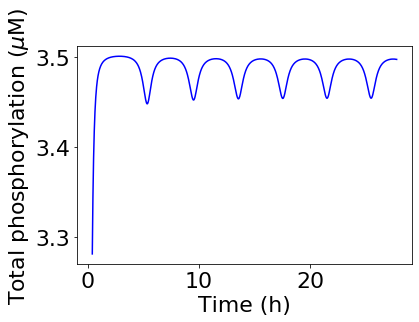

max(abs(dzdt)) = 9.553684793770162e-05
period = 14323.063175526855


In [12]:
params = oscParams[0]
tmax = 100000 #maximum time we'll integrate to

kdA, kdB, gammaAK, gammaBK, gammaAP, gammaBP, Atot, Btot, F = params

initialConditions = [2 * Atot / kdA, 2 * Btot / kdB]
tSpan = [0,tmax] #np.linspace(0,tmax,numTimePoints)

toPlot = True

z,t = system2_Sol(tSpan,params,initialConditions,toPlot,False)
a = z[:,0]
b = z[:,1]

dzdt = system2_ODEs(t[-1], z[-1,:], params)
print('max(abs(dzdt)) = ' + str(max(np.abs(dzdt))))

dbdt = (b[1:] - b[0:-1])/(t[1:]-t[0:-1])

groups = []
uniquekeys = []
counter = 0
prevCounter = 0
prevPrevCounter = 0
prevCounterArray = []
xChange = [] #how much does the value of Ao change in between each inflection point?
for k, g in groupby(np.sign(dbdt)):
    groups.append(list(g))
    c = len(uniquekeys) #counter that just increases by one in each for loop
    xChange.append(np.sum(dbdt[counter:counter+len(groups[c])]*
                          (t[counter+1:counter+len(groups[c])+1]-t[counter:counter+len(groups[c])])))
    prevPrevPrevCounter = prevPrevCounter
    prevPrevCounter = prevCounter
    prevCounter = counter
    counter += len(groups[c])
    uniquekeys.append(k)
    
    prevCounterArray += [t[counter]]
nIP = len(uniquekeys)

period = prevCounterArray[-4] - prevCounterArray[-6]
print('period = ' + str(period))
# print('kMKo = ' + str((kuko + kcko)/kbko) + '; kMKc = ' + str((kukc + kckc)/kbkc))
# print('kMPo = ' + str((kupo + kcpo)/kbpo) + '; kMPc = ' + str((kupc + kcpc)/kbpc))
# print('kcK = ' + str(kcko) + '; kcP = ' + str(kcpo))
# print('kDKo = ' + str(kukio/kbkio) + '; kDKc = ' + str(kukic/kbkic))

In [13]:
var_list = [r'$k_{d\kappa}$ $(\mu$M$)$', r'$k_{d\rho}$ $(\mu$M$)$',
            r'$\eta_{K\kappa} = \eta_{K\rho}$', r'$\eta_{P\kappa} = \eta_{P\rho}$', 
            r'$\eta_{K\kappa} = \eta_{K\rho}$', r'$\eta_{P\kappa} = \eta_{P\rho}$', 
            r'$\kappa_{tot}$ $(\mu$M$)$', r'$\rho_{tot}$ $(\mu$M$)$', r'$\tilde{P}$ $(\mu$M$)$']

def robustness(var_index, var_arr, logscale=False, init_tmax=1e6):    
    period_arr = np.zeros(len(var_arr))
    period = 0  # to initialize
    
    for e, var in enumerate(var_arr):
        params = [1.18058907e-02, 1.52800178e-01, 
                  2.21428571e-01, 2.21428571e-01, 1.94757282e-01, 1.94757282e-01, 
                  3.00270155e+00, 5.03983158e-01, 8.43528957e-07]
        params[var_index] = var
        if var_index == 2 or var_index == 3:
            params[var_index + 2] = var
        if var_index == 4 or var_index == 5:
            params[var_index - 2] = var
            
        kdA, kdB, gammaAK, gammaBK, gammaAP, gammaBP, Atot, Btot, F = params
        print(var_list[var_index] + ' = ' + str(var))
        
        initialConditions = [2 * Atot / kdA, 2 * Btot / kdB]
        
        if period == 0:
            tmax = init_tmax #maximum time we'll integrate to
        else:
            if init_tmax > 1e6:
                tmax = min(init_tmax, period * 200)
            else:
                tmax = period * 50
        tSpan = [0,tmax] #np.linspace(0,tmax,numTimePoints)

        toPlot = True

        z,t = system2_Sol(tSpan, params, initialConditions, toPlot, True)
        a = z[:,0]
        b = z[:,1]

        dbdt = (b[1:] - b[0:-1])/(t[1:]-t[0:-1])

        groups = []
        uniquekeys = []
        counter = 0
        prevCounter = 0
        prevPrevCounter = 0
        prevCounterArray = []
        xChange = [] #how much does the value of Ao change in between each inflection point?
        for k, g in groupby(np.sign(dbdt)):
            groups.append(list(g))
            c = len(uniquekeys) #counter that just increases by one in each for loop
            xChange.append(np.sum(dbdt[counter:counter+len(groups[c])]*
                                  (t[counter+1:counter+len(groups[c])+1]-t[counter:counter+len(groups[c])])))
            prevPrevPrevCounter = prevPrevCounter
            prevPrevCounter = prevCounter
            prevCounter = counter
            counter += len(groups[c])
            uniquekeys.append(k)

            prevCounterArray += [t[counter]]
        nIP = len(uniquekeys)

        if (nIP > 10 and min(np.abs(xChange[:-1] / xChange[5])) > 0.5 and 
            t[-3]/t[-2] > 0.95 and abs((abs(xChange[3*len(xChange)//4]) - abs(xChange[-2]))/xChange[-2]) < 1 and 
            not (z<-10000).any()):
            period = prevCounterArray[-4] - prevCounterArray[-6]
        else:
            period = 0
        print('period = ' + str(period))
        print('nIP = ' + str(nIP))
        period_arr[e] = period
        
    plt.figure()
    plt.plot(var_arr, period_arr, '.')
    plt.xlabel(var_list[var_index])
    plt.ylabel(r'Period $(s)$')
    if logscale:
        plt.xscale('log')
    plt.show()
    
    return(period_arr / 3600)  # So it's in units of hrs

In [14]:
num_points = 50

$k_{d\kappa}$ $(\mu$M$)$ = 0.001


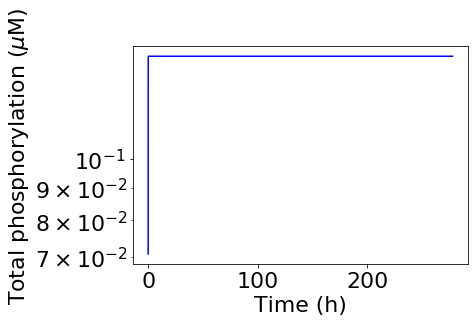

period = 0
nIP = 2
$k_{d\kappa}$ $(\mu$M$)$ = 0.0017959183673469388


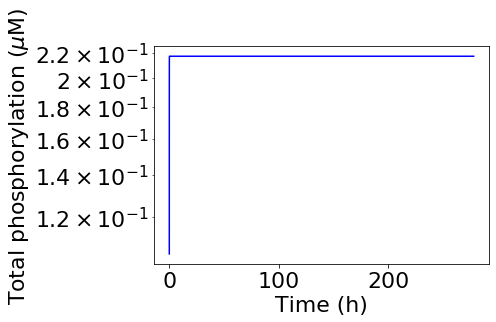

period = 0
nIP = 2
$k_{d\kappa}$ $(\mu$M$)$ = 0.0025918367346938775


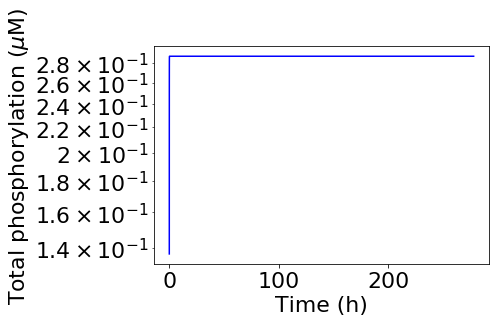

period = 0
nIP = 3
$k_{d\kappa}$ $(\mu$M$)$ = 0.003387755102040816


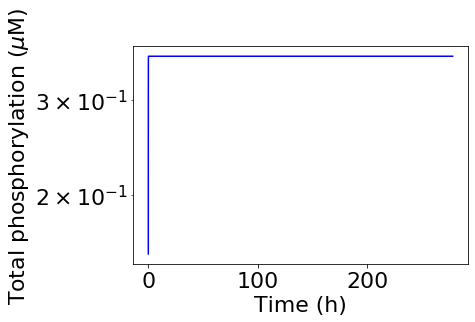

period = 0
nIP = 4
$k_{d\kappa}$ $(\mu$M$)$ = 0.004183673469387755


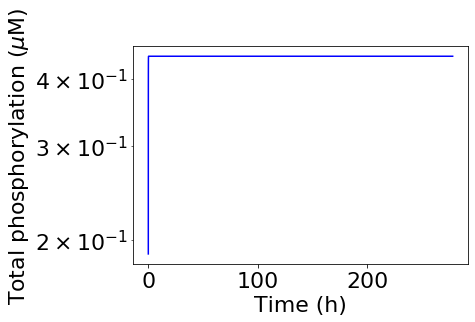

period = 0
nIP = 2
$k_{d\kappa}$ $(\mu$M$)$ = 0.004979591836734694


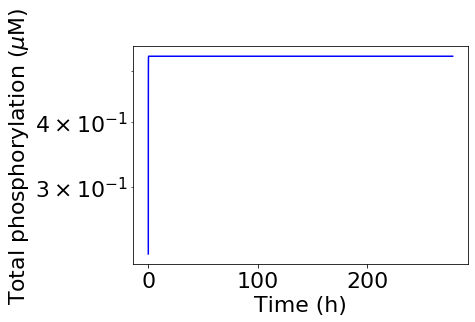

period = 0
nIP = 4
$k_{d\kappa}$ $(\mu$M$)$ = 0.005775510204081632


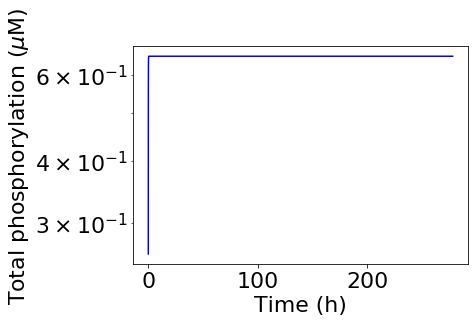

period = 0
nIP = 1
$k_{d\kappa}$ $(\mu$M$)$ = 0.006571428571428571


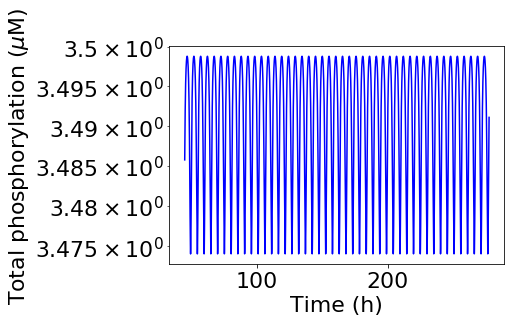

period = 18631.314300147817
nIP = 107
$k_{d\kappa}$ $(\mu$M$)$ = 0.00736734693877551


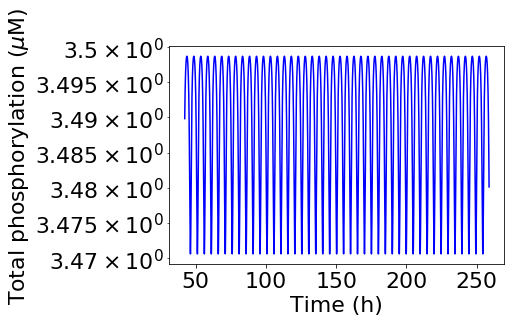

period = 17813.641655163374
nIP = 104
$k_{d\kappa}$ $(\mu$M$)$ = 0.00816326530612245


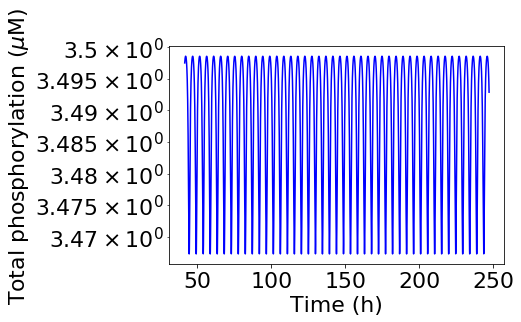

period = 16917.109319524723
nIP = 104
$k_{d\kappa}$ $(\mu$M$)$ = 0.008959183673469387


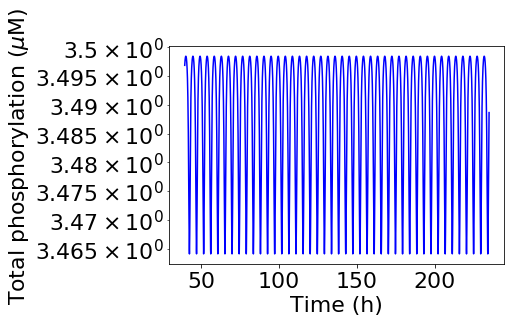

period = 16522.799782935646
nIP = 103
$k_{d\kappa}$ $(\mu$M$)$ = 0.009755102040816328


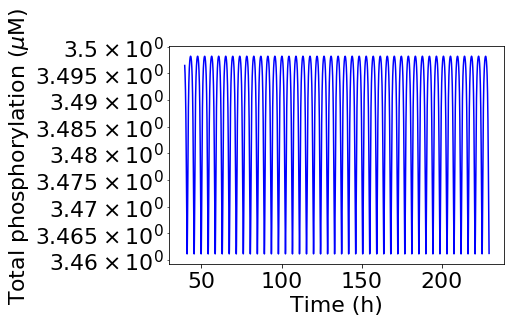

period = 15880.134628002415
nIP = 105
$k_{d\kappa}$ $(\mu$M$)$ = 0.010551020408163265


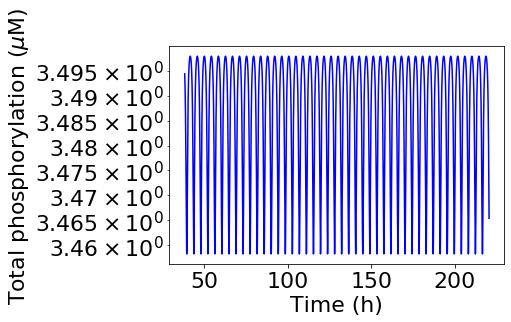

period = 15057.681042897399
nIP = 104
$k_{d\kappa}$ $(\mu$M$)$ = 0.011346938775510202


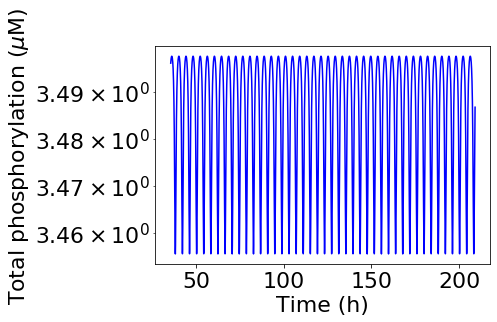

period = 14591.1977954061
nIP = 103
$k_{d\kappa}$ $(\mu$M$)$ = 0.012142857142857143


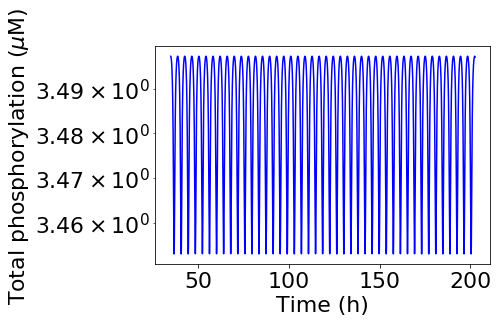

period = 14132.97150353773
nIP = 104
$k_{d\kappa}$ $(\mu$M$)$ = 0.01293877551020408


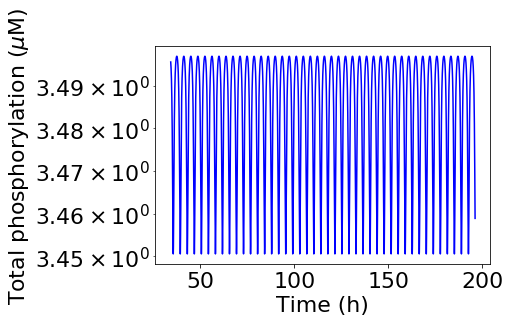

period = 13489.104178488604
nIP = 104
$k_{d\kappa}$ $(\mu$M$)$ = 0.01373469387755102


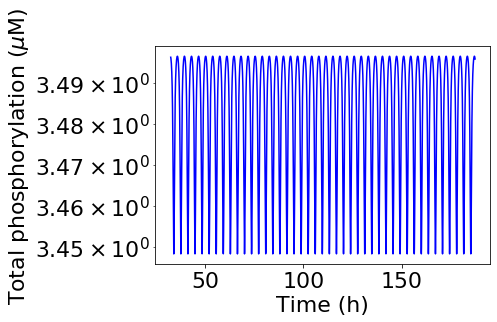

period = 12935.782818951411
nIP = 104
$k_{d\kappa}$ $(\mu$M$)$ = 0.014530612244897958


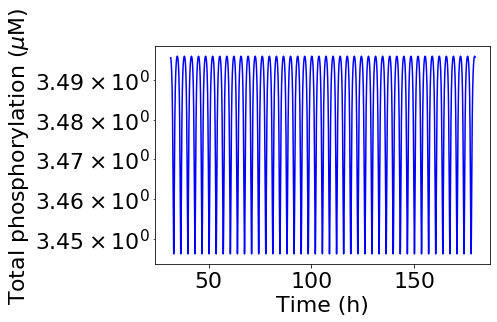

period = 12506.317020681803
nIP = 104
$k_{d\kappa}$ $(\mu$M$)$ = 0.015326530612244899


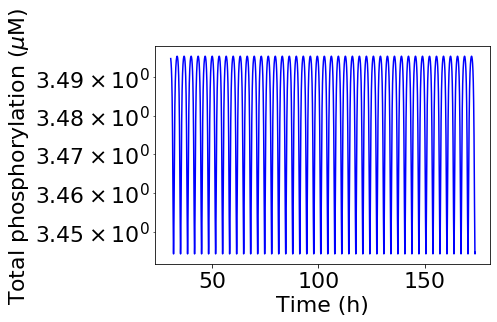

period = 11852.530418528593
nIP = 105
$k_{d\kappa}$ $(\mu$M$)$ = 0.016122448979591836


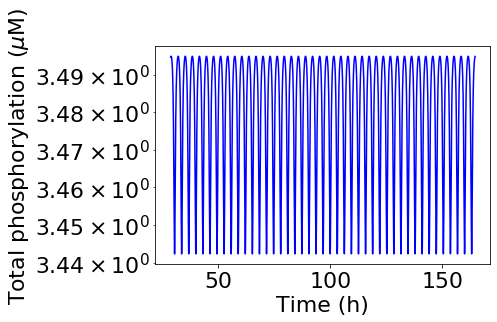

period = 11354.492189181852
nIP = 104
$k_{d\kappa}$ $(\mu$M$)$ = 0.016918367346938776


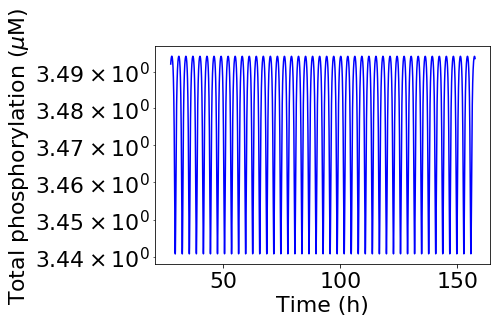

period = 10848.57228118903
nIP = 104
$k_{d\kappa}$ $(\mu$M$)$ = 0.017714285714285714


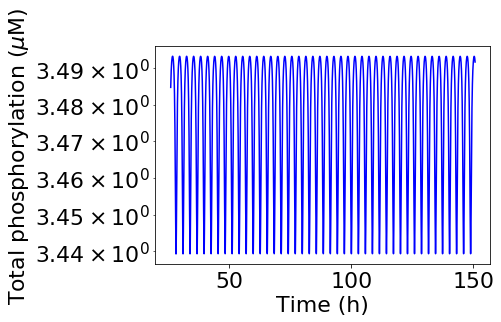

period = 10329.219468531548
nIP = 104
$k_{d\kappa}$ $(\mu$M$)$ = 0.018510204081632654


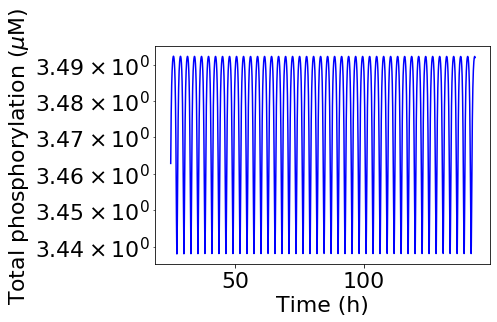

period = 9923.30469712877
nIP = 104
$k_{d\kappa}$ $(\mu$M$)$ = 0.01930612244897959


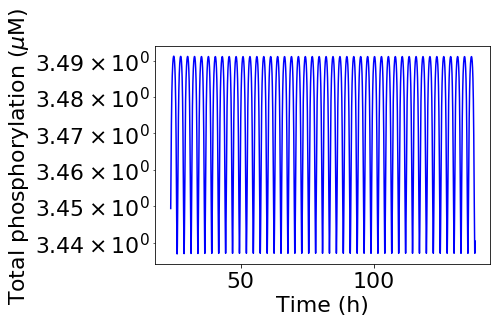

period = 9330.014214967436
nIP = 105
$k_{d\kappa}$ $(\mu$M$)$ = 0.02010204081632653


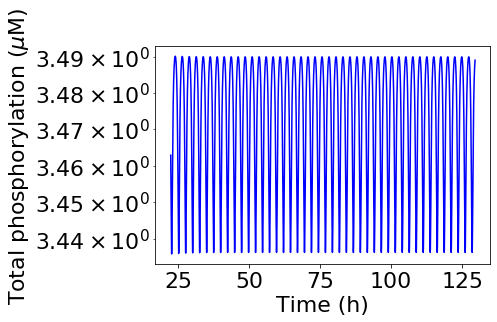

period = 8888.49117559701
nIP = 104
$k_{d\kappa}$ $(\mu$M$)$ = 0.02089795918367347


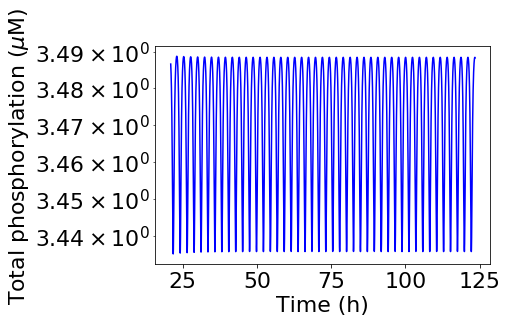

period = 8336.903146950819
nIP = 104
$k_{d\kappa}$ $(\mu$M$)$ = 0.021693877551020407


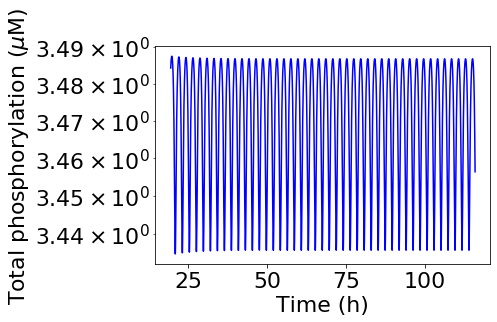

period = 7958.051852573
nIP = 102
$k_{d\kappa}$ $(\mu$M$)$ = 0.022489795918367347


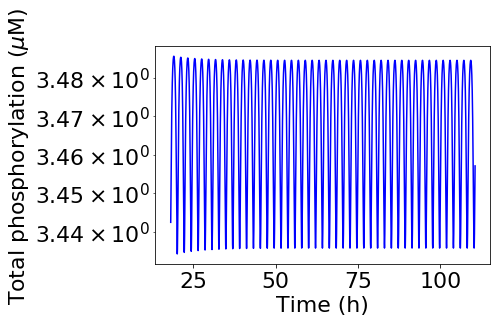

period = 7528.171204152575
nIP = 103
$k_{d\kappa}$ $(\mu$M$)$ = 0.023285714285714285


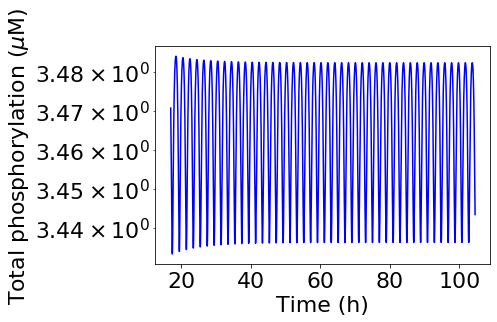

period = 7115.967166244576
nIP = 102
$k_{d\kappa}$ $(\mu$M$)$ = 0.024081632653061225


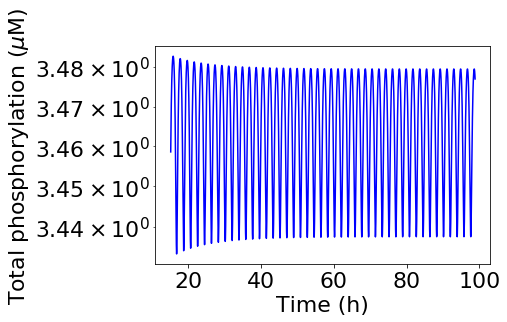

period = 6737.539495914592
nIP = 102
$k_{d\kappa}$ $(\mu$M$)$ = 0.024877551020408162


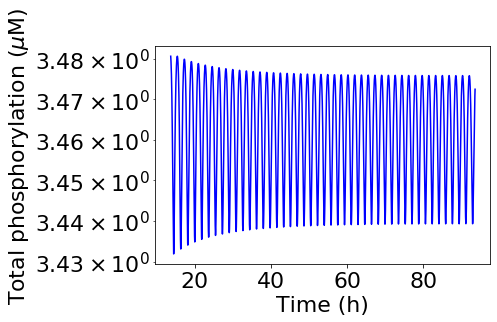

period = 6387.905365227372
nIP = 101
$k_{d\kappa}$ $(\mu$M$)$ = 0.025673469387755103


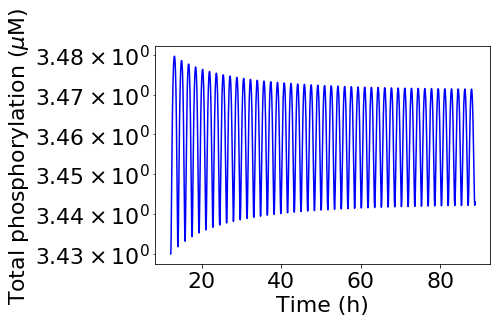

period = 0
nIP = 101
$k_{d\kappa}$ $(\mu$M$)$ = 0.02646938775510204


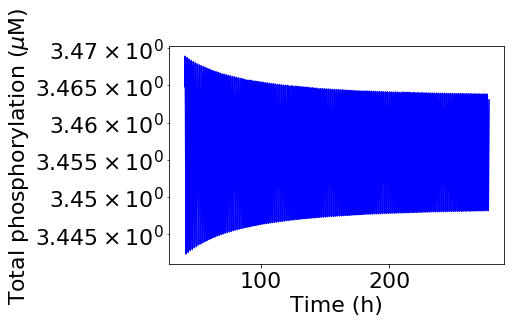

period = 0
nIP = 343
$k_{d\kappa}$ $(\mu$M$)$ = 0.027265306122448978


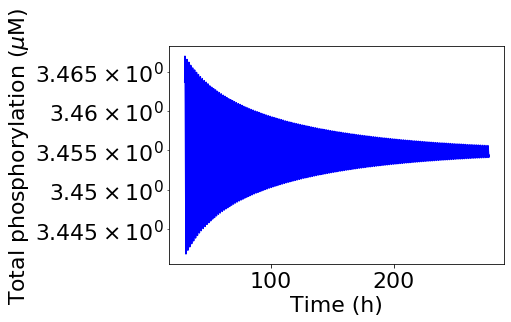

period = 0
nIP = 357
$k_{d\kappa}$ $(\mu$M$)$ = 0.02806122448979592


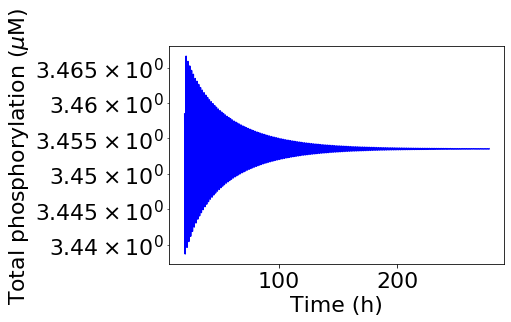

period = 0
nIP = 367
$k_{d\kappa}$ $(\mu$M$)$ = 0.028857142857142856


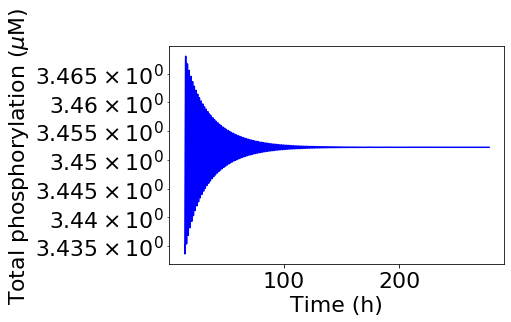

period = 0
nIP = 370
$k_{d\kappa}$ $(\mu$M$)$ = 0.029653061224489796


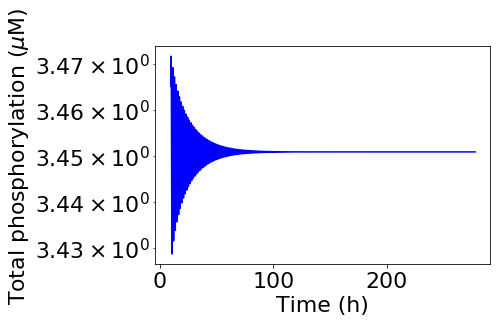

period = 0
nIP = 273
$k_{d\kappa}$ $(\mu$M$)$ = 0.030448979591836733


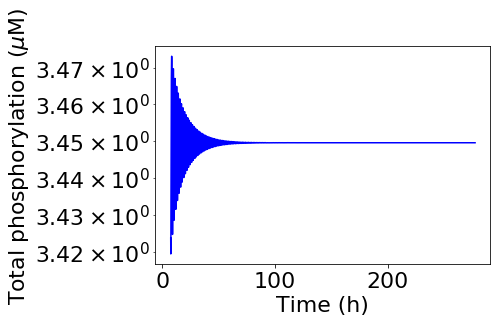

period = 0
nIP = 222
$k_{d\kappa}$ $(\mu$M$)$ = 0.031244897959183674


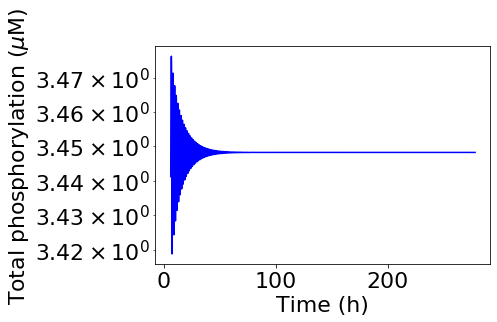

period = 0
nIP = 191
$k_{d\kappa}$ $(\mu$M$)$ = 0.03204081632653061


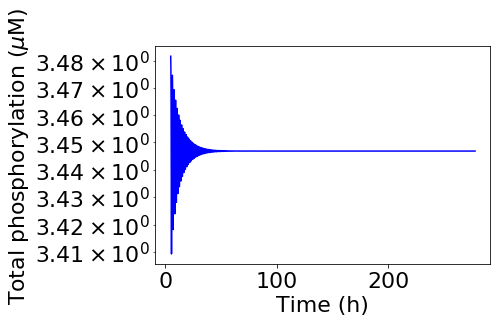

period = 0
nIP = 162
$k_{d\kappa}$ $(\mu$M$)$ = 0.03283673469387755


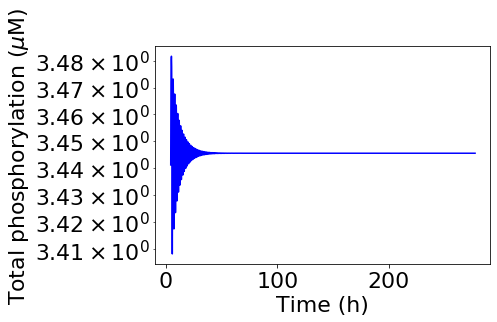

period = 0
nIP = 146
$k_{d\kappa}$ $(\mu$M$)$ = 0.03363265306122449


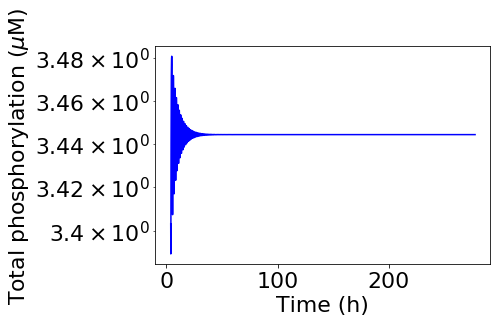

period = 0
nIP = 133
$k_{d\kappa}$ $(\mu$M$)$ = 0.034428571428571426


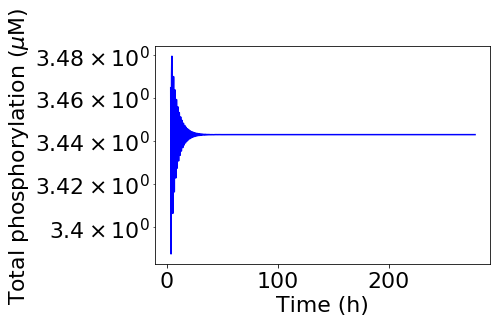

period = 0
nIP = 119
$k_{d\kappa}$ $(\mu$M$)$ = 0.035224489795918364


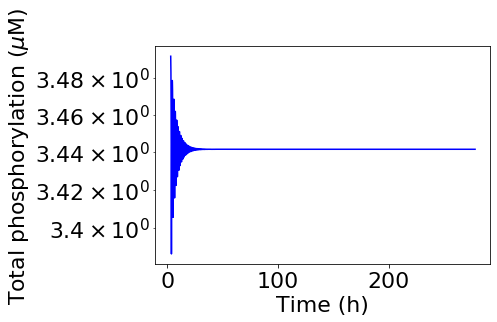

period = 0
nIP = 109
$k_{d\kappa}$ $(\mu$M$)$ = 0.03602040816326531


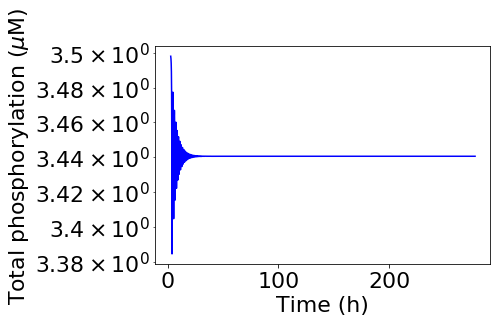

period = 0
nIP = 100
$k_{d\kappa}$ $(\mu$M$)$ = 0.036816326530612245


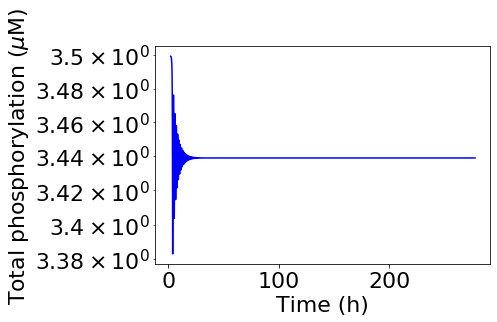

period = 0
nIP = 92
$k_{d\kappa}$ $(\mu$M$)$ = 0.03761224489795918


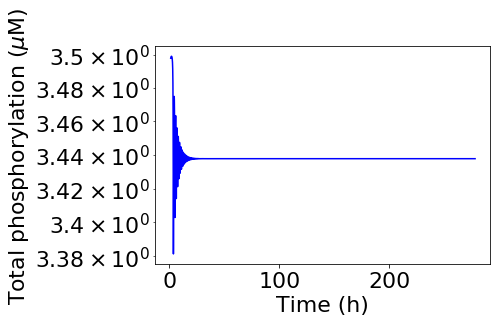

period = 0
nIP = 87
$k_{d\kappa}$ $(\mu$M$)$ = 0.03840816326530612


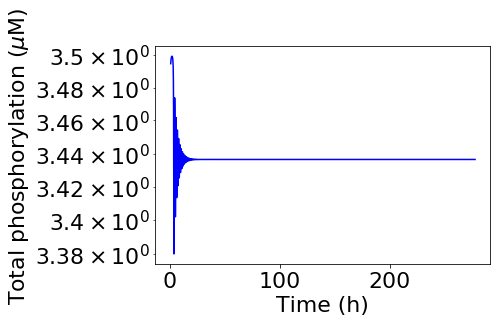

period = 0
nIP = 83
$k_{d\kappa}$ $(\mu$M$)$ = 0.03920408163265306


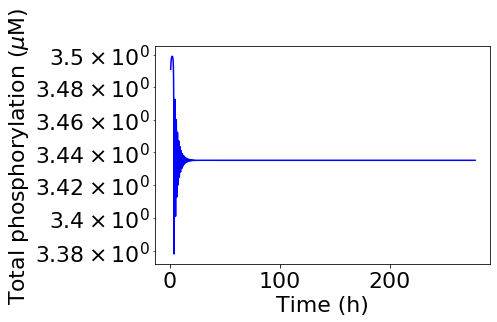

period = 0
nIP = 78
$k_{d\kappa}$ $(\mu$M$)$ = 0.04


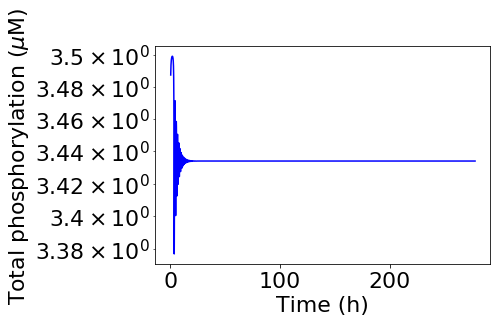

period = 0
nIP = 74


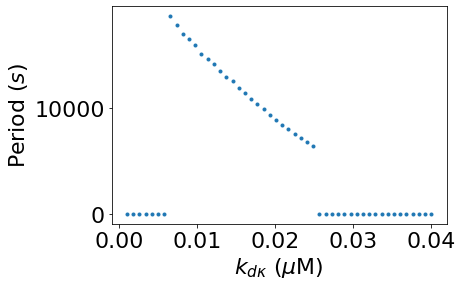

In [15]:
logscale = False
if logscale:
    kdks = np.logspace(-3, -1, num_points, base=10)
else:
    kdks = np.linspace(1e-3, 0.04, num_points)
period_fxn_kdk = robustness(0, kdks, logscale)

$k_{d\rho}$ $(\mu$M$)$ = 0.001


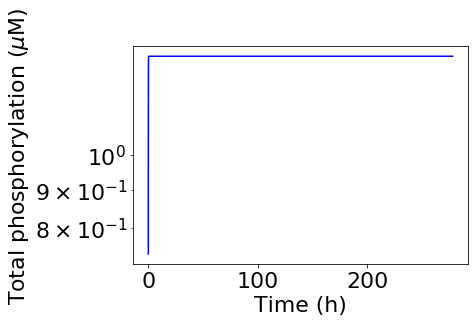

period = 0
nIP = 1
$k_{d\rho}$ $(\mu$M$)$ = 0.005061224489795919


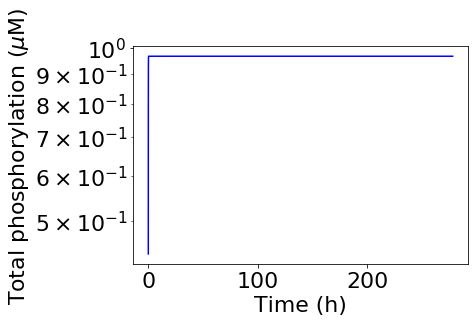

period = 0
nIP = 3
$k_{d\rho}$ $(\mu$M$)$ = 0.009122448979591836


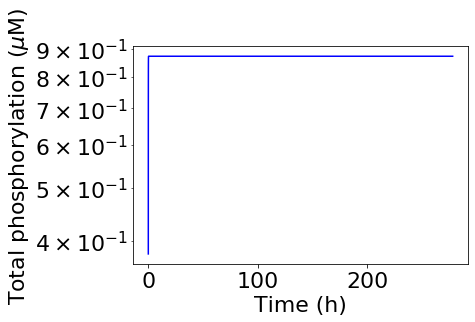

period = 0
nIP = 3
$k_{d\rho}$ $(\mu$M$)$ = 0.013183673469387758


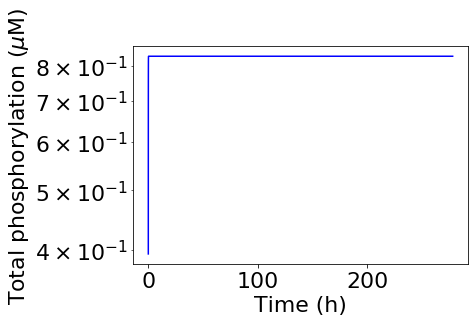

period = 0
nIP = 4
$k_{d\rho}$ $(\mu$M$)$ = 0.017244897959183676


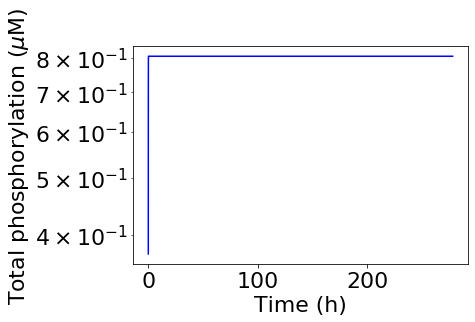

period = 0
nIP = 5
$k_{d\rho}$ $(\mu$M$)$ = 0.021306122448979593


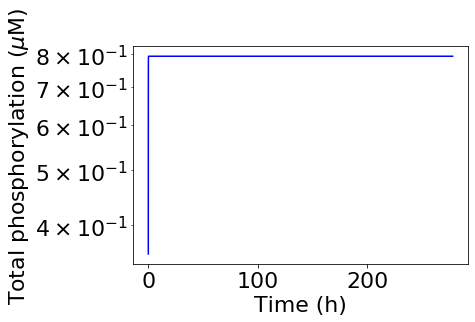

period = 0
nIP = 5
$k_{d\rho}$ $(\mu$M$)$ = 0.025367346938775515


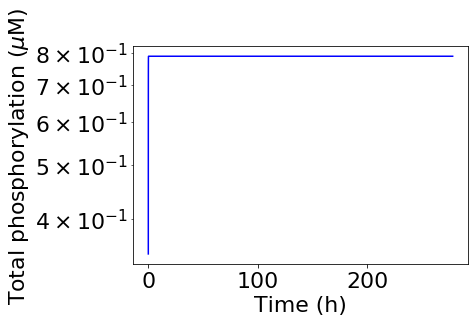

period = 0
nIP = 3
$k_{d\rho}$ $(\mu$M$)$ = 0.029428571428571432


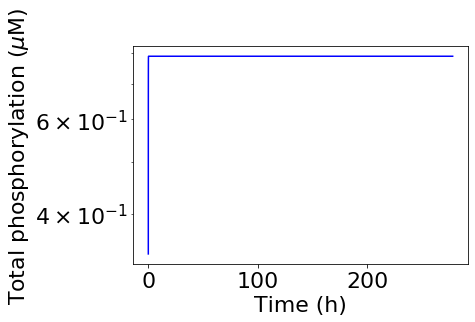

period = 0
nIP = 3
$k_{d\rho}$ $(\mu$M$)$ = 0.03348979591836735


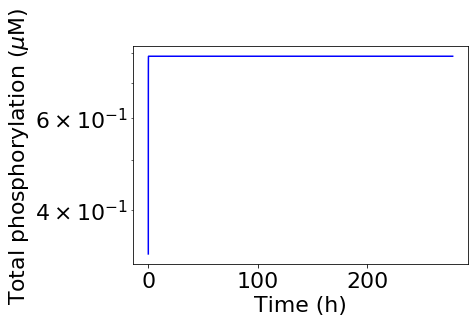

period = 0
nIP = 3
$k_{d\rho}$ $(\mu$M$)$ = 0.03755102040816327


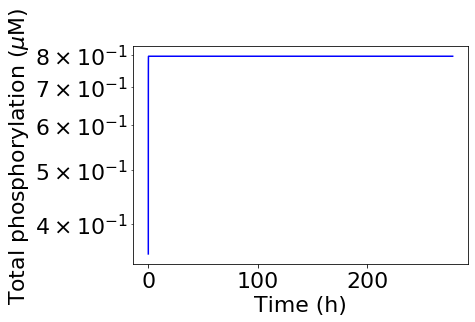

period = 0
nIP = 3
$k_{d\rho}$ $(\mu$M$)$ = 0.041612244897959186


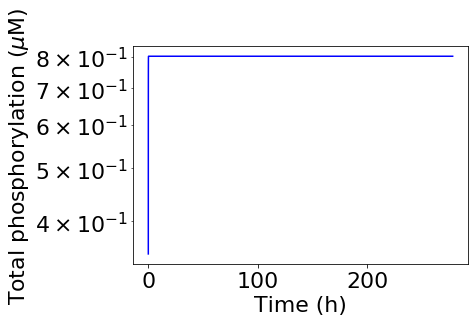

period = 0
nIP = 4
$k_{d\rho}$ $(\mu$M$)$ = 0.04567346938775511


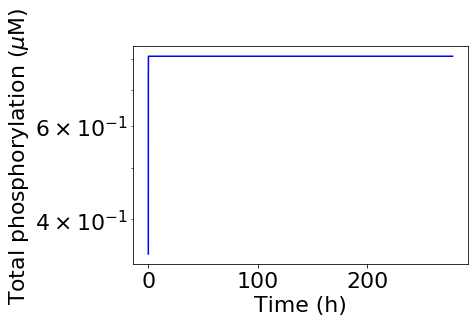

period = 0
nIP = 4
$k_{d\rho}$ $(\mu$M$)$ = 0.04973469387755103


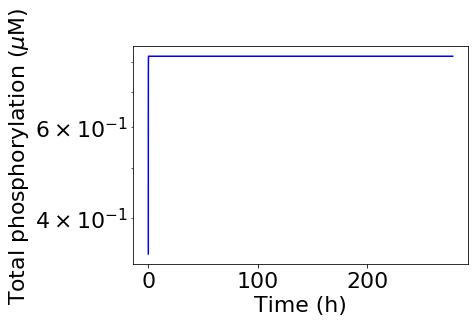

period = 0
nIP = 3
$k_{d\rho}$ $(\mu$M$)$ = 0.05379591836734694


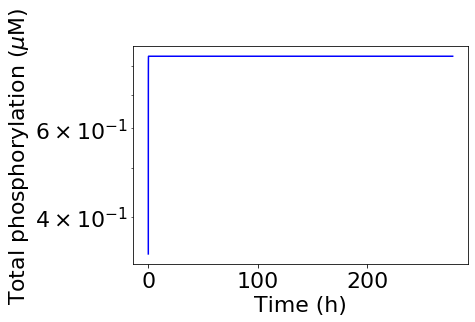

period = 0
nIP = 2
$k_{d\rho}$ $(\mu$M$)$ = 0.057857142857142864


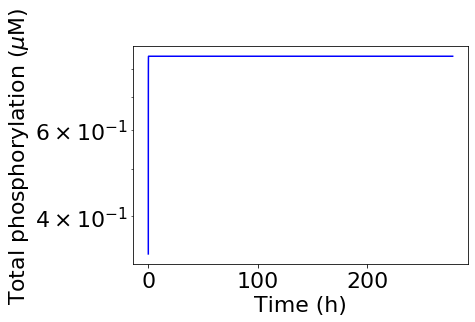

period = 0
nIP = 3
$k_{d\rho}$ $(\mu$M$)$ = 0.06191836734693878


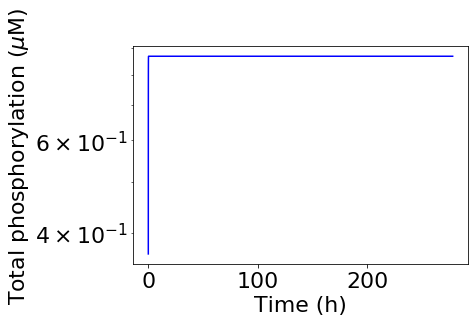

period = 0
nIP = 3
$k_{d\rho}$ $(\mu$M$)$ = 0.0659795918367347


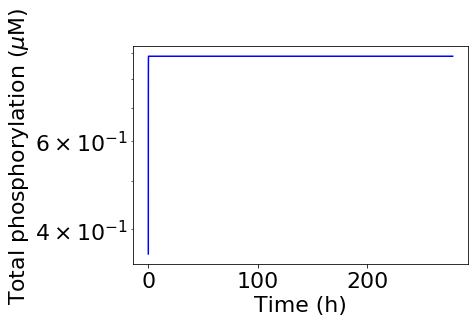

period = 0
nIP = 4
$k_{d\rho}$ $(\mu$M$)$ = 0.07004081632653061


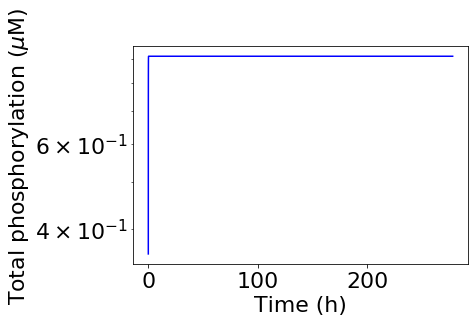

period = 0
nIP = 4
$k_{d\rho}$ $(\mu$M$)$ = 0.07410204081632654


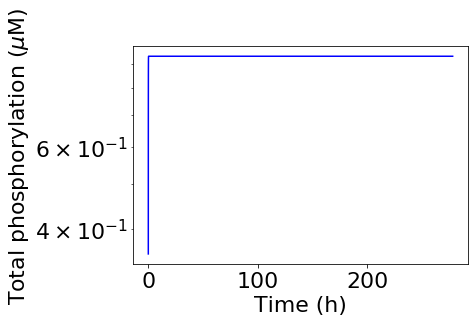

period = 0
nIP = 4
$k_{d\rho}$ $(\mu$M$)$ = 0.07816326530612246


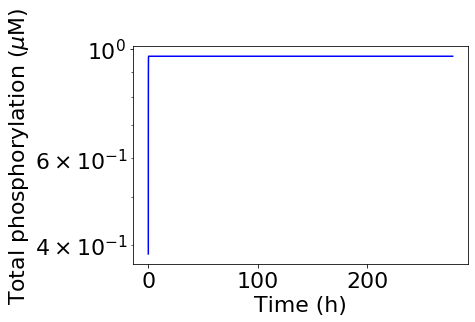

period = 0
nIP = 3
$k_{d\rho}$ $(\mu$M$)$ = 0.08222448979591837


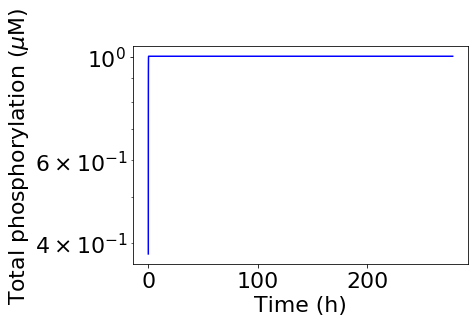

period = 0
nIP = 5
$k_{d\rho}$ $(\mu$M$)$ = 0.0862857142857143


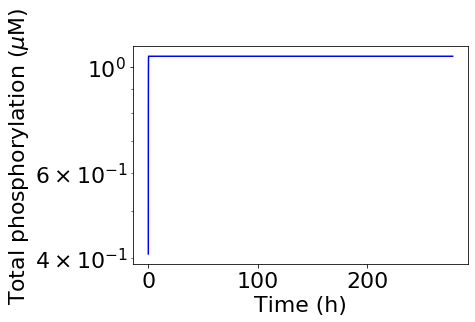

period = 0
nIP = 3
$k_{d\rho}$ $(\mu$M$)$ = 0.09034693877551021


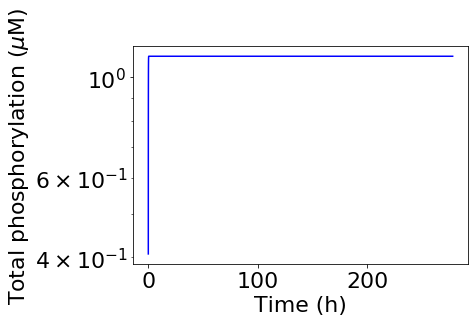

period = 0
nIP = 5
$k_{d\rho}$ $(\mu$M$)$ = 0.09440816326530613


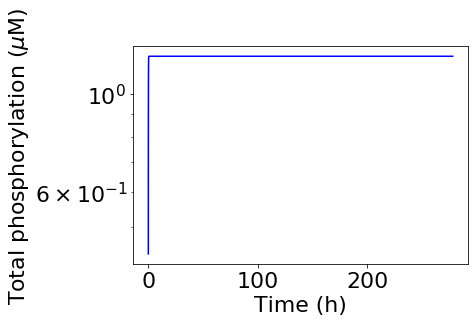

period = 0
nIP = 3
$k_{d\rho}$ $(\mu$M$)$ = 0.09846938775510206


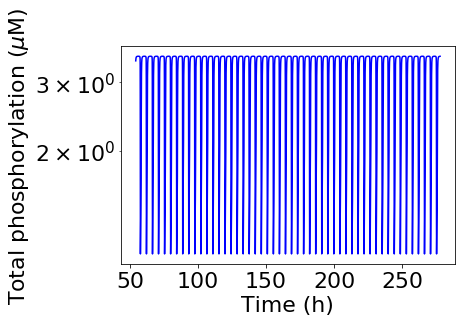

period = 15971.449312042445
nIP = 126
$k_{d\rho}$ $(\mu$M$)$ = 0.10253061224489797


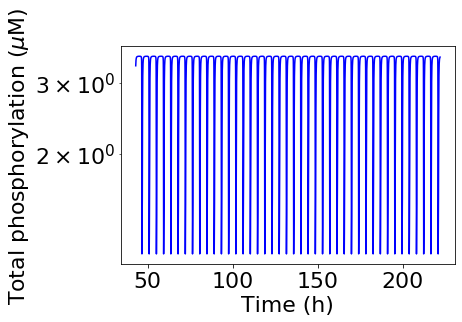

period = 15276.392048369162
nIP = 106
$k_{d\rho}$ $(\mu$M$)$ = 0.10659183673469388


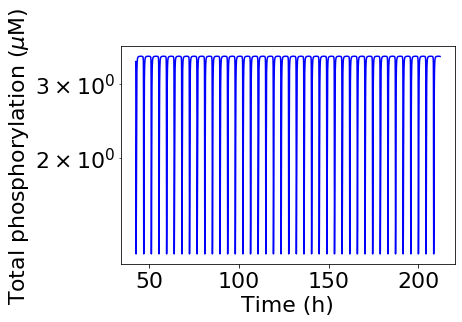

period = 15327.611430788646
nIP = 100
$k_{d\rho}$ $(\mu$M$)$ = 0.1106530612244898


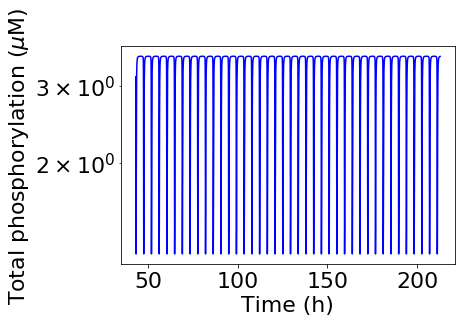

period = 15519.841228209203
nIP = 100
$k_{d\rho}$ $(\mu$M$)$ = 0.11471428571428573


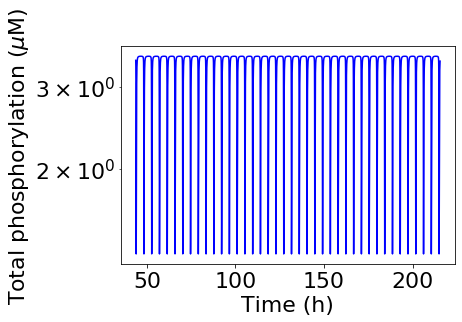

period = 15782.891104637645
nIP = 100
$k_{d\rho}$ $(\mu$M$)$ = 0.11877551020408164


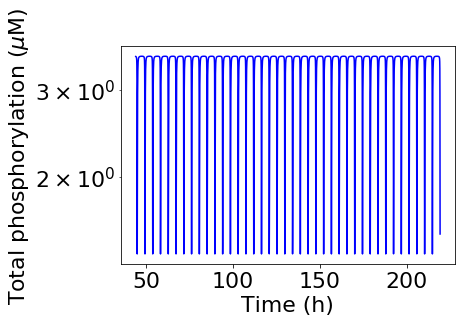

period = 16104.391723478795
nIP = 99
$k_{d\rho}$ $(\mu$M$)$ = 0.12283673469387756


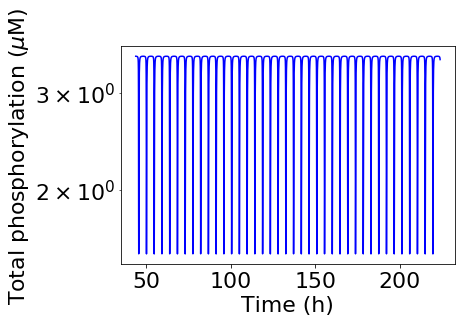

period = 16463.200325831305
nIP = 98
$k_{d\rho}$ $(\mu$M$)$ = 0.12689795918367347


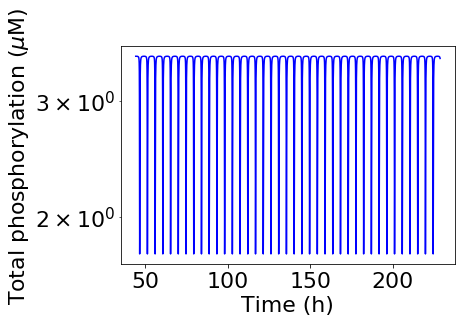

period = 16826.121858246275
nIP = 98
$k_{d\rho}$ $(\mu$M$)$ = 0.1309591836734694


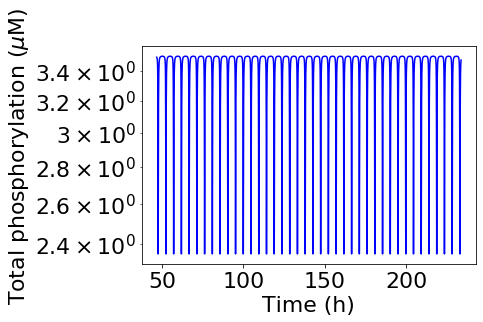

period = 17104.663956246455
nIP = 100
$k_{d\rho}$ $(\mu$M$)$ = 0.13502040816326533


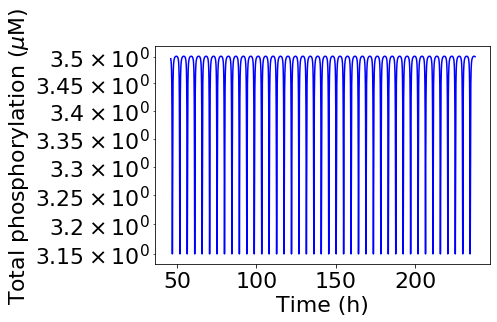

period = 16861.88270922273
nIP = 102
$k_{d\rho}$ $(\mu$M$)$ = 0.13908163265306123


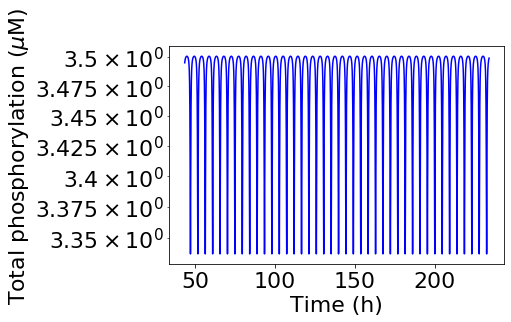

period = 16741.39907198993
nIP = 102
$k_{d\rho}$ $(\mu$M$)$ = 0.14314285714285716


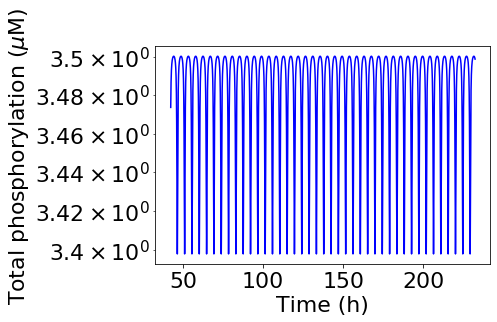

period = 16476.818079577177
nIP = 102
$k_{d\rho}$ $(\mu$M$)$ = 0.14720408163265308


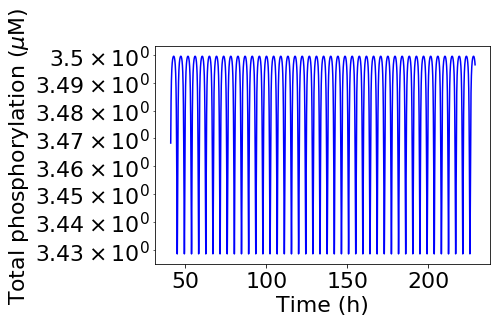

period = 15772.205996767036
nIP = 104
$k_{d\rho}$ $(\mu$M$)$ = 0.15126530612244898


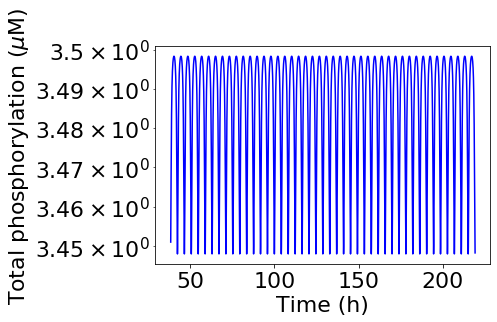

period = 14751.853617228335
nIP = 107
$k_{d\rho}$ $(\mu$M$)$ = 0.1553265306122449


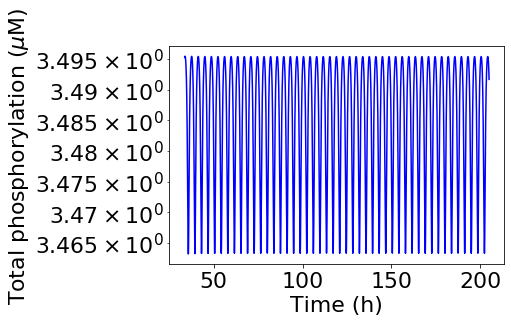

period = 13408.104802168324
nIP = 110
$k_{d\rho}$ $(\mu$M$)$ = 0.15938775510204084


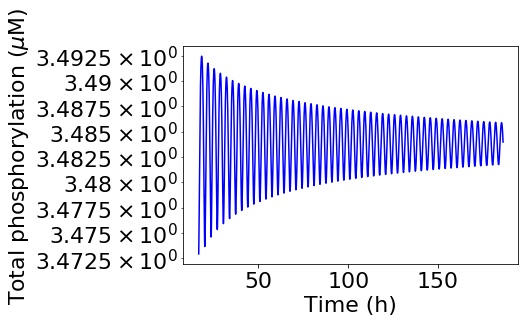

period = 0
nIP = 110
$k_{d\rho}$ $(\mu$M$)$ = 0.16344897959183674


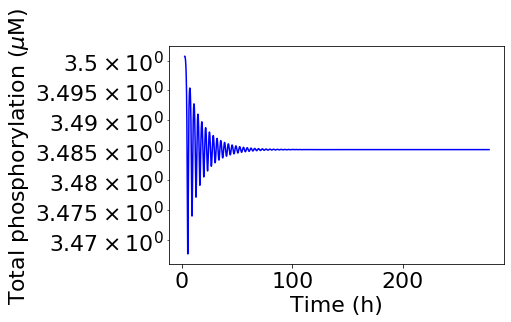

period = 0
nIP = 114
$k_{d\rho}$ $(\mu$M$)$ = 0.16751020408163267


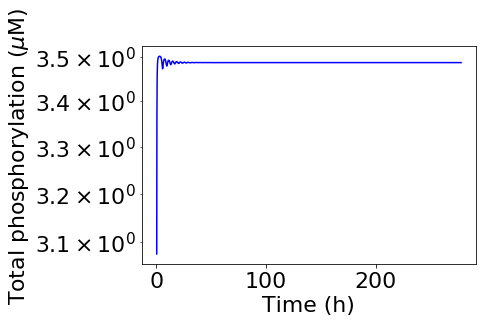

period = 0
nIP = 67
$k_{d\rho}$ $(\mu$M$)$ = 0.1715714285714286


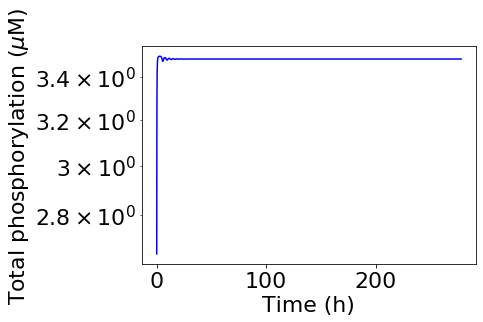

period = 0
nIP = 49
$k_{d\rho}$ $(\mu$M$)$ = 0.1756326530612245


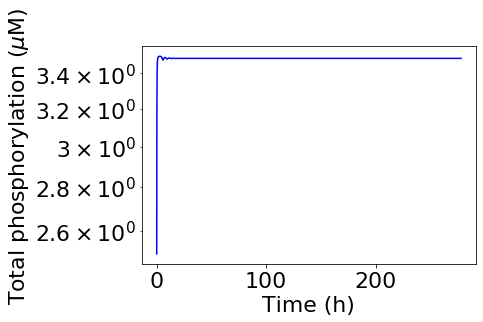

period = 0
nIP = 38
$k_{d\rho}$ $(\mu$M$)$ = 0.17969387755102043


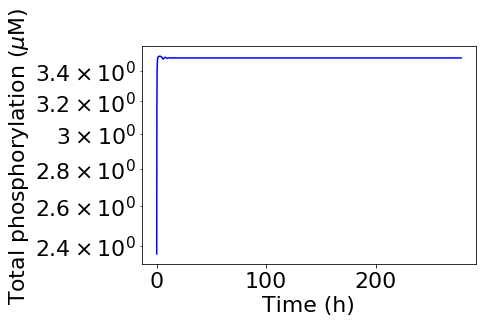

period = 0
nIP = 31
$k_{d\rho}$ $(\mu$M$)$ = 0.18375510204081635


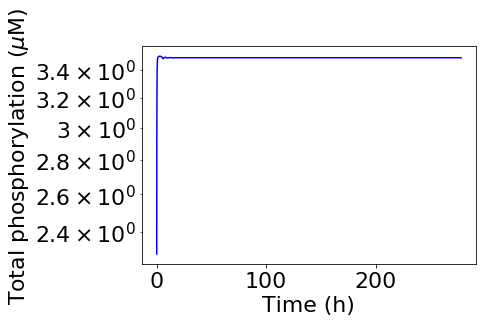

period = 0
nIP = 29
$k_{d\rho}$ $(\mu$M$)$ = 0.18781632653061225


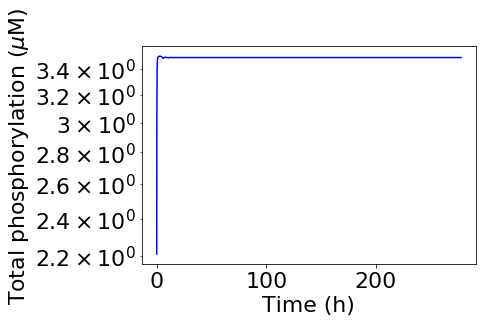

period = 0
nIP = 26
$k_{d\rho}$ $(\mu$M$)$ = 0.19187755102040818


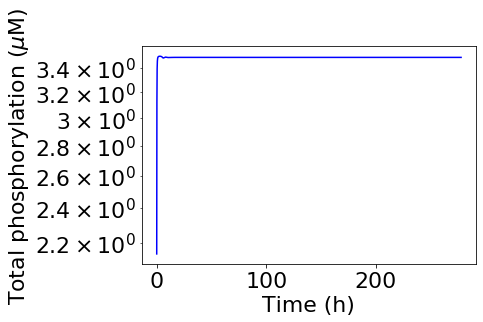

period = 0
nIP = 23
$k_{d\rho}$ $(\mu$M$)$ = 0.1959387755102041


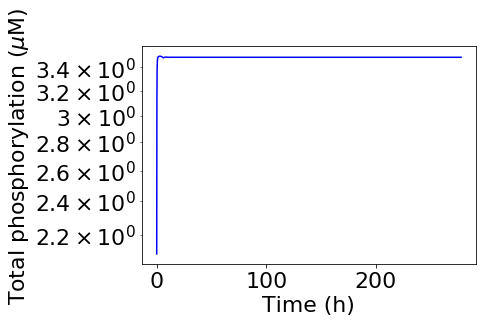

period = 0
nIP = 23
$k_{d\rho}$ $(\mu$M$)$ = 0.2


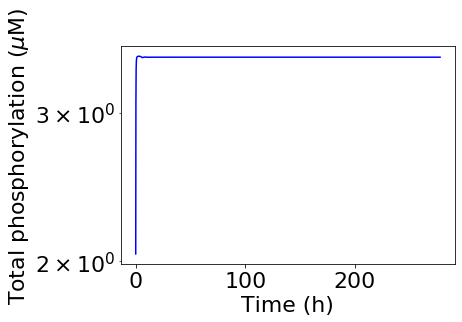

period = 0
nIP = 21


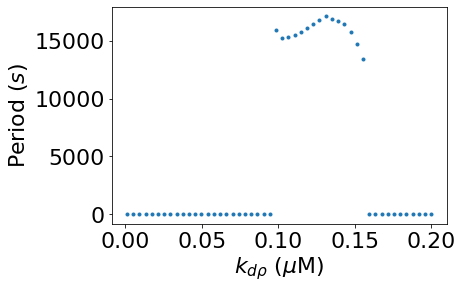

In [16]:
logscale = False
if logscale:
    kdps = np.logspace(-2, 0, num_points, base=10)
else:
    kdps = np.linspace(0.001, 0.2, num_points)
period_fxn_kdp = robustness(1, kdps, logscale)

$\kappa_{tot}$ $(\mu$M$)$ = 2.0


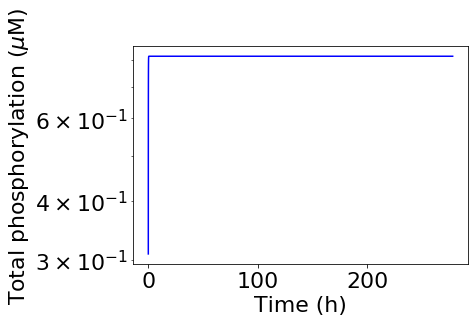

period = 0
nIP = 3
$\kappa_{tot}$ $(\mu$M$)$ = 2.0408163265306123


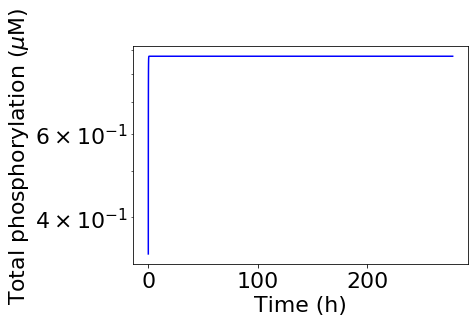

period = 0
nIP = 3
$\kappa_{tot}$ $(\mu$M$)$ = 2.0816326530612246


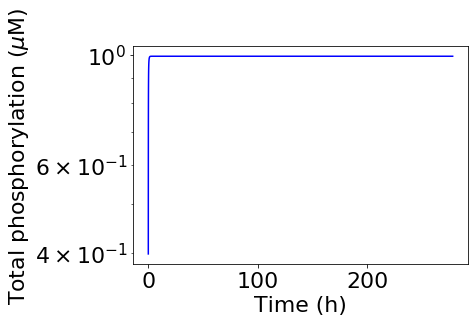

period = 0
nIP = 1
$\kappa_{tot}$ $(\mu$M$)$ = 2.122448979591837


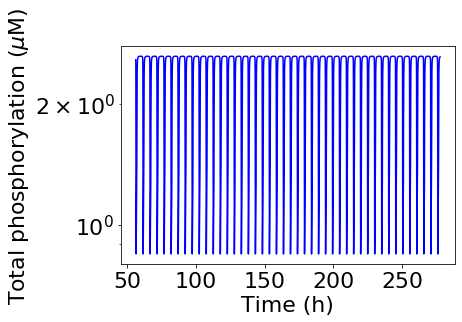

period = 18404.106000806554
nIP = 110
$\kappa_{tot}$ $(\mu$M$)$ = 2.163265306122449


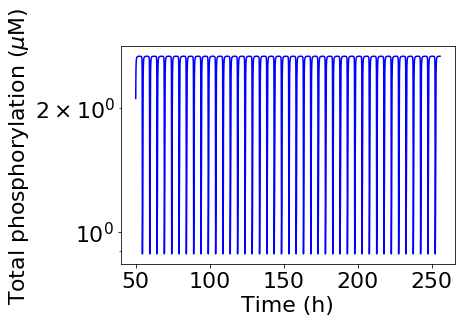

period = 17792.0318433122
nIP = 104
$\kappa_{tot}$ $(\mu$M$)$ = 2.204081632653061


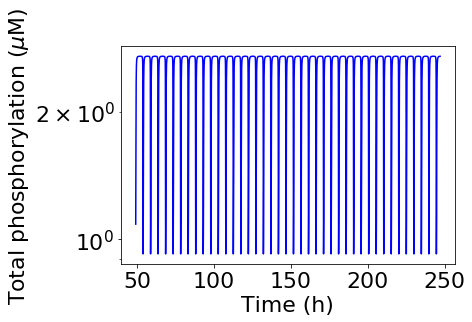

period = 17615.049426856916
nIP = 102
$\kappa_{tot}$ $(\mu$M$)$ = 2.2448979591836733


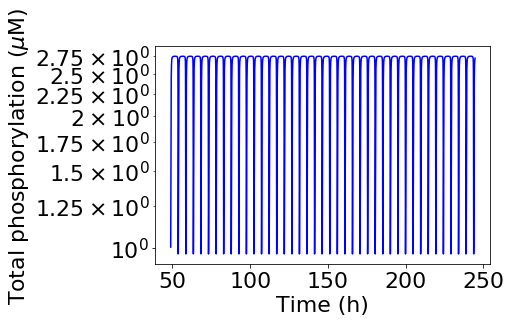

period = 17544.896297147265
nIP = 102
$\kappa_{tot}$ $(\mu$M$)$ = 2.2857142857142856


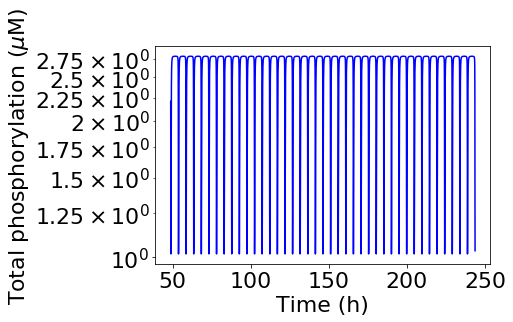

period = 17543.93746142683
nIP = 101
$\kappa_{tot}$ $(\mu$M$)$ = 2.326530612244898


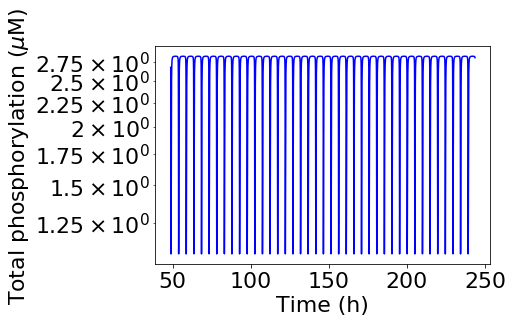

period = 17572.01979073696
nIP = 100
$\kappa_{tot}$ $(\mu$M$)$ = 2.36734693877551


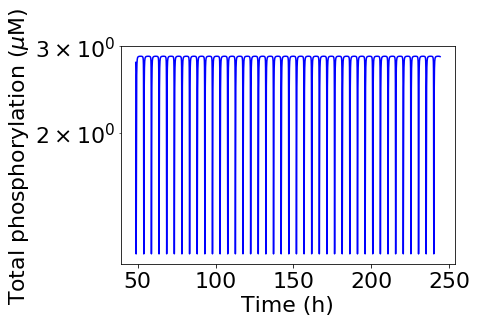

period = 17614.92618649802
nIP = 100
$\kappa_{tot}$ $(\mu$M$)$ = 2.4081632653061225


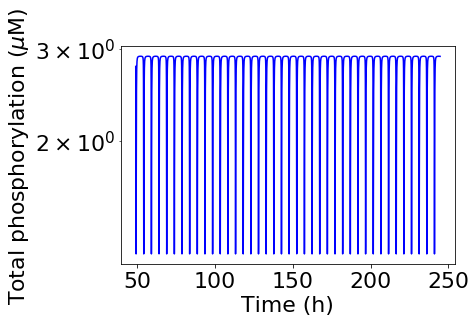

period = 17703.957142486586
nIP = 100
$\kappa_{tot}$ $(\mu$M$)$ = 2.4489795918367347


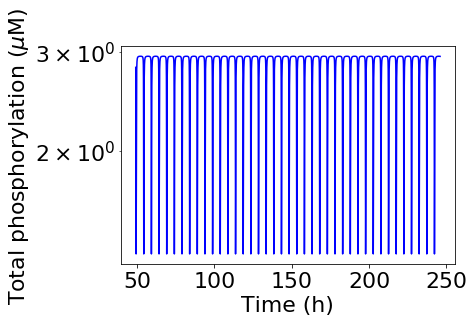

period = 17789.725680630887
nIP = 100
$\kappa_{tot}$ $(\mu$M$)$ = 2.489795918367347


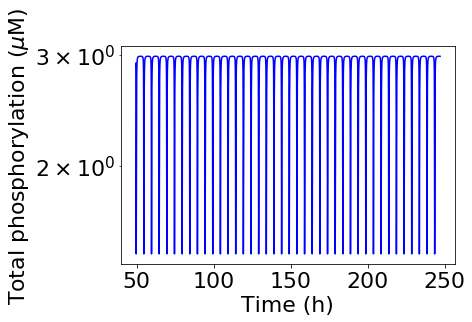

period = 17880.76674941904
nIP = 100
$\kappa_{tot}$ $(\mu$M$)$ = 2.5306122448979593


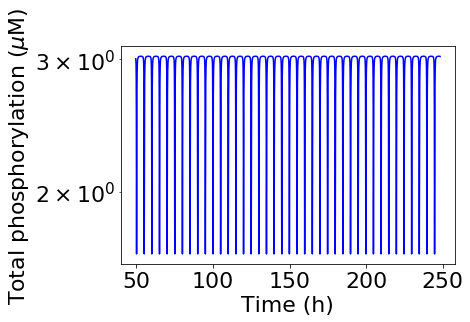

period = 17970.6130766134
nIP = 100
$\kappa_{tot}$ $(\mu$M$)$ = 2.571428571428571


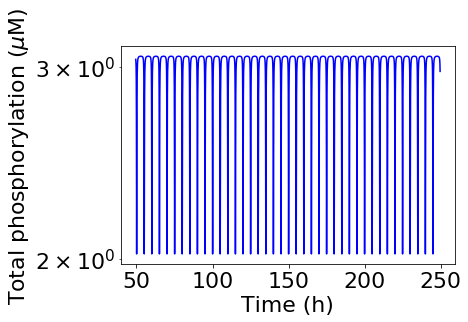

period = 17980.411287210998
nIP = 100
$\kappa_{tot}$ $(\mu$M$)$ = 2.6122448979591835


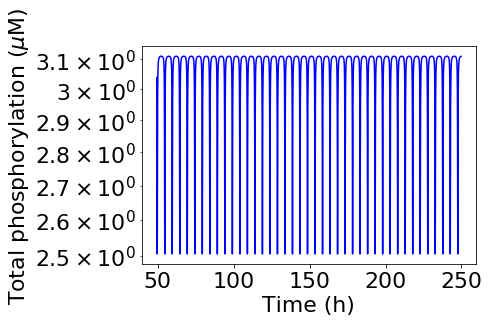

period = 17807.004281519097
nIP = 102
$\kappa_{tot}$ $(\mu$M$)$ = 2.6530612244897958


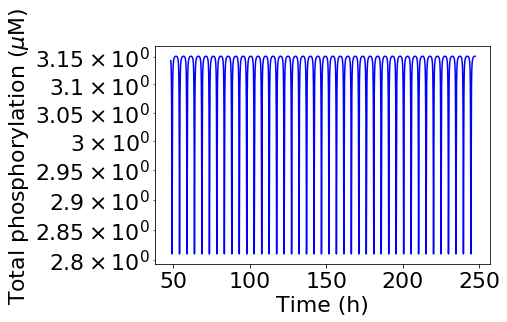

period = 17605.06839059177
nIP = 102
$\kappa_{tot}$ $(\mu$M$)$ = 2.693877551020408


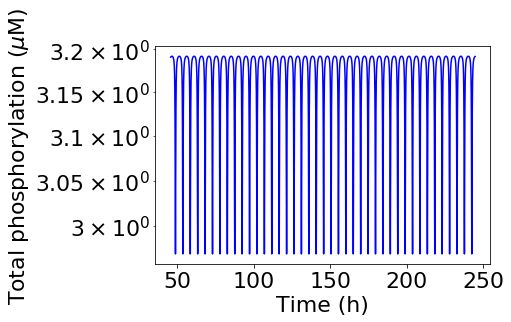

period = 17425.711794653558
nIP = 102
$\kappa_{tot}$ $(\mu$M$)$ = 2.7346938775510203


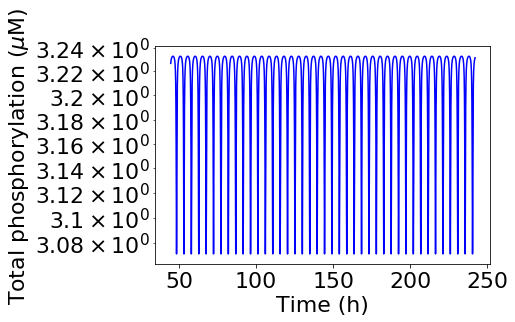

period = 17276.67154021433
nIP = 102
$\kappa_{tot}$ $(\mu$M$)$ = 2.7755102040816326


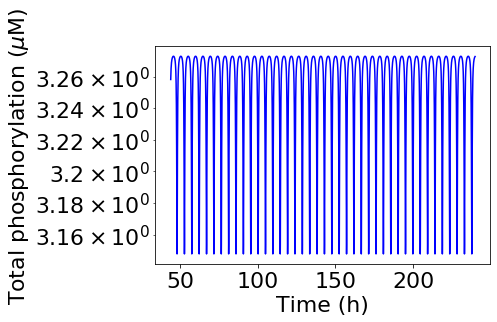

period = 17090.904294273583
nIP = 102
$\kappa_{tot}$ $(\mu$M$)$ = 2.816326530612245


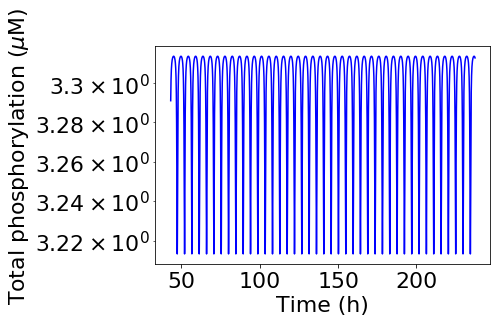

period = 16783.93969091936
nIP = 102
$\kappa_{tot}$ $(\mu$M$)$ = 2.857142857142857


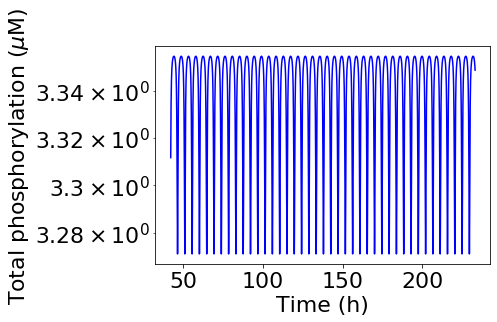

period = 16474.91269613756
nIP = 102
$\kappa_{tot}$ $(\mu$M$)$ = 2.8979591836734695


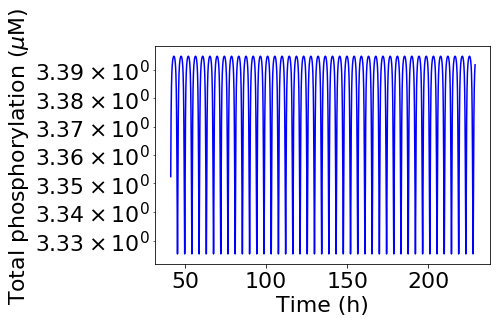

period = 16001.533074852661
nIP = 103
$\kappa_{tot}$ $(\mu$M$)$ = 2.9387755102040813


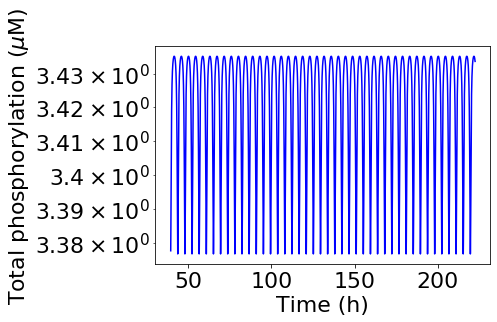

period = 15407.483193897759
nIP = 104
$\kappa_{tot}$ $(\mu$M$)$ = 2.979591836734694


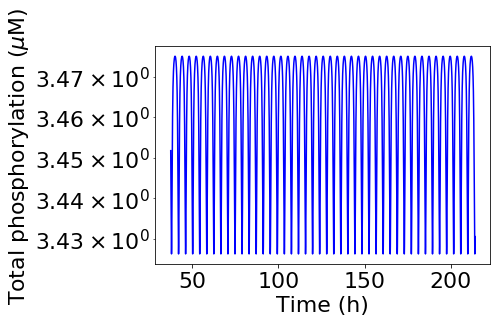

period = 14695.10041939083
nIP = 105
$\kappa_{tot}$ $(\mu$M$)$ = 3.020408163265306


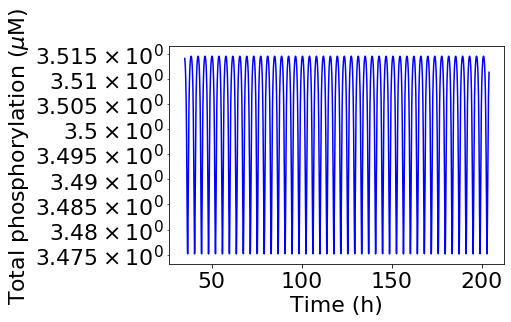

period = 13897.474783189478
nIP = 105
$\kappa_{tot}$ $(\mu$M$)$ = 3.061224489795918


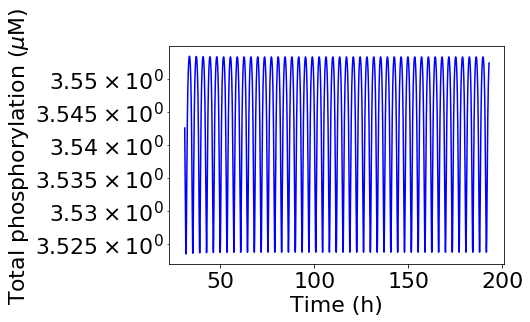

period = 13084.893218889716
nIP = 106
$\kappa_{tot}$ $(\mu$M$)$ = 3.1020408163265305


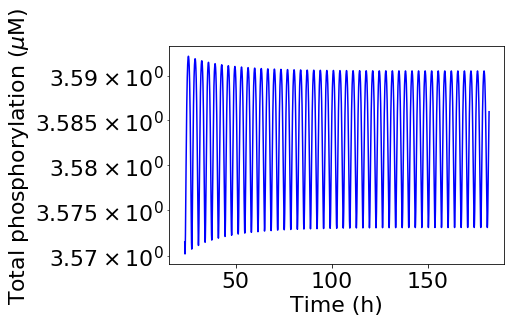

period = 12249.342724343529
nIP = 105
$\kappa_{tot}$ $(\mu$M$)$ = 3.142857142857143


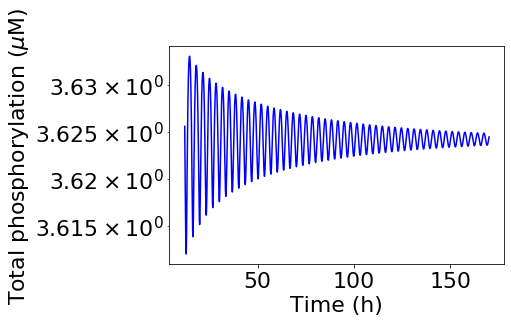

period = 0
nIP = 101
$\kappa_{tot}$ $(\mu$M$)$ = 3.183673469387755


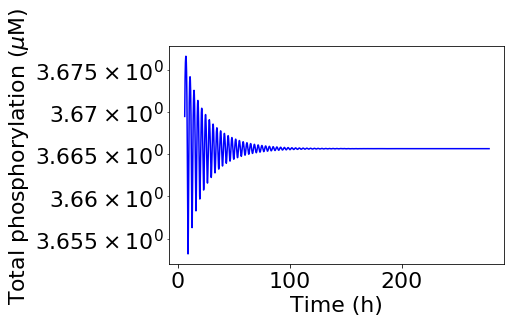

period = 0
nIP = 155
$\kappa_{tot}$ $(\mu$M$)$ = 3.224489795918367


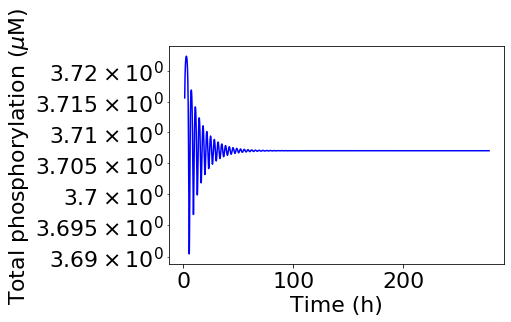

period = 0
nIP = 99
$\kappa_{tot}$ $(\mu$M$)$ = 3.2653061224489797


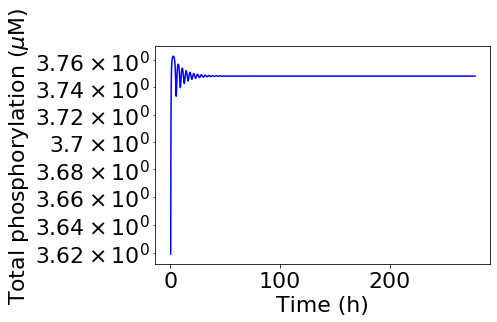

period = 0
nIP = 74
$\kappa_{tot}$ $(\mu$M$)$ = 3.3061224489795915


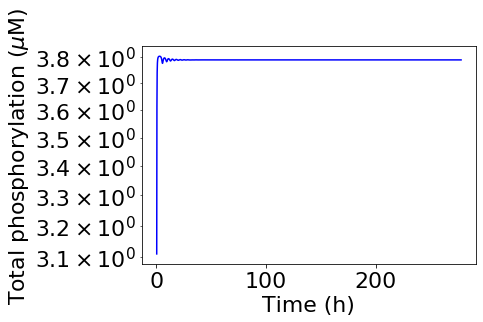

period = 0
nIP = 60
$\kappa_{tot}$ $(\mu$M$)$ = 3.3469387755102042


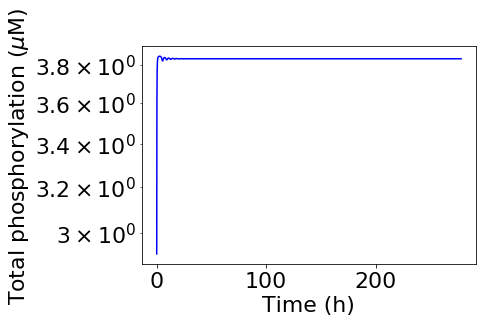

period = 0
nIP = 52
$\kappa_{tot}$ $(\mu$M$)$ = 3.387755102040816


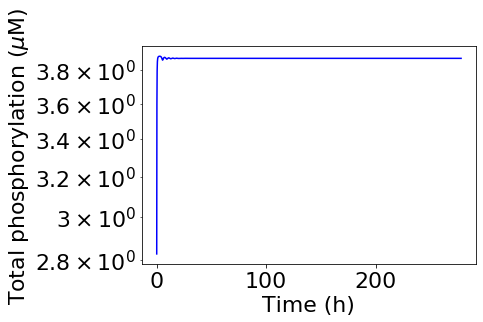

period = 0
nIP = 44
$\kappa_{tot}$ $(\mu$M$)$ = 3.4285714285714284


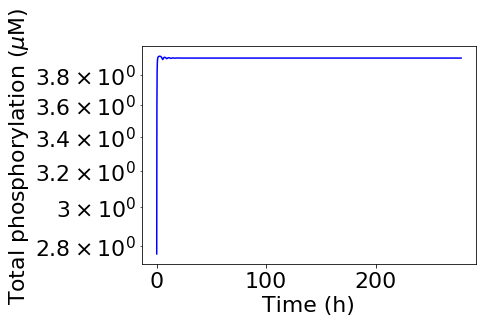

period = 0
nIP = 39
$\kappa_{tot}$ $(\mu$M$)$ = 3.4693877551020407


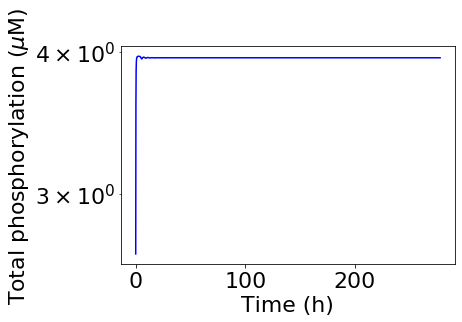

period = 0
nIP = 37
$\kappa_{tot}$ $(\mu$M$)$ = 3.510204081632653


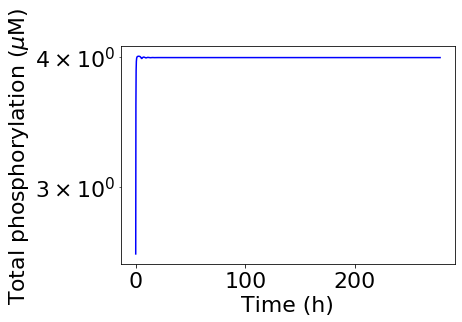

period = 0
nIP = 34
$\kappa_{tot}$ $(\mu$M$)$ = 3.5510204081632653


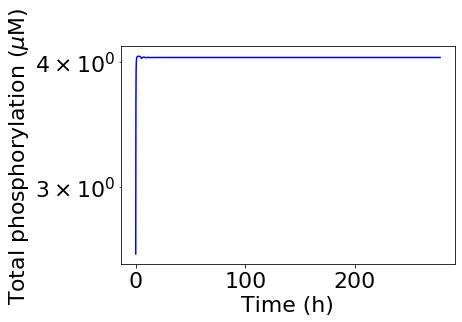

period = 0
nIP = 30
$\kappa_{tot}$ $(\mu$M$)$ = 3.591836734693877


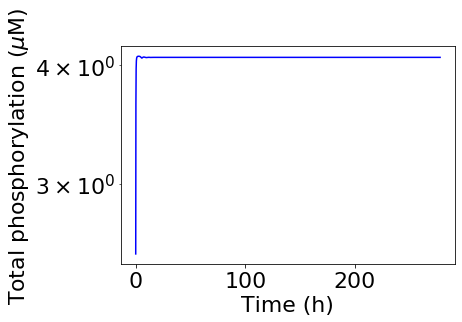

period = 0
nIP = 26
$\kappa_{tot}$ $(\mu$M$)$ = 3.63265306122449


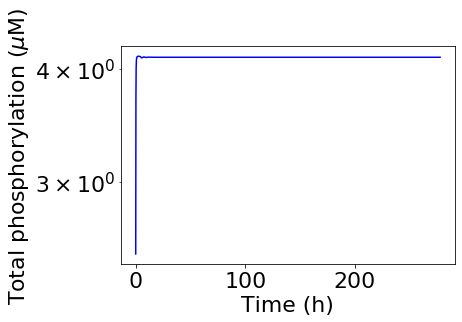

period = 0
nIP = 27
$\kappa_{tot}$ $(\mu$M$)$ = 3.6734693877551017


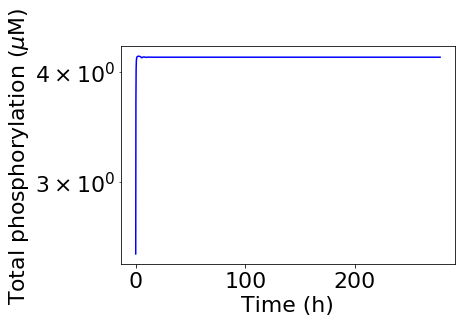

period = 0
nIP = 27
$\kappa_{tot}$ $(\mu$M$)$ = 3.7142857142857144


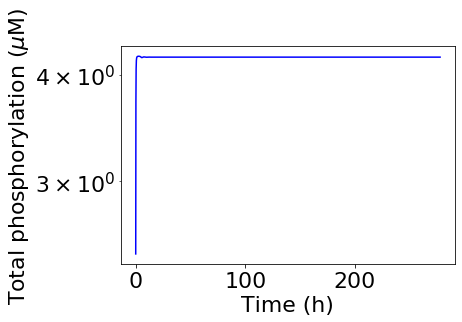

period = 0
nIP = 25
$\kappa_{tot}$ $(\mu$M$)$ = 3.7551020408163263


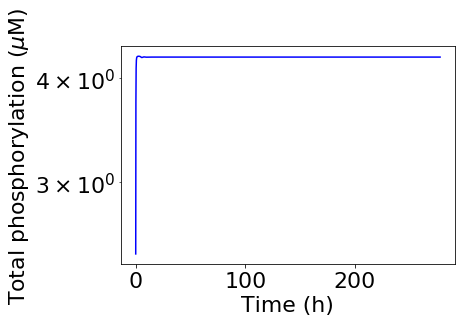

period = 0
nIP = 24
$\kappa_{tot}$ $(\mu$M$)$ = 3.7959183673469385


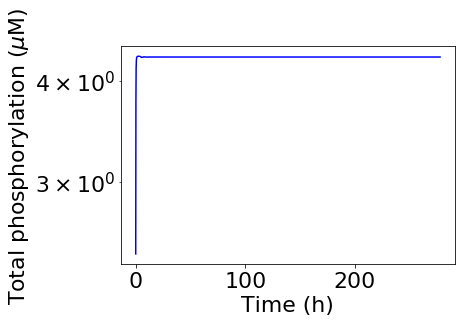

period = 0
nIP = 21
$\kappa_{tot}$ $(\mu$M$)$ = 3.836734693877551


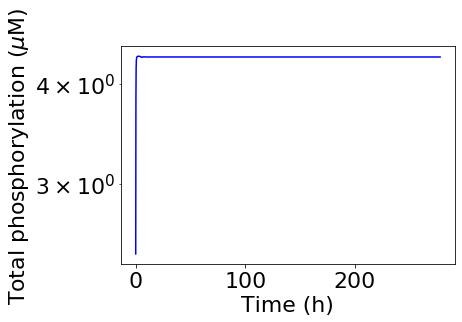

period = 0
nIP = 20
$\kappa_{tot}$ $(\mu$M$)$ = 3.877551020408163


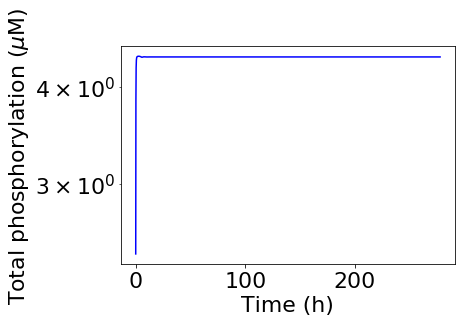

period = 0
nIP = 22
$\kappa_{tot}$ $(\mu$M$)$ = 3.9183673469387754


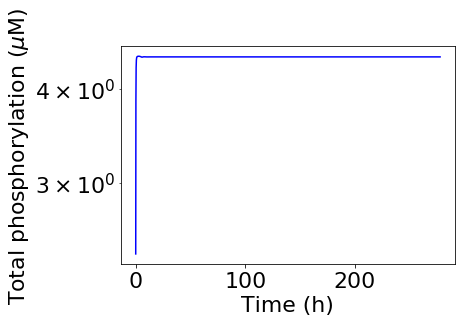

period = 0
nIP = 20
$\kappa_{tot}$ $(\mu$M$)$ = 3.9591836734693877


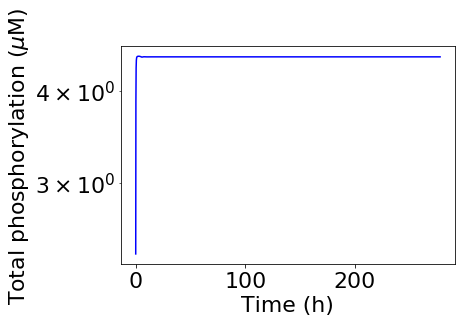

period = 0
nIP = 19
$\kappa_{tot}$ $(\mu$M$)$ = 4.0


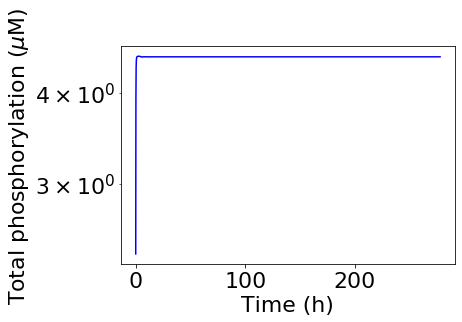

period = 0
nIP = 18


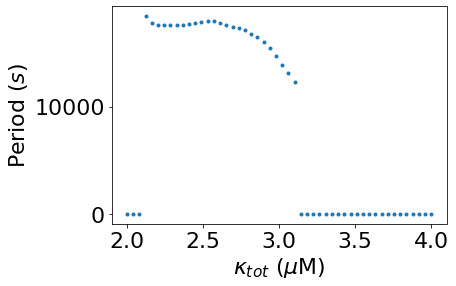

In [17]:
logscale = False
if logscale:
    ktots = np.logspace(-1, 1, num_points, base=10)
else:
    ktots = np.linspace(2, 4, num_points)
period_fxn_ktot = robustness(6, ktots, logscale)

$\rho_{tot}$ $(\mu$M$)$ = 0.4


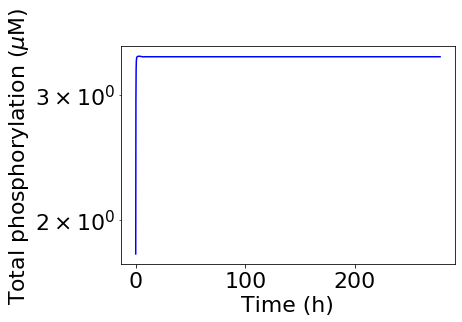

period = 0
nIP = 13
$\rho_{tot}$ $(\mu$M$)$ = 0.40408163265306124


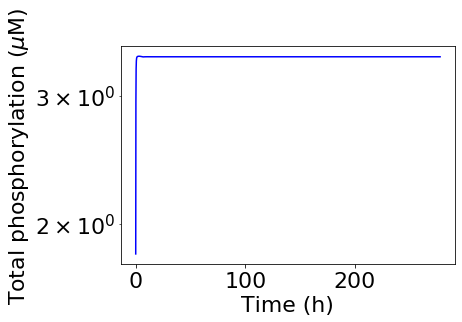

period = 0
nIP = 13
$\rho_{tot}$ $(\mu$M$)$ = 0.40816326530612246


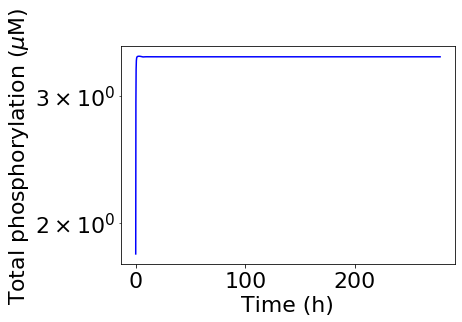

period = 0
nIP = 16
$\rho_{tot}$ $(\mu$M$)$ = 0.4122448979591837


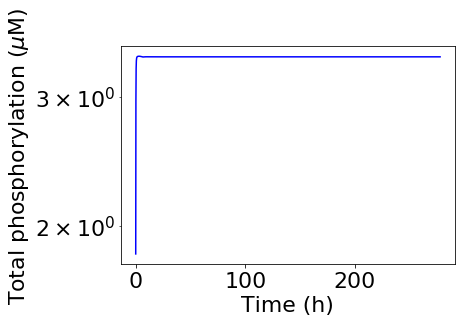

period = 0
nIP = 13
$\rho_{tot}$ $(\mu$M$)$ = 0.4163265306122449


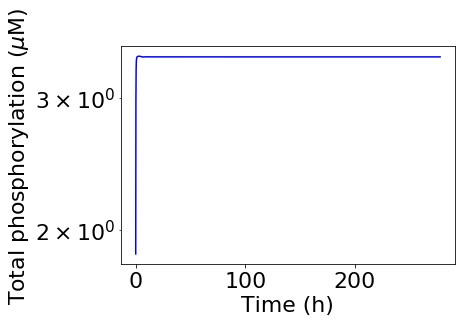

period = 0
nIP = 15
$\rho_{tot}$ $(\mu$M$)$ = 0.42040816326530617


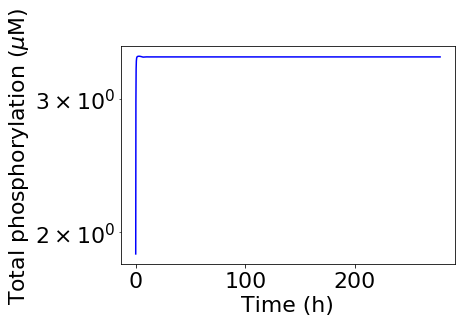

period = 0
nIP = 14
$\rho_{tot}$ $(\mu$M$)$ = 0.4244897959183674


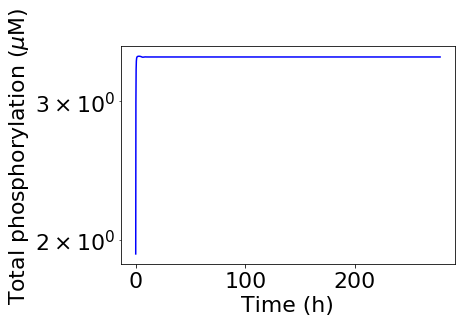

period = 0
nIP = 18
$\rho_{tot}$ $(\mu$M$)$ = 0.4285714285714286


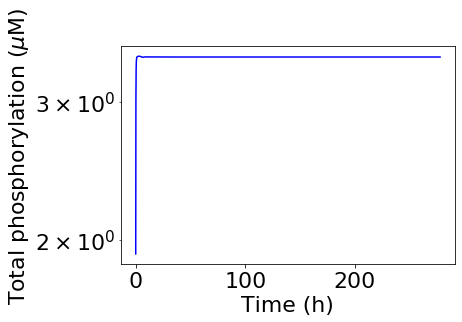

period = 0
nIP = 15
$\rho_{tot}$ $(\mu$M$)$ = 0.4326530612244898


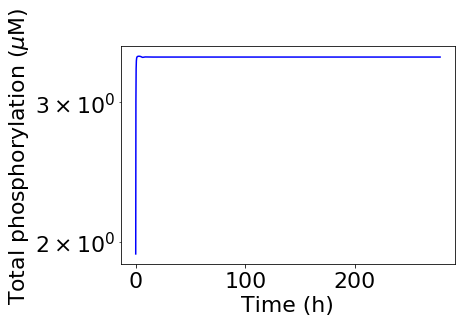

period = 0
nIP = 19
$\rho_{tot}$ $(\mu$M$)$ = 0.43673469387755104


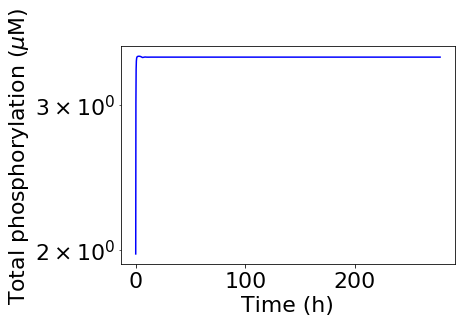

period = 0
nIP = 20
$\rho_{tot}$ $(\mu$M$)$ = 0.44081632653061226


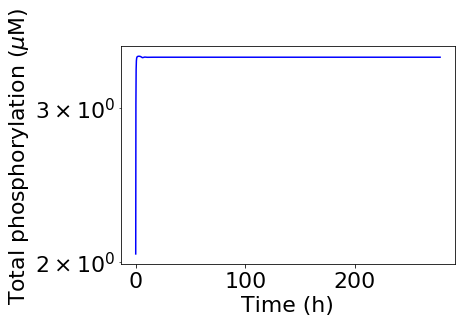

period = 0
nIP = 19
$\rho_{tot}$ $(\mu$M$)$ = 0.4448979591836735


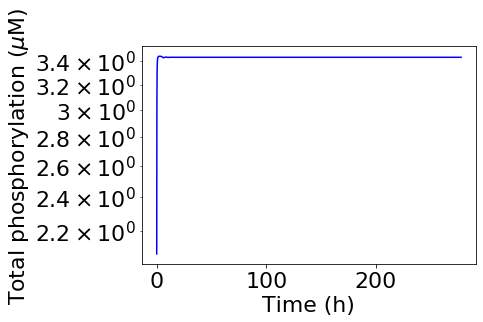

period = 0
nIP = 20
$\rho_{tot}$ $(\mu$M$)$ = 0.4489795918367347


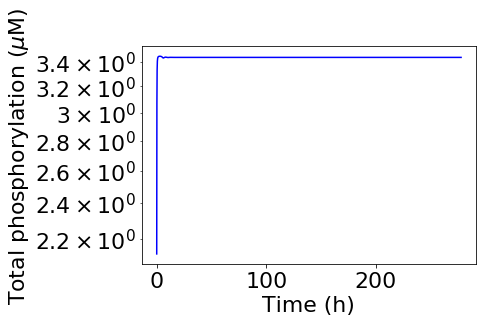

period = 0
nIP = 22
$\rho_{tot}$ $(\mu$M$)$ = 0.4530612244897959


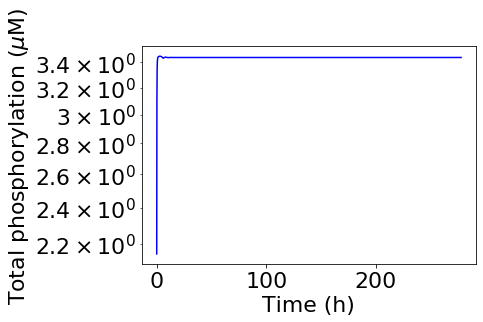

period = 0
nIP = 25
$\rho_{tot}$ $(\mu$M$)$ = 0.4571428571428572


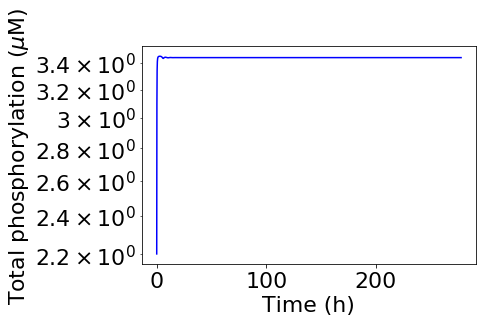

period = 0
nIP = 26
$\rho_{tot}$ $(\mu$M$)$ = 0.4612244897959184


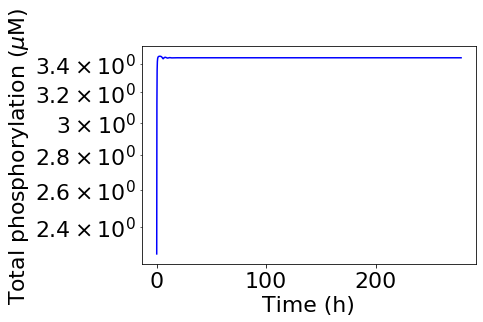

period = 0
nIP = 29
$\rho_{tot}$ $(\mu$M$)$ = 0.4653061224489796


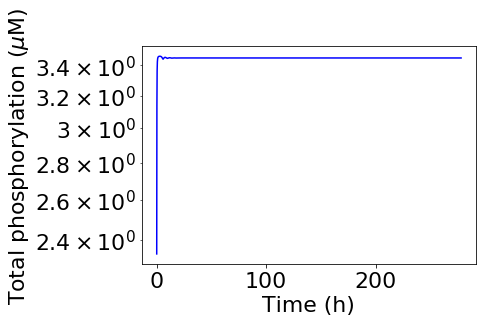

period = 0
nIP = 31
$\rho_{tot}$ $(\mu$M$)$ = 0.46938775510204084


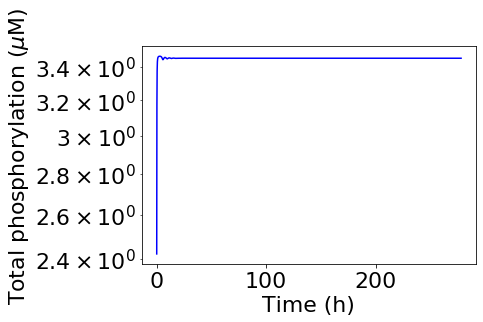

period = 0
nIP = 36
$\rho_{tot}$ $(\mu$M$)$ = 0.47346938775510206


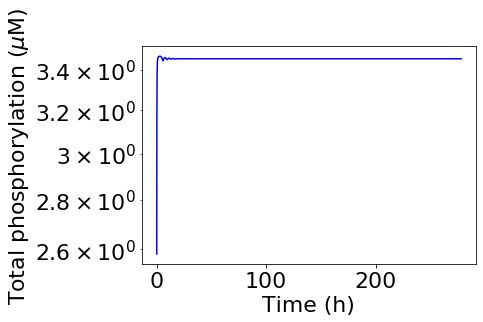

period = 0
nIP = 44
$\rho_{tot}$ $(\mu$M$)$ = 0.4775510204081633


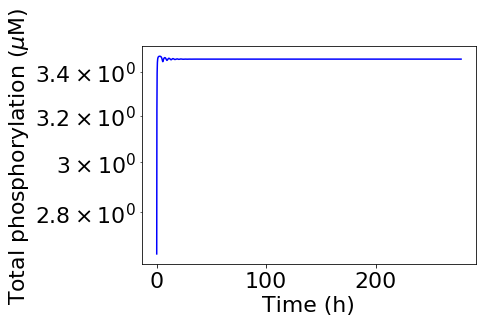

period = 0
nIP = 53
$\rho_{tot}$ $(\mu$M$)$ = 0.4816326530612245


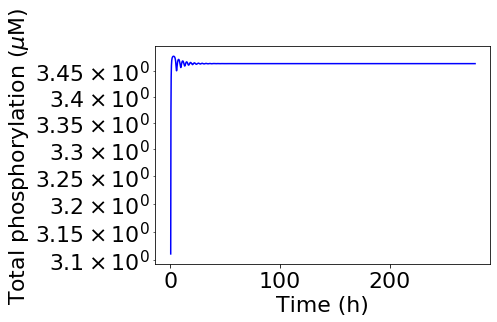

period = 0
nIP = 65
$\rho_{tot}$ $(\mu$M$)$ = 0.4857142857142857


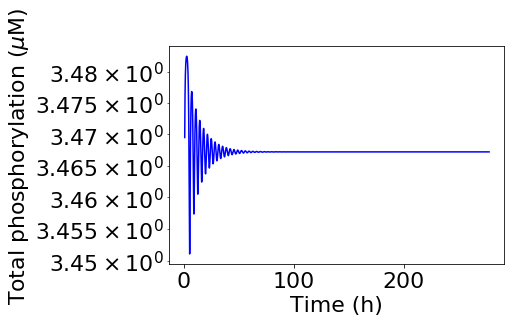

period = 0
nIP = 93
$\rho_{tot}$ $(\mu$M$)$ = 0.4897959183673469


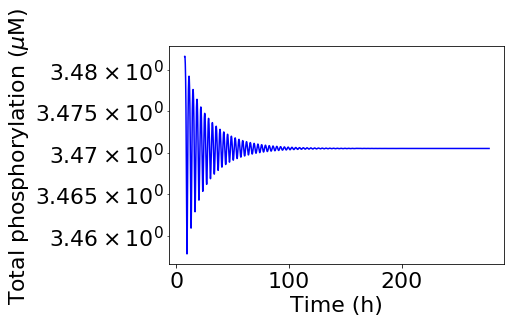

period = 0
nIP = 163
$\rho_{tot}$ $(\mu$M$)$ = 0.4938775510204082


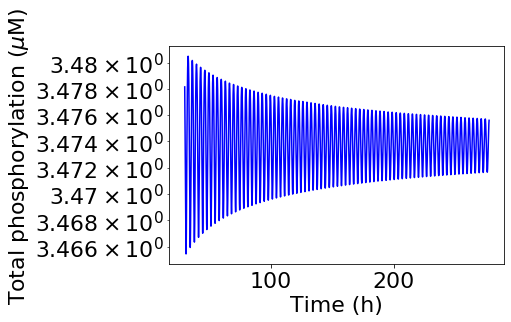

period = 0
nIP = 166
$\rho_{tot}$ $(\mu$M$)$ = 0.49795918367346936


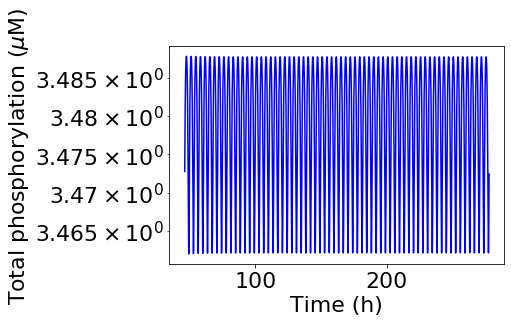

period = 12833.746442293748
nIP = 155
$\rho_{tot}$ $(\mu$M$)$ = 0.5020408163265306


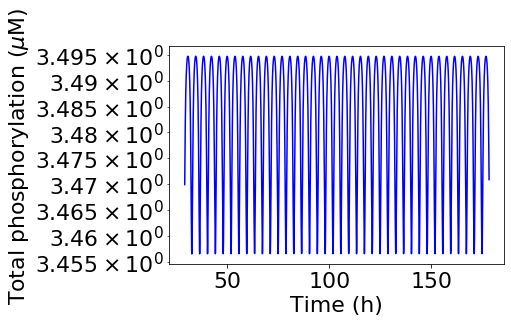

period = 13837.938637521816
nIP = 92
$\rho_{tot}$ $(\mu$M$)$ = 0.5061224489795918


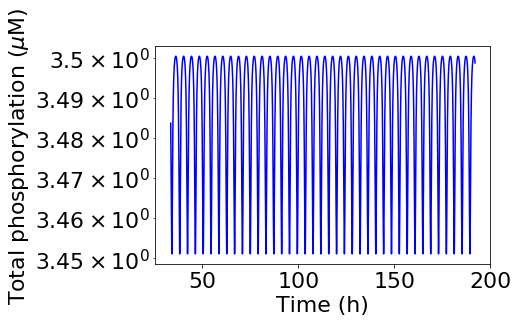

period = 14663.244425104
nIP = 94
$\rho_{tot}$ $(\mu$M$)$ = 0.5102040816326531


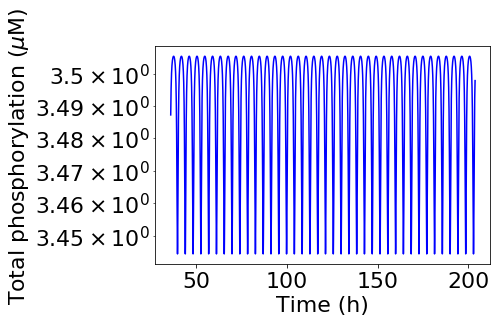

period = 15449.35372478806
nIP = 95
$\rho_{tot}$ $(\mu$M$)$ = 0.5142857142857142


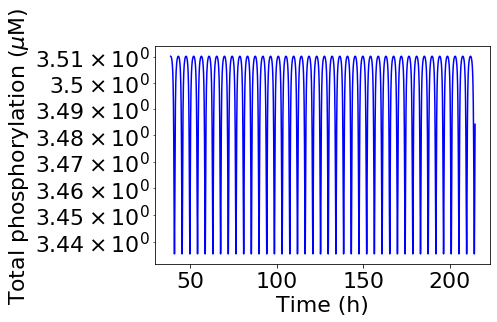

period = 16062.008259907132
nIP = 97
$\rho_{tot}$ $(\mu$M$)$ = 0.5183673469387755


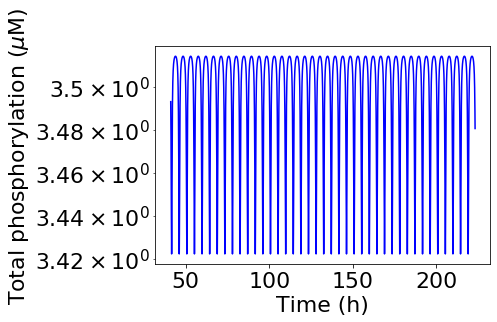

period = 16372.633470316534
nIP = 98
$\rho_{tot}$ $(\mu$M$)$ = 0.5224489795918368


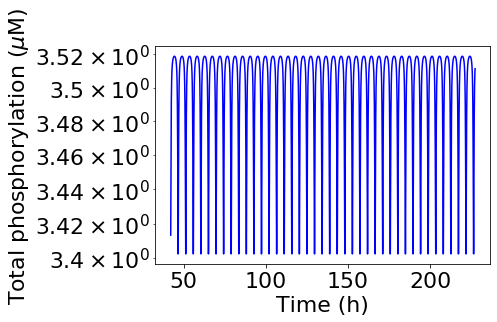

period = 16602.624123000423
nIP = 99
$\rho_{tot}$ $(\mu$M$)$ = 0.5265306122448979


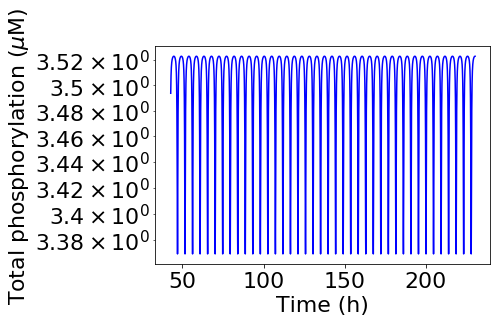

period = 16732.79615238344
nIP = 100
$\rho_{tot}$ $(\mu$M$)$ = 0.5306122448979592


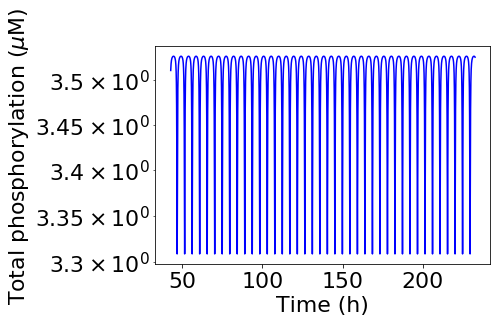

period = 16758.170618233387
nIP = 100
$\rho_{tot}$ $(\mu$M$)$ = 0.5346938775510204


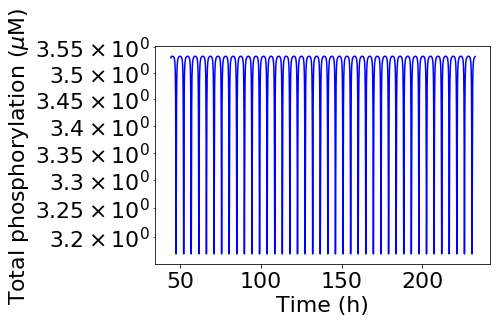

period = 16955.378913927823
nIP = 100
$\rho_{tot}$ $(\mu$M$)$ = 0.5387755102040817


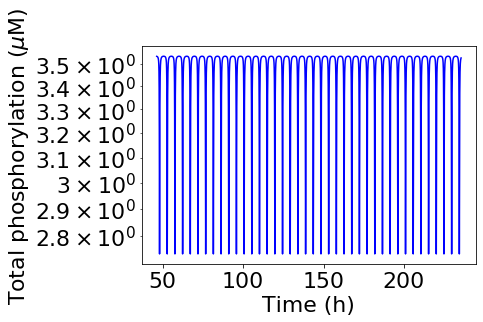

period = 17200.400031044963
nIP = 100
$\rho_{tot}$ $(\mu$M$)$ = 0.5428571428571429


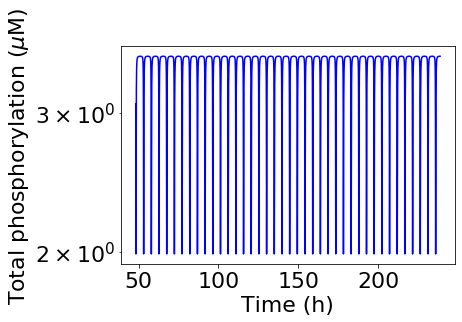

period = 17336.934852673905
nIP = 100
$\rho_{tot}$ $(\mu$M$)$ = 0.5469387755102041


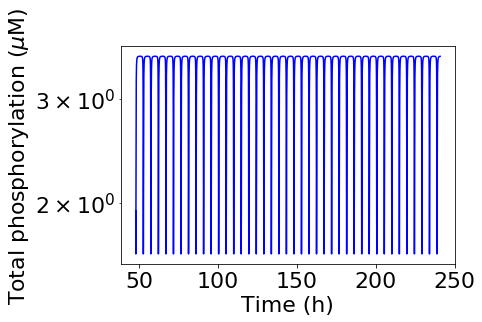

period = 17187.777657487546
nIP = 102
$\rho_{tot}$ $(\mu$M$)$ = 0.5510204081632653


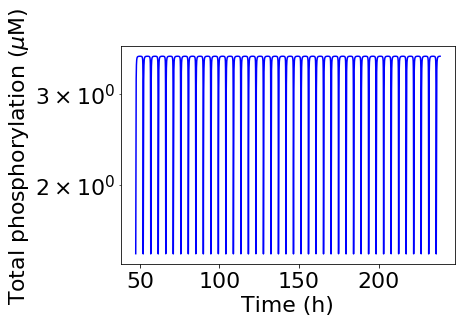

period = 17008.60379420081
nIP = 102
$\rho_{tot}$ $(\mu$M$)$ = 0.5551020408163265


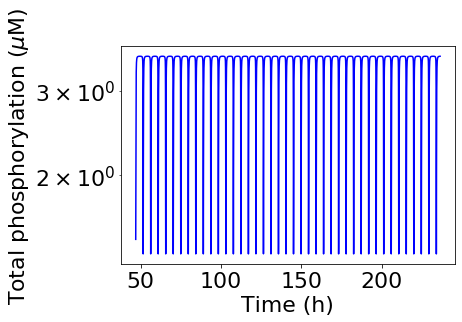

period = 16829.545716087334
nIP = 102
$\rho_{tot}$ $(\mu$M$)$ = 0.5591836734693878


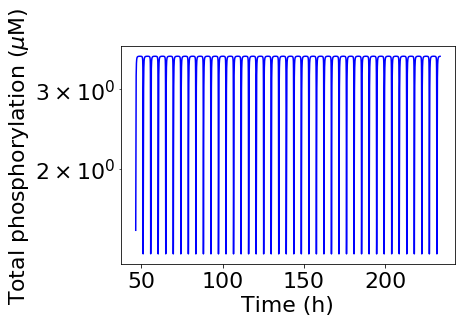

period = 16676.171524503035
nIP = 102
$\rho_{tot}$ $(\mu$M$)$ = 0.563265306122449


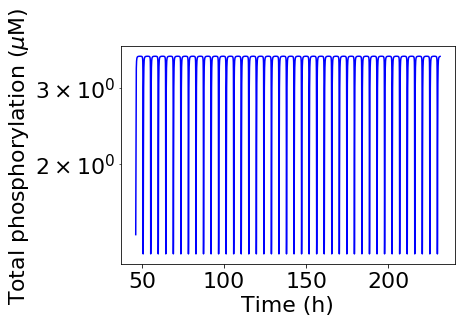

period = 16558.127487750957
nIP = 102
$\rho_{tot}$ $(\mu$M$)$ = 0.5673469387755102


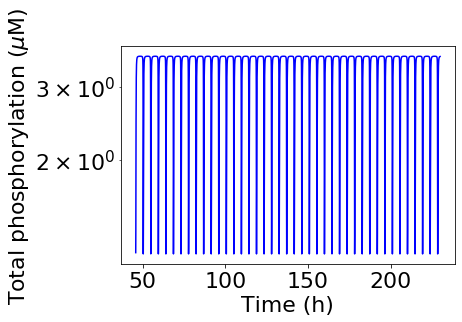

period = 16448.91269245604
nIP = 102
$\rho_{tot}$ $(\mu$M$)$ = 0.5714285714285714


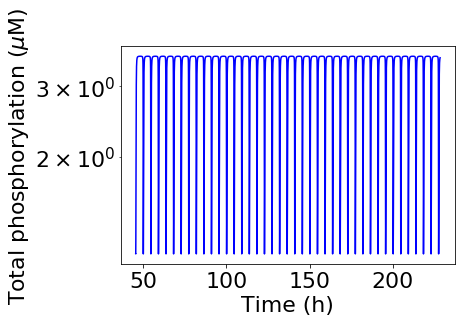

period = 16386.2997406926
nIP = 102
$\rho_{tot}$ $(\mu$M$)$ = 0.5755102040816327


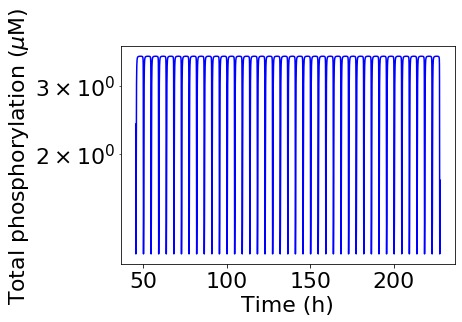

period = 16365.711015119101
nIP = 101
$\rho_{tot}$ $(\mu$M$)$ = 0.5795918367346939


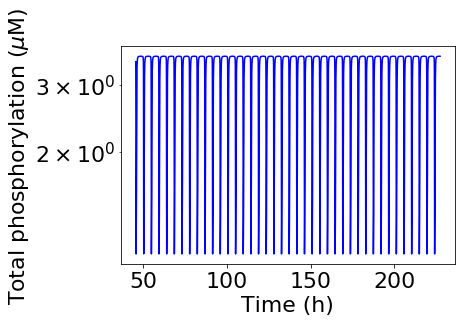

period = 16449.551708268584
nIP = 100
$\rho_{tot}$ $(\mu$M$)$ = 0.5836734693877551


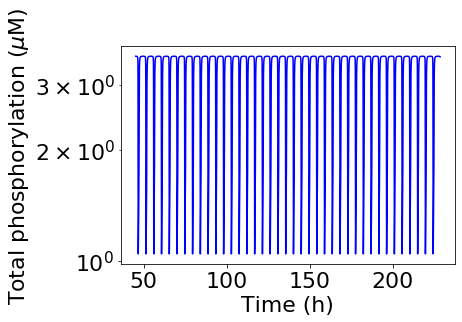

period = 16816.558493951103
nIP = 98
$\rho_{tot}$ $(\mu$M$)$ = 0.5877551020408163


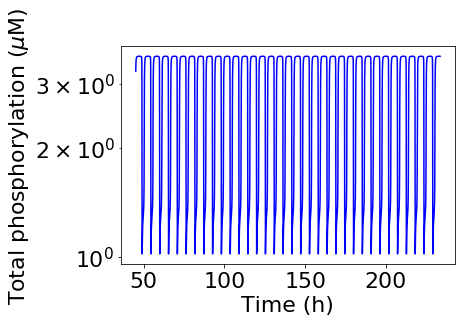

period = 19625.790728568332
nIP = 86
$\rho_{tot}$ $(\mu$M$)$ = 0.5918367346938775


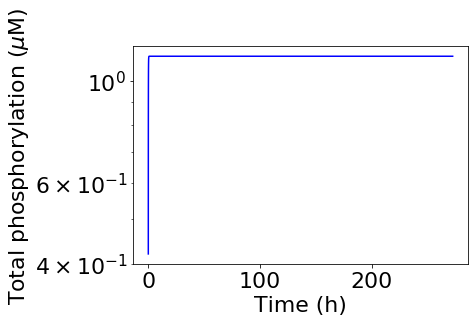

period = 0
nIP = 1
$\rho_{tot}$ $(\mu$M$)$ = 0.5959183673469388


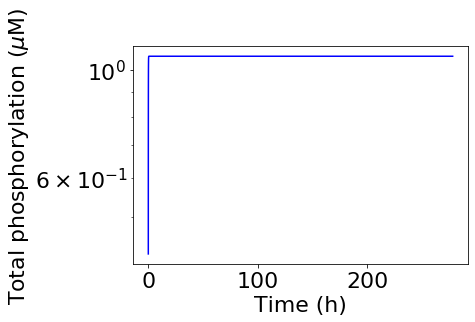

period = 0
nIP = 1
$\rho_{tot}$ $(\mu$M$)$ = 0.6


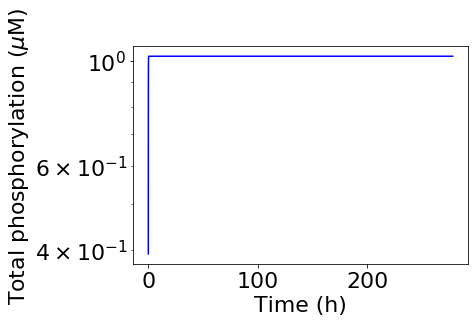

period = 0
nIP = 1


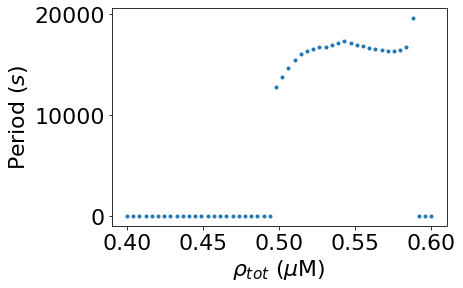

In [18]:
logscale = False
if logscale:
    ptots = np.logspace(-1, 1, num_points, base=10)
else:
    ptots = np.linspace(0.4, 0.6, num_points)
period_fxn_ptot = robustness(7, ptots, logscale)

$\tilde{P}$ $(\mu$M$)$ = 1e-12


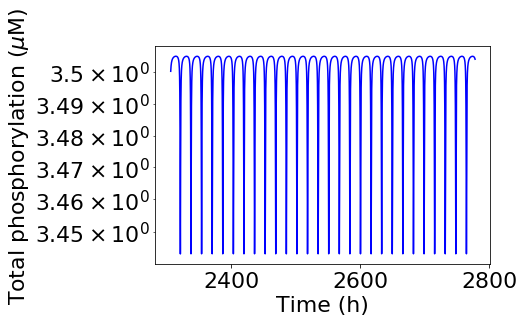

period = 59110.3260312397
nIP = 64
$\tilde{P}$ $(\mu$M$)$ = 1.4563484775012444e-12


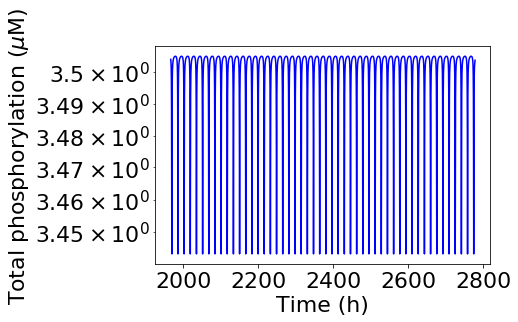

period = 59095.485512040555
nIP = 111
$\tilde{P}$ $(\mu$M$)$ = 2.1209508879201927e-12


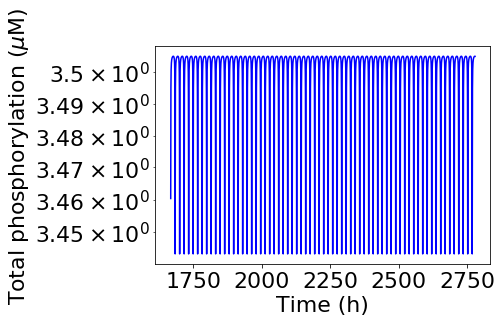

period = 59094.73765763454
nIP = 158
$\tilde{P}$ $(\mu$M$)$ = 3.088843596477485e-12


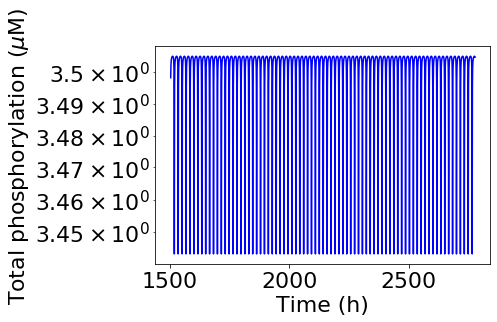

period = 59180.76048024185
nIP = 182
$\tilde{P}$ $(\mu$M$)$ = 4.498432668969453e-12


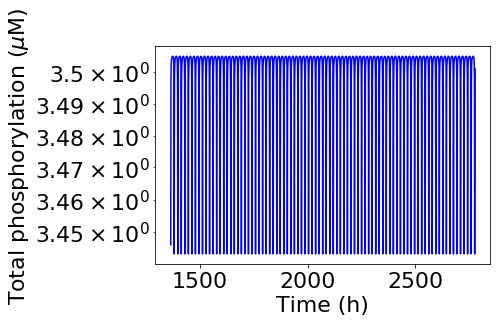

period = 59079.86641920544
nIP = 209
$\tilde{P}$ $(\mu$M$)$ = 6.551285568595496e-12


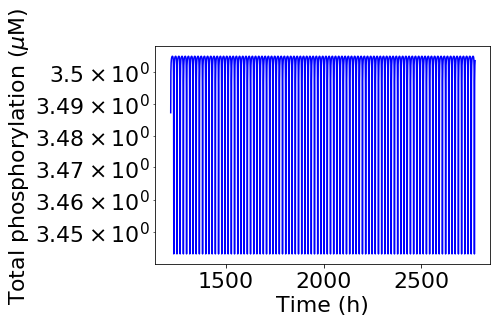

period = 59076.20965534635
nIP = 231
$\tilde{P}$ $(\mu$M$)$ = 9.540954763499924e-12


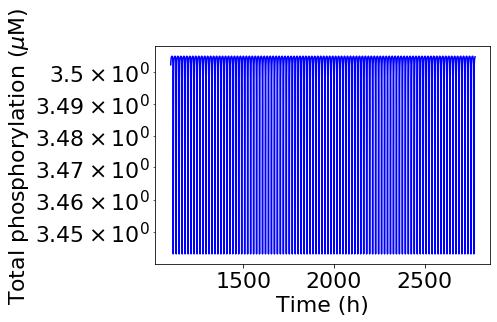

period = 59214.434376090765
nIP = 250
$\tilde{P}$ $(\mu$M$)$ = 1.389495494373136e-11


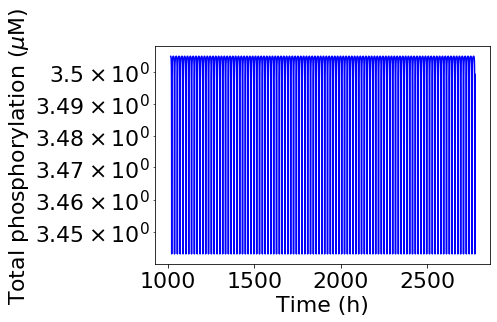

period = 59062.50632927753
nIP = 265
$\tilde{P}$ $(\mu$M$)$ = 2.0235896477251556e-11


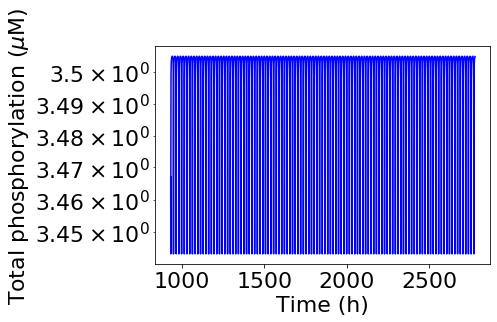

period = 59219.65394757129
nIP = 278
$\tilde{P}$ $(\mu$M$)$ = 2.94705170255181e-11


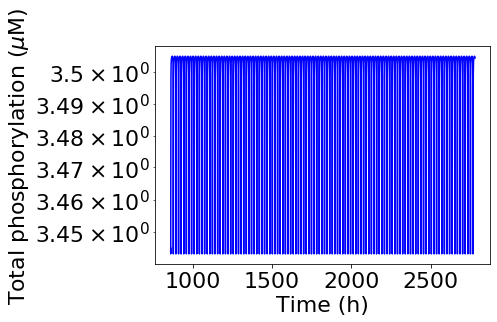

period = 59190.62816393003
nIP = 288
$\tilde{P}$ $(\mu$M$)$ = 4.2919342601287785e-11


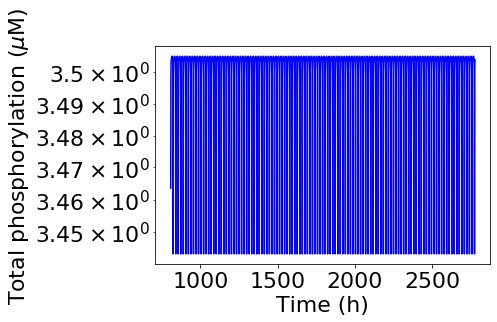

period = 59008.079706719145
nIP = 297
$\tilde{P}$ $(\mu$M$)$ = 6.250551925273977e-11


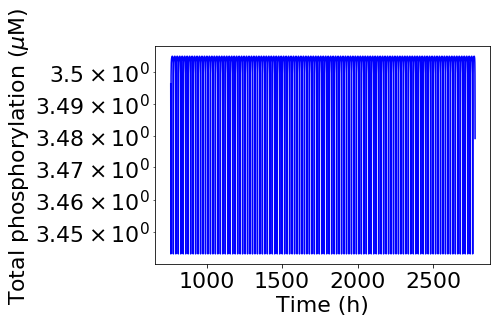

period = 59177.10079605691
nIP = 304
$\tilde{P}$ $(\mu$M$)$ = 9.102981779915227e-11


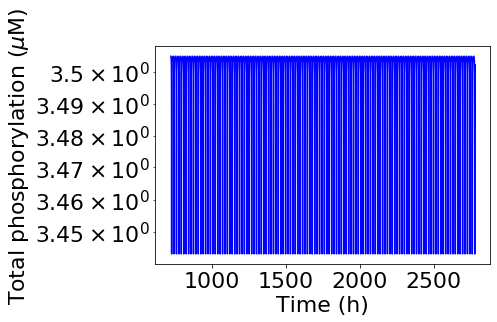

period = 58895.68292997964
nIP = 311
$\tilde{P}$ $(\mu$M$)$ = 1.3257113655901109e-10


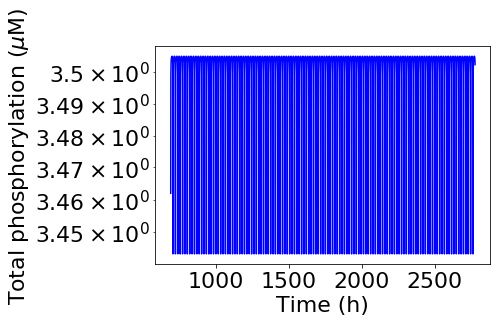

period = 58869.908579565585
nIP = 316
$\tilde{P}$ $(\mu$M$)$ = 1.9306977288832457e-10


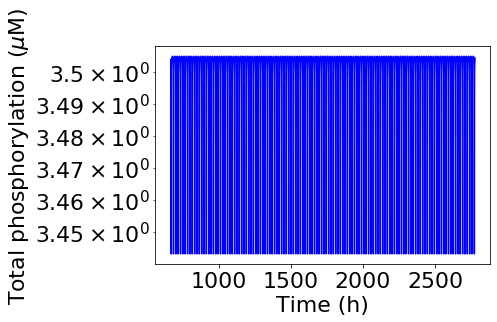

period = 58720.014932885766
nIP = 321
$\tilde{P}$ $(\mu$M$)$ = 2.811768697974225e-10


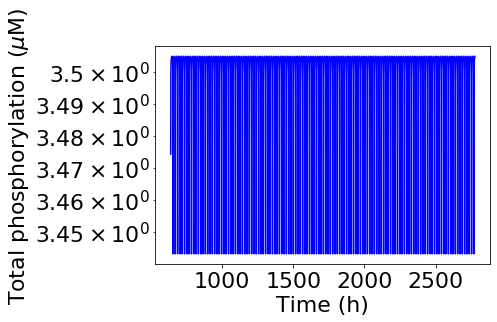

period = 58487.281082917005
nIP = 326
$\tilde{P}$ $(\mu$M$)$ = 4.0949150623804193e-10


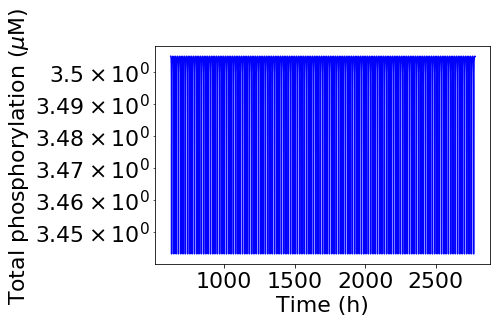

period = 58157.89000651613
nIP = 330
$\tilde{P}$ $(\mu$M$)$ = 5.963623316594636e-10


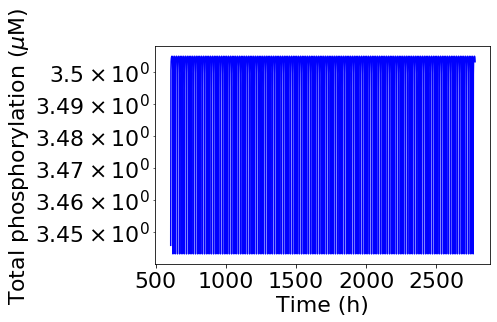

period = 57952.54823317565
nIP = 334
$\tilde{P}$ $(\mu$M$)$ = 8.68511373751352e-10


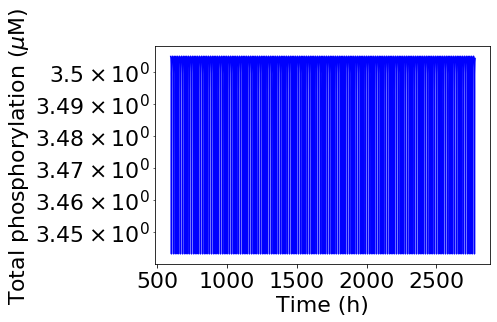

period = 57495.45333866216
nIP = 339
$\tilde{P}$ $(\mu$M$)$ = 1.2648552168552958e-09


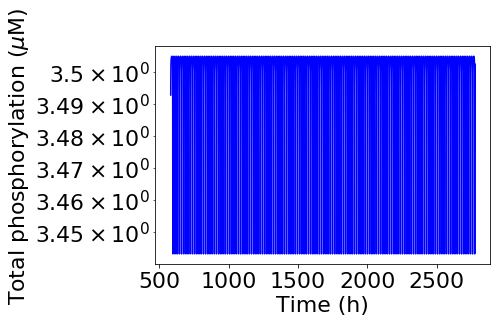

period = 56822.83910315856
nIP = 345
$\tilde{P}$ $(\mu$M$)$ = 1.8420699693267164e-09


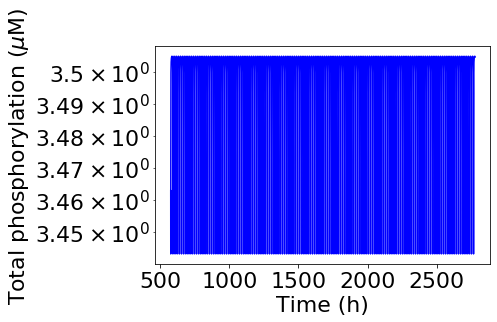

period = 55744.34657809138
nIP = 352
$\tilde{P}$ $(\mu$M$)$ = 2.6826957952797275e-09


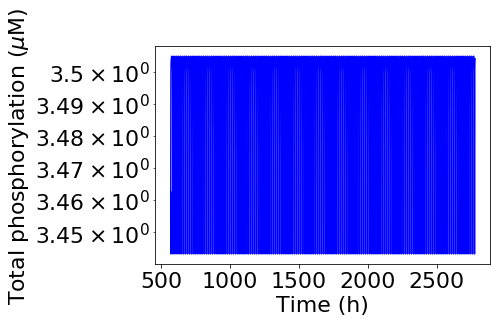

period = 54687.262215146795
nIP = 361
$\tilde{P}$ $(\mu$M$)$ = 3.906939937054621e-09


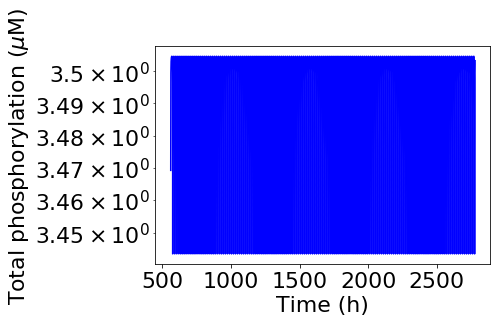

period = 53060.612638806924
nIP = 373
$\tilde{P}$ $(\mu$M$)$ = 5.689866029018281e-09


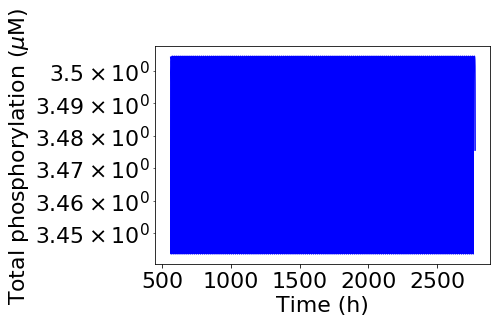

period = 51122.771186744794
nIP = 388
$\tilde{P}$ $(\mu$M$)$ = 8.28642772854686e-09


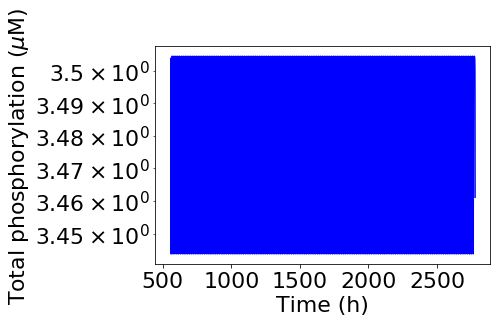

period = 48270.27027674951
nIP = 408
$\tilde{P}$ $(\mu$M$)$ = 1.206792640639329e-08


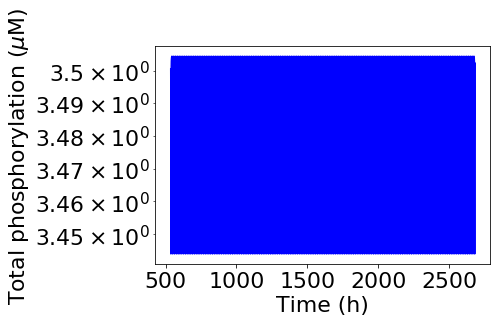

period = 45883.60311707109
nIP = 419
$\tilde{P}$ $(\mu$M$)$ = 1.7575106248547893e-08


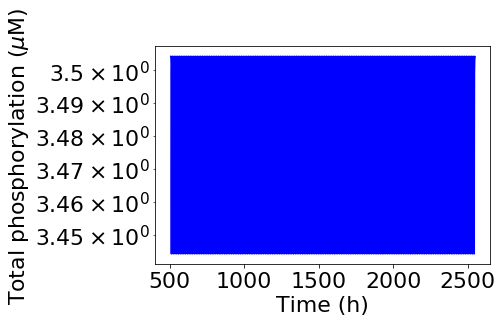

period = 42717.987670086324
nIP = 428
$\tilde{P}$ $(\mu$M$)$ = 2.5595479226995333e-08


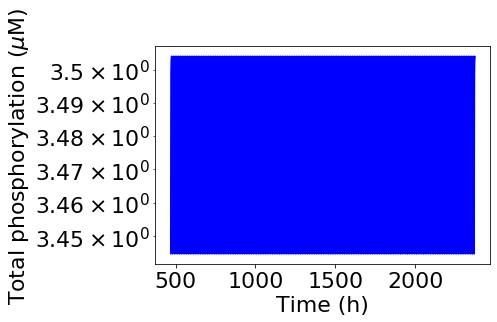

period = 39497.7271674443
nIP = 432
$\tilde{P}$ $(\mu$M$)$ = 3.7275937203149377e-08


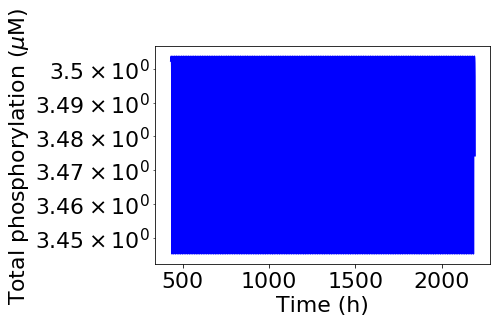

period = 36270.3448302215
nIP = 436
$\tilde{P}$ $(\mu$M$)$ = 5.4286754393238595e-08


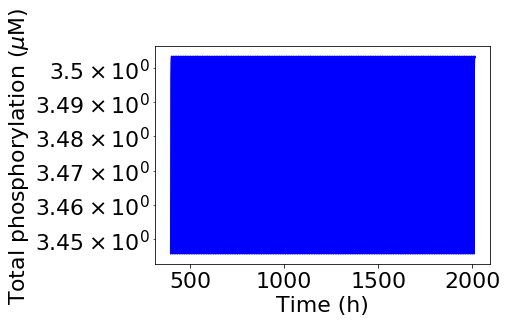

period = 32495.680726738647
nIP = 442
$\tilde{P}$ $(\mu$M$)$ = 7.906043210907685e-08


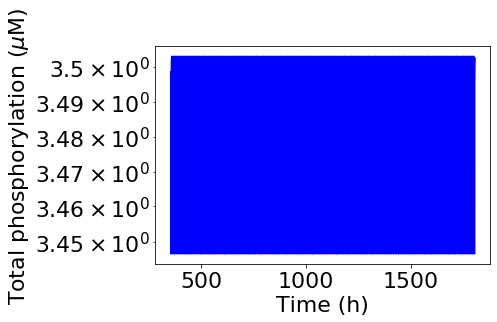

period = 29580.342481475323
nIP = 440
$\tilde{P}$ $(\mu$M$)$ = 1.1513953993264457e-07


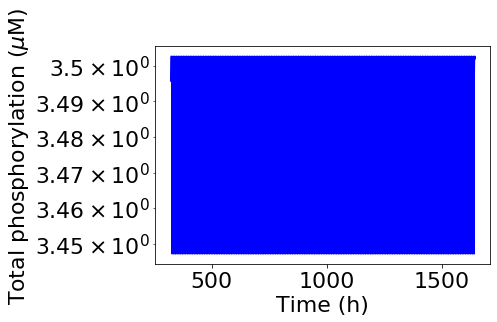

period = 26498.18613847252
nIP = 446
$\tilde{P}$ $(\mu$M$)$ = 1.6768329368110066e-07


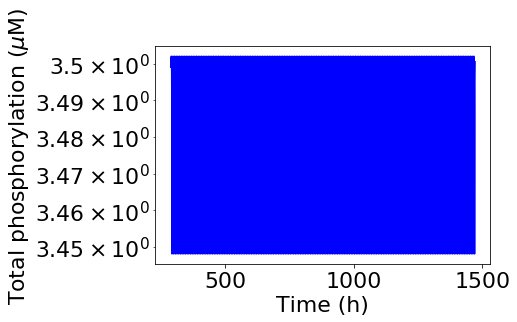

period = 23658.989894883707
nIP = 447
$\tilde{P}$ $(\mu$M$)$ = 2.4420530945486497e-07


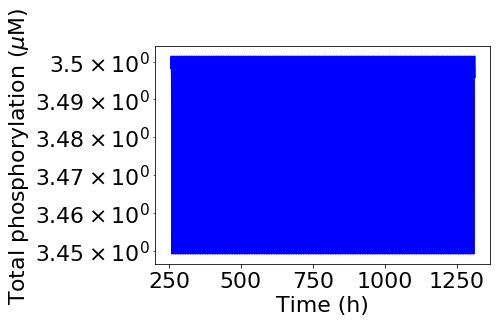

period = 21070.787944937125
nIP = 448
$\tilde{P}$ $(\mu$M$)$ = 3.5564803062231287e-07


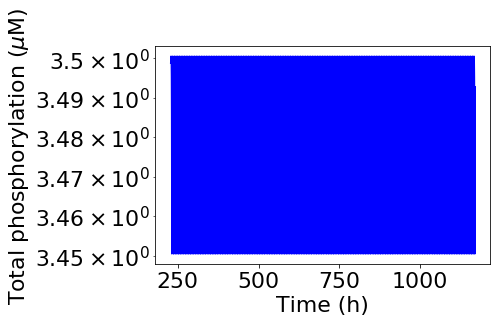

period = 18753.481122781523
nIP = 449
$\tilde{P}$ $(\mu$M$)$ = 5.179474679231202e-07


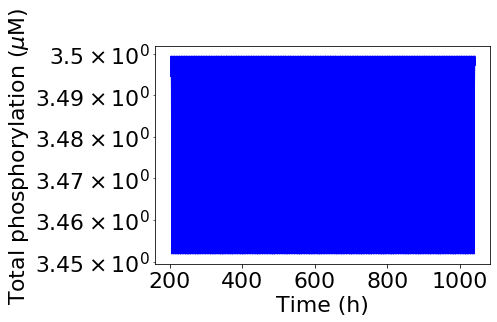

period = 16670.72541115526
nIP = 450
$\tilde{P}$ $(\mu$M$)$ = 7.543120063354607e-07


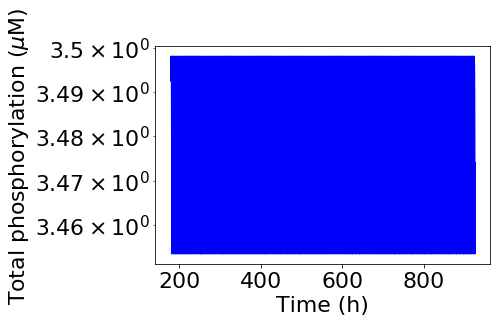

period = 14748.164089187048
nIP = 451
$\tilde{P}$ $(\mu$M$)$ = 1.0985411419875572e-06


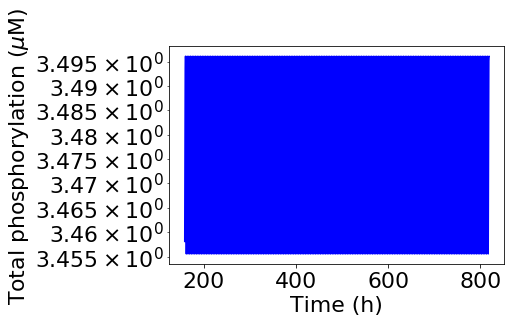

period = 13112.063626732212
nIP = 450
$\tilde{P}$ $(\mu$M$)$ = 1.5998587196060574e-06


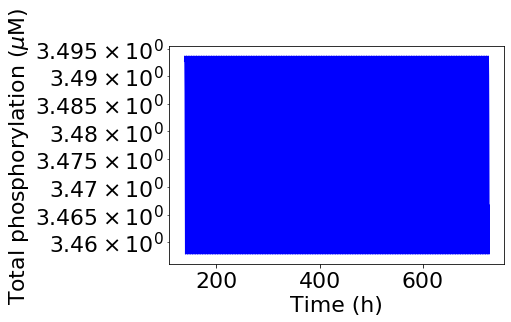

period = 11649.82159903925
nIP = 451
$\tilde{P}$ $(\mu$M$)$ = 2.329951810515367e-06


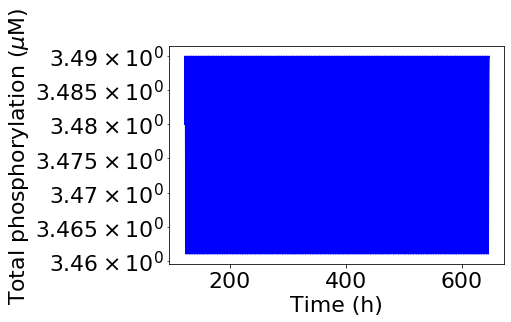

period = 10190.47886927519
nIP = 452
$\tilde{P}$ $(\mu$M$)$ = 3.3932217718953226e-06


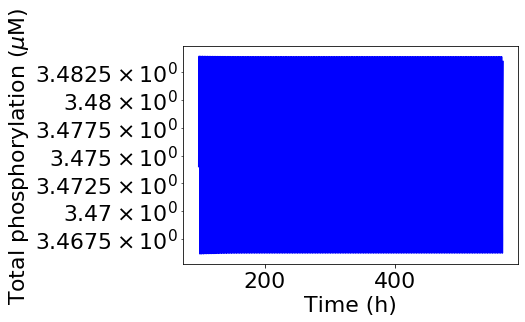

period = 9137.307139955461
nIP = 446
$\tilde{P}$ $(\mu$M$)$ = 4.9417133613238285e-06


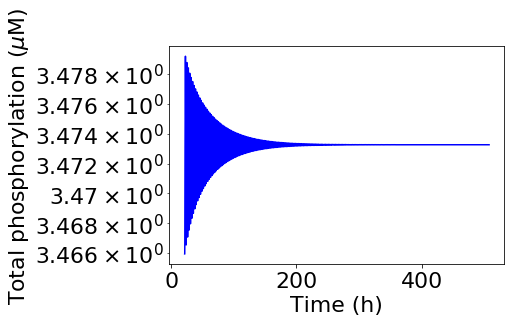

period = 0
nIP = 403
$\tilde{P}$ $(\mu$M$)$ = 7.196856730011514e-06


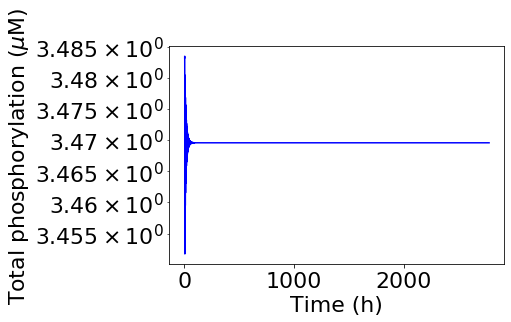

period = 0
nIP = 150
$\tilde{P}$ $(\mu$M$)$ = 1.0481131341546853e-05


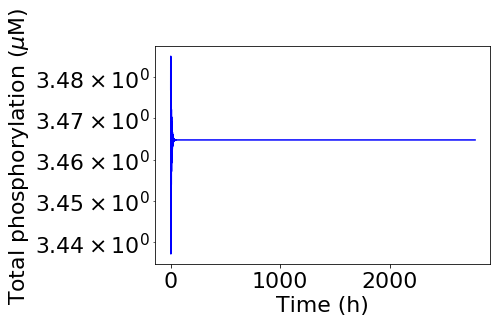

period = 0
nIP = 93
$\tilde{P}$ $(\mu$M$)$ = 1.5264179671752304e-05


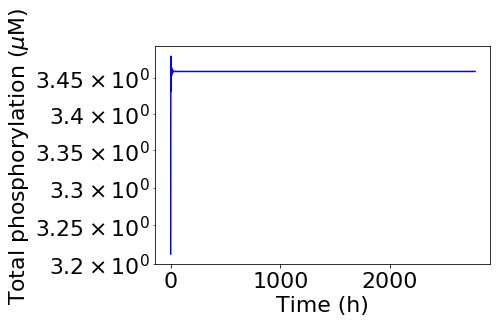

period = 0
nIP = 70
$\tilde{P}$ $(\mu$M$)$ = 2.222996482526191e-05


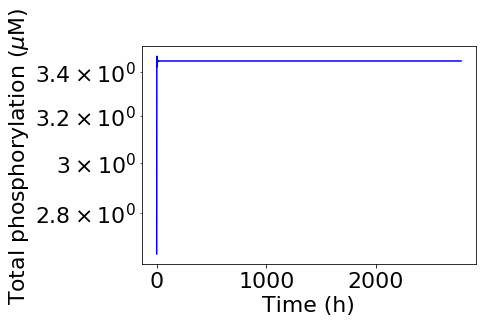

period = 0
nIP = 56
$\tilde{P}$ $(\mu$M$)$ = 3.23745754281764e-05


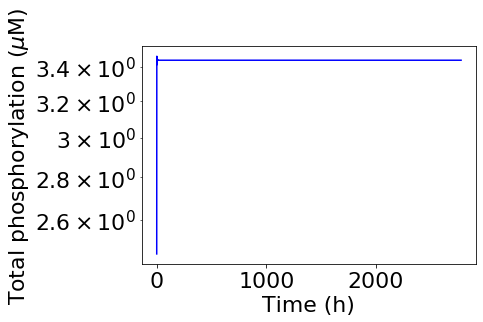

period = 0
nIP = 50
$\tilde{P}$ $(\mu$M$)$ = 4.71486636345739e-05


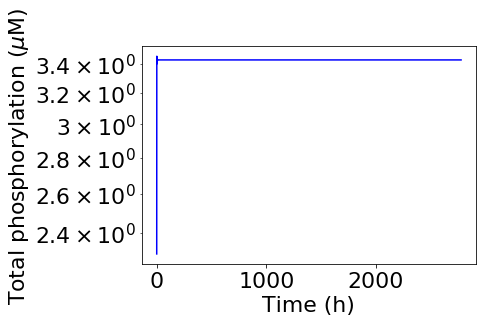

period = 0
nIP = 44
$\tilde{P}$ $(\mu$M$)$ = 6.866488450042999e-05


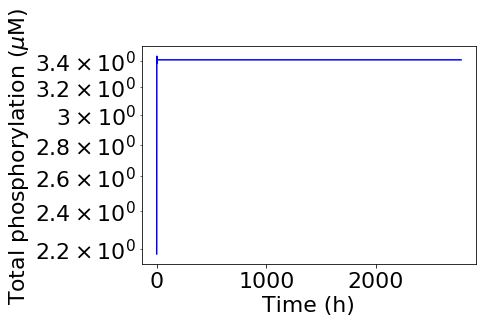

period = 0
nIP = 36
$\tilde{P}$ $(\mu$M$)$ = 0.0001


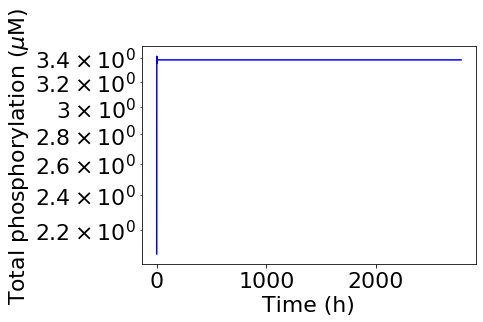

period = 0
nIP = 35


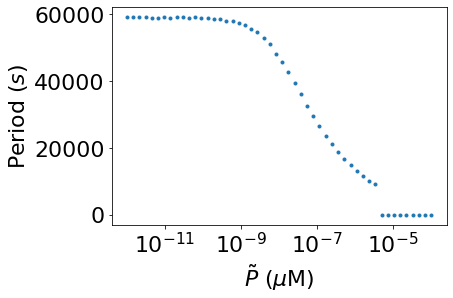

In [19]:
logscale = True
if logscale:
    ptildes = np.logspace(-12, -4, num_points, base=10)
else:
    ptildes = np.linspace(1e-8, 1e-6, num_points)
period_fxn_ptilde = robustness(8, ptildes, logscale, init_tmax=1e7)

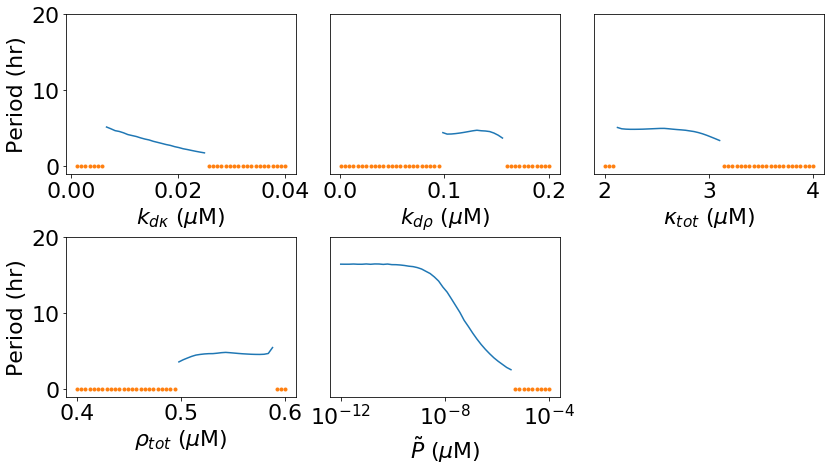

In [20]:
fig, axs = plt.subplots(2,3, figsize=(12,7))

axs[0, 0].plot(kdks[period_fxn_kdk > 0], period_fxn_kdk[period_fxn_kdk>0])
axs[0, 0].plot(kdks[period_fxn_kdk == 0], period_fxn_kdk[period_fxn_kdk == 0], '.')
axs[0, 0].set_xlabel(var_list[0])
# axs[0, 0].set_xscale('log')
# axs[0, 0].set_xticks([1e-1, 1e0, 1e1])
# axs[0, 0].xaxis.grid(True, which='minor')
# axs[0, 0].tick_params(axis='x', which='minor')
# axs[0, 0].get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
axs[0, 0].set_ylabel('Period (hr)')
axs[0, 0].set_ylim([-1, 20])

axs[0, 1].plot(kdps[period_fxn_kdp > 0], period_fxn_kdp[period_fxn_kdp > 0])
axs[0, 1].plot(kdps[period_fxn_kdp == 0], period_fxn_kdp[period_fxn_kdp == 0], '.')
axs[0, 1].set_xlabel(var_list[1])
# axs[0, 1].set_xscale ('log')
# axs[0, 1].set_xticks([1e-2, 1e-1])
axs[0, 1].set_ylim([-1, 20])
axs[0, 1].set_yticks([])

axs[0, 2].plot(ktots[period_fxn_ktot>0], period_fxn_ktot[period_fxn_ktot>0])
axs[0, 2].plot(ktots[period_fxn_ktot==0], period_fxn_ktot[period_fxn_ktot==0], '.')
axs[0, 2].set_xlabel(var_list[6])
# axs[0, 2].set_xticks([0, 0.001, 0.002])
# axs[0, 2].set_xticklabels(['0', '1', '2'])
# plt.ticklabel_format(style='sci', axis='x', scilimits=(-5,-5))
axs[0, 2].set_ylim([-1, 20])
axs[0, 2].set_yticks([])

axs[1, 0].plot(ptots[period_fxn_ptot>0], period_fxn_ptot[period_fxn_ptot>0])
axs[1, 0].plot(ptots[period_fxn_ptot==0], period_fxn_ptot[period_fxn_ptot==0], '.')
axs[1, 0].set_xlabel(var_list[7])
# axs[1, 0].set_xticks([0, 5e-3, 1e-2, 1.5e-2])
# axs[1, 0].set_xticklabels(['0', '5', '10', '15'])
axs[1, 0].set_ylim([-1, 20])
axs[1, 0].set_ylabel('Period (hr)')
# axs[1, 0].set_yticks([])

axs[1, 1].plot(ptildes[period_fxn_ptilde>0], period_fxn_ptilde[period_fxn_ptilde>0])
axs[1, 1].plot(ptildes[period_fxn_ptilde==0], period_fxn_ptilde[period_fxn_ptilde==0], '.')
axs[1, 1].set_xlabel(var_list[8])
axs[1, 1].set_xscale('log')
axs[1, 1].set_xticks([1e-12, 1e-8, 1e-4])
axs[1, 1].set_ylim([-1, 20])
axs[1, 1].set_yticks([])

axs[1, 2].set_visible(False)

plt.tight_layout(h_pad=0, w_pad=0.2)
# plt.savefig('robustness_unbounded.png', 
#             dpi=800, bbox_inches='tight')
# plt.savefig('robustness_unbounded_small.png', 
#             bbox_inches='tight')
plt.show()

In [21]:
var_list = [r'$k_{d\kappa}$ $(\mu$M$)$', r'$k_{d\rho}$ $(\mu$M$)$',
            r'$\eta_{K\kappa} = \eta_{K\rho}$', r'$\eta_{P\kappa} = \eta_{P\rho}$', 
            r'$\eta_{K\kappa} = \eta_{K\rho}$', r'$\eta_{P\kappa} = \eta_{P\rho}$', 
            r'$\kappa_{tot}$ $(\mu$M$)$', r'$\rho_{tot}$ $(\mu$M$)$', r'$\tilde{P}$ $(\mu$M$)$']

def robustness2(var_index, var_arr, logscale=False, initial_period=1e6):    
    period_arr = np.zeros(len(var_arr))
    period = 0  # to initialize
    
    for e, var in enumerate(var_arr):
        params = [1.96306705e-03, 6.04299238e-03, 
                  2.21428571e-01, 2.21428571e-01, 1.94757282e-01, 1.94757282e-01, 
                  5.41695751e+01, 4.77212000e-01, 5.05814445e-06]
        params[var_index] = var
        if var_index == 2 or var_index == 3:
            params[var_index + 2] = var
        if var_index == 4 or var_index == 5:
            params[var_index - 2] = var
            
        kdA, kdB, gammaAK, gammaBK, gammaAP, gammaBP, Atot, Btot, F = params
        print(var_list[var_index] + ' = ' + str(var))
        
        initialConditions = [2 * Atot / kdA, 2 * Btot / kdB]
        
        if period == 0:
            tmax = initial_period #maximum time we'll integrate to
        else:
            tmax = period * 50
        tSpan = [0,tmax] #np.linspace(0,tmax,numTimePoints)

        toPlot = True

        z,t = system2_Sol(tSpan, params, initialConditions, toPlot, True)
        a = z[:,0]
        b = z[:,1]

        dbdt = (b[1:] - b[0:-1])/(t[1:]-t[0:-1])

        groups = []
        uniquekeys = []
        counter = 0
        prevCounter = 0
        prevPrevCounter = 0
        prevCounterArray = []
        xChange = [] #how much does the value of Ao change in between each inflection point?
        for k, g in groupby(np.sign(dbdt)):
            groups.append(list(g))
            c = len(uniquekeys) #counter that just increases by one in each for loop
            xChange.append(np.sum(dbdt[counter:counter+len(groups[c])]*
                                  (t[counter+1:counter+len(groups[c])+1]-t[counter:counter+len(groups[c])])))
            prevPrevPrevCounter = prevPrevCounter
            prevPrevCounter = prevCounter
            prevCounter = counter
            counter += len(groups[c])
            uniquekeys.append(k)

            prevCounterArray += [t[counter]]
        nIP = len(uniquekeys)

        if (nIP > 10 and min(np.abs(xChange[:-1] / xChange[5])) > 0.5 and 
            t[-3]/t[-2] > 0.95 and abs((abs(xChange[3*len(xChange)//4]) - abs(xChange[-2]))/xChange[-2]) < 1 and 
            not (z<-10000).any()):
            period = prevCounterArray[-4] - prevCounterArray[-6]
        else:
            period = 0
        print('period = ' + str(period))
        print('nIP = ' + str(nIP))
        period_arr[e] = period
        
    plt.figure()
    plt.plot(var_arr, period_arr, '.')
    plt.xlabel(var_list[var_index])
    plt.ylabel(r'Period $(s)$')
    if logscale:
        plt.xscale('log')
    plt.show()
    
    return(period_arr / 3600)  # so it's in units of hrs

$k_{d\kappa}$ $(\mu$M$)$ = 0.001


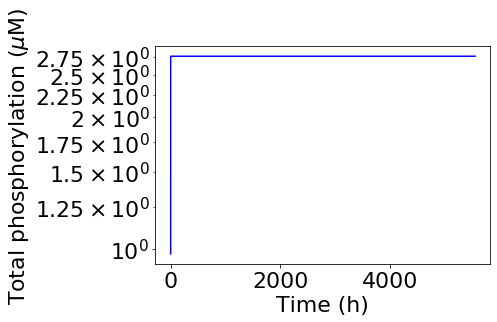

period = 0
nIP = 3
$k_{d\kappa}$ $(\mu$M$)$ = 0.0010985411419875584


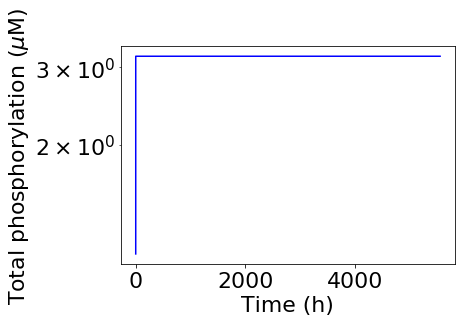

period = 0
nIP = 3
$k_{d\kappa}$ $(\mu$M$)$ = 0.0012067926406393288


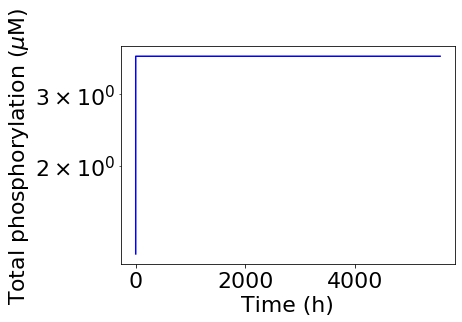

period = 0
nIP = 4
$k_{d\kappa}$ $(\mu$M$)$ = 0.0013257113655901094


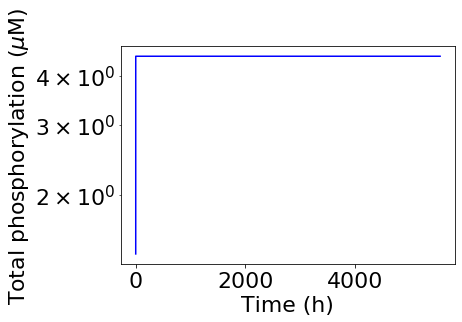

period = 0
nIP = 4
$k_{d\kappa}$ $(\mu$M$)$ = 0.0014563484775012444


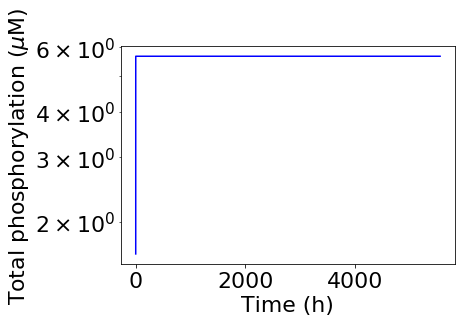

period = 0
nIP = 3
$k_{d\kappa}$ $(\mu$M$)$ = 0.0015998587196060573


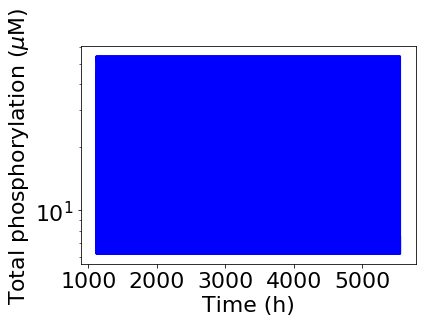

period = 22907.524619974196
nIP = 1747
$k_{d\kappa}$ $(\mu$M$)$ = 0.0017575106248547913


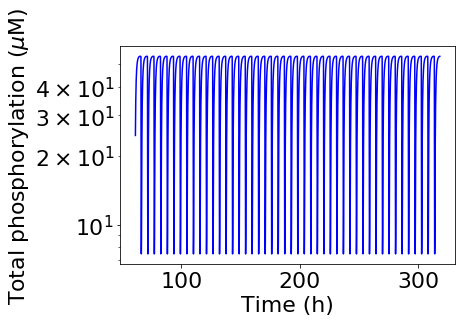

period = 19813.27556854114
nIP = 116
$k_{d\kappa}$ $(\mu$M$)$ = 0.0019306977288832496


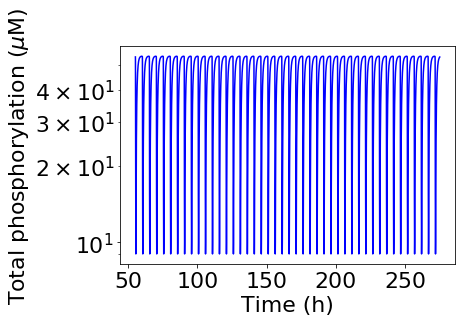

period = 18128.798778864904
nIP = 110
$k_{d\kappa}$ $(\mu$M$)$ = 0.0021209508879201904


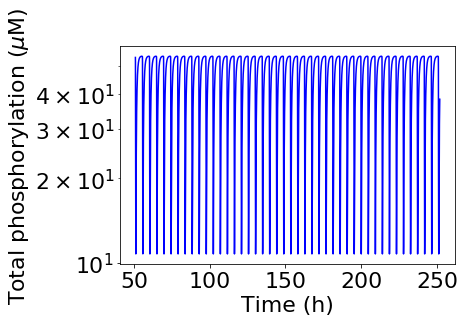

period = 16728.004758404335
nIP = 110
$k_{d\kappa}$ $(\mu$M$)$ = 0.002329951810515372


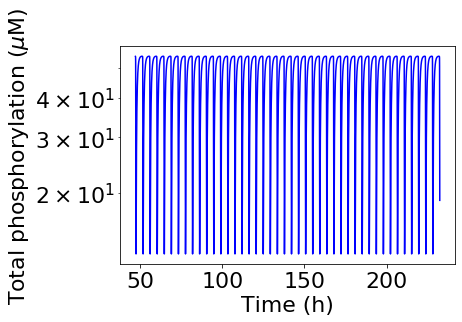

period = 15483.590707065654
nIP = 109
$k_{d\kappa}$ $(\mu$M$)$ = 0.002559547922699536


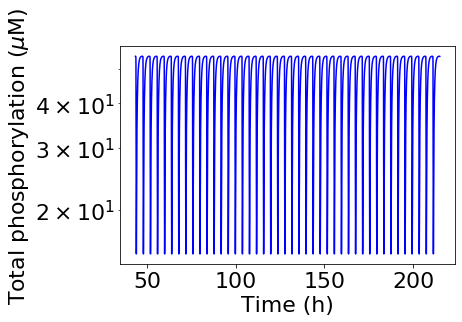

period = 14349.662545175175
nIP = 108
$k_{d\kappa}$ $(\mu$M$)$ = 0.002811768697974231


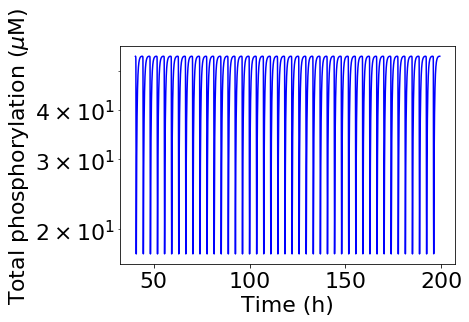

period = 13311.994776894804
nIP = 108
$k_{d\kappa}$ $(\mu$M$)$ = 0.0030888435964774815


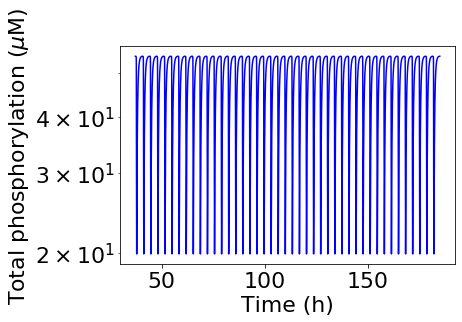

period = 12350.695346717956
nIP = 108
$k_{d\kappa}$ $(\mu$M$)$ = 0.00339322177189533


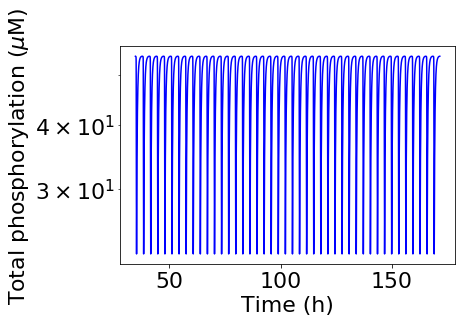

period = 11466.791715025087
nIP = 108
$k_{d\kappa}$ $(\mu$M$)$ = 0.003727593720314938


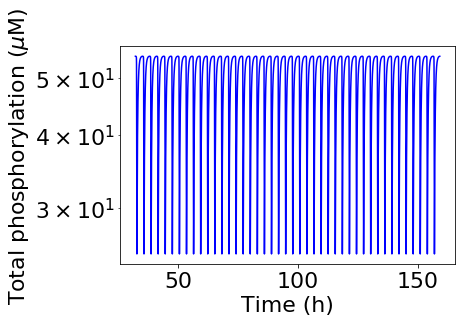

period = 10651.134124433389
nIP = 108
$k_{d\kappa}$ $(\mu$M$)$ = 0.004094915062380423


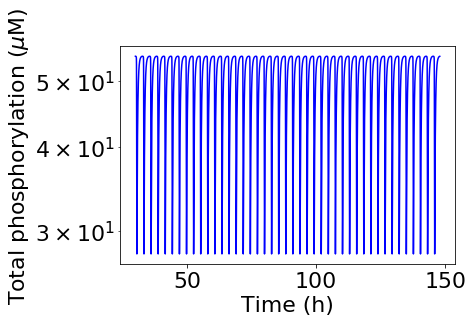

period = 9898.618843556673
nIP = 108
$k_{d\kappa}$ $(\mu$M$)$ = 0.004498432668969444


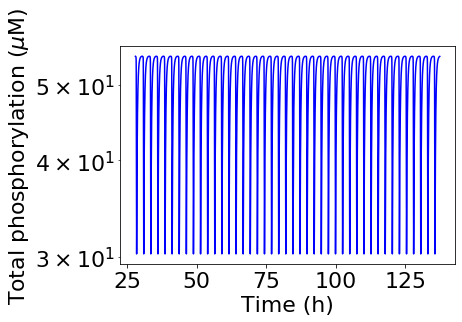

period = 9202.38918089564
nIP = 108
$k_{d\kappa}$ $(\mu$M$)$ = 0.004941713361323833


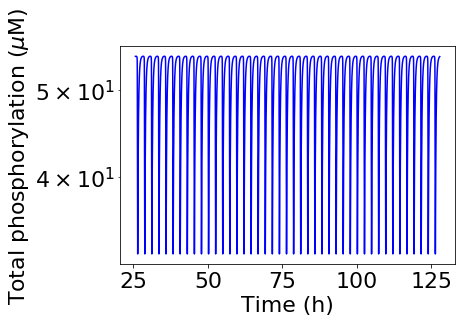

period = 8564.116269395687
nIP = 108
$k_{d\kappa}$ $(\mu$M$)$ = 0.005428675439323859


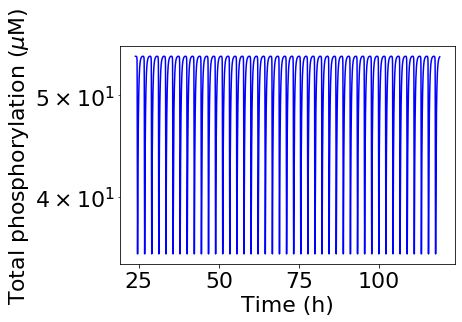

period = 7973.007049060368
nIP = 108
$k_{d\kappa}$ $(\mu$M$)$ = 0.005963623316594642


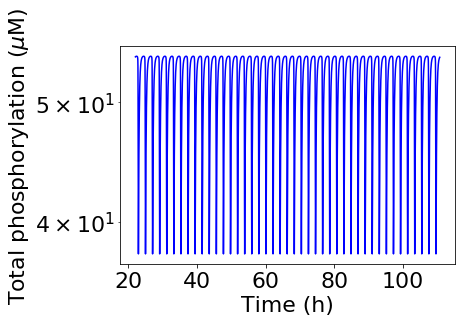

period = 7429.236643509124
nIP = 108
$k_{d\kappa}$ $(\mu$M$)$ = 0.006551285568595509


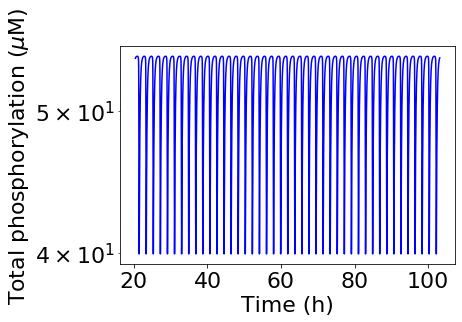

period = 6927.20904663828
nIP = 108
$k_{d\kappa}$ $(\mu$M$)$ = 0.0071968567300115215


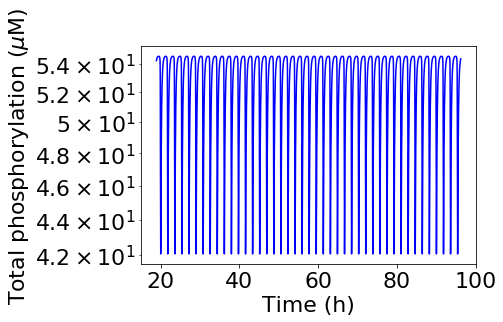

period = 6461.754848031676
nIP = 108
$k_{d\kappa}$ $(\mu$M$)$ = 0.0079060432109077


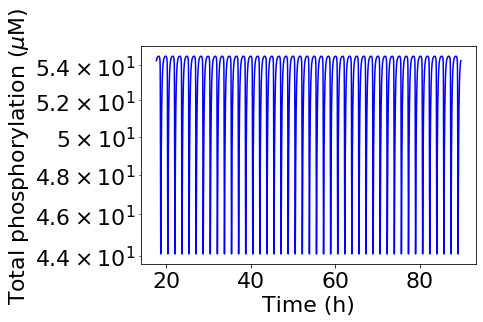

period = 6032.869204970892
nIP = 108
$k_{d\kappa}$ $(\mu$M$)$ = 0.00868511373751352


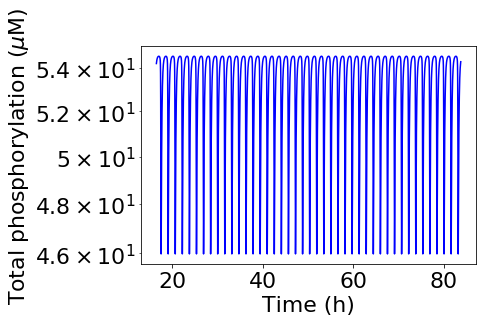

period = 5636.56290022959
nIP = 108
$k_{d\kappa}$ $(\mu$M$)$ = 0.009540954763499945


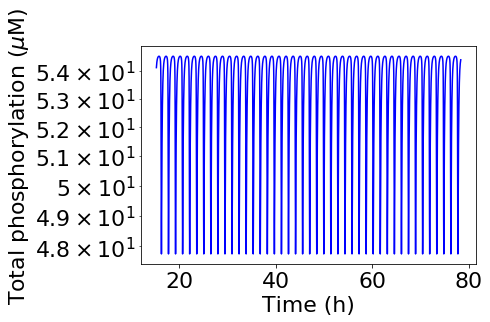

period = 5258.546607217344
nIP = 108
$k_{d\kappa}$ $(\mu$M$)$ = 0.010481131341546858


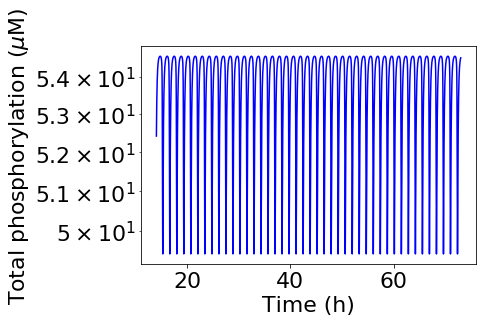

period = 4896.879578351829
nIP = 108
$k_{d\kappa}$ $(\mu$M$)$ = 0.01151395399326447


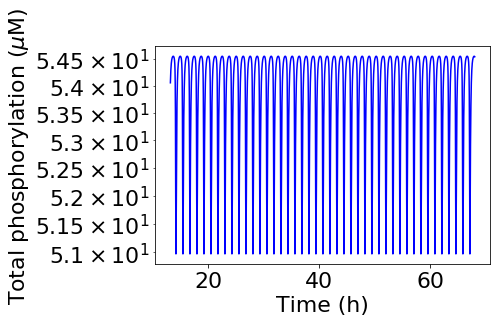

period = 4542.159603531676
nIP = 108
$k_{d\kappa}$ $(\mu$M$)$ = 0.012648552168552958


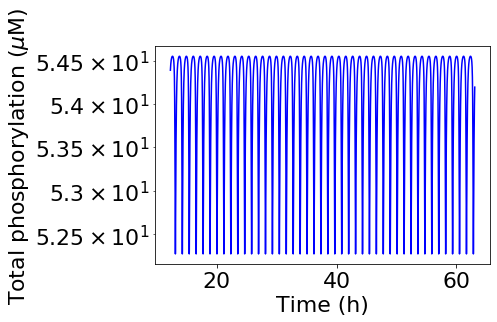

period = 4168.682194927271
nIP = 110
$k_{d\kappa}$ $(\mu$M$)$ = 0.013894954943731374


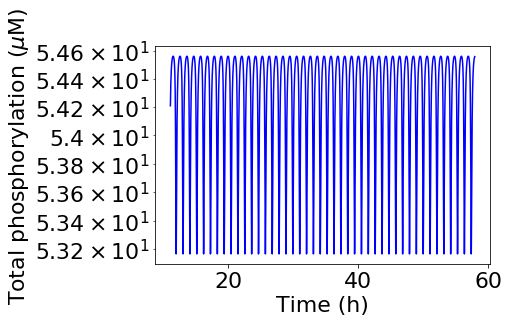

period = 3801.0286549513985
nIP = 110
$k_{d\kappa}$ $(\mu$M$)$ = 0.015264179671752334


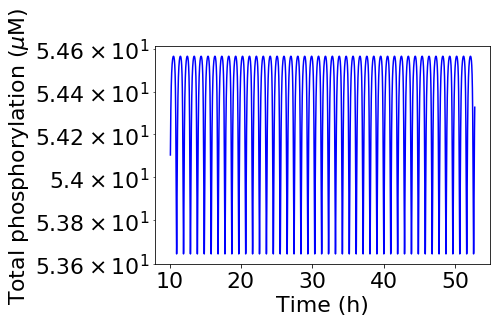

period = 3485.4422513133322
nIP = 110
$k_{d\kappa}$ $(\mu$M$)$ = 0.016768329368110076


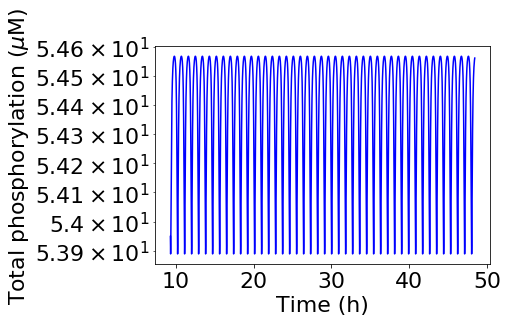

period = 3233.8124056904053
nIP = 108
$k_{d\kappa}$ $(\mu$M$)$ = 0.018420699693267154


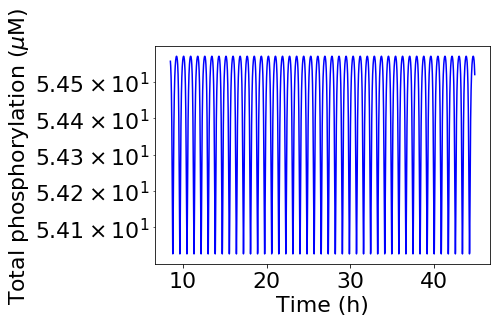

period = 3055.0269987408246
nIP = 106
$k_{d\kappa}$ $(\mu$M$)$ = 0.020235896477251564


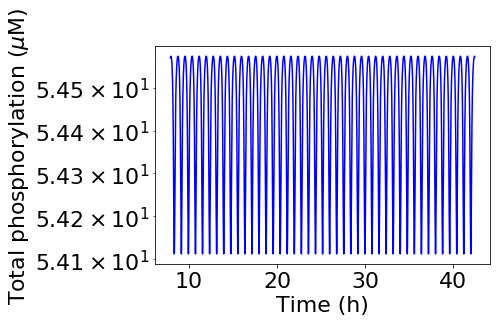

period = 2886.989823284239
nIP = 106
$k_{d\kappa}$ $(\mu$M$)$ = 0.022229964825261943


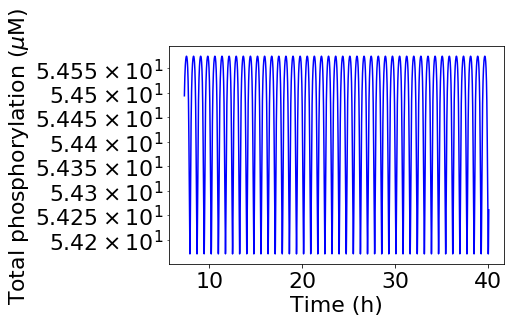

period = 2739.773110063863
nIP = 105
$k_{d\kappa}$ $(\mu$M$)$ = 0.02442053094548651


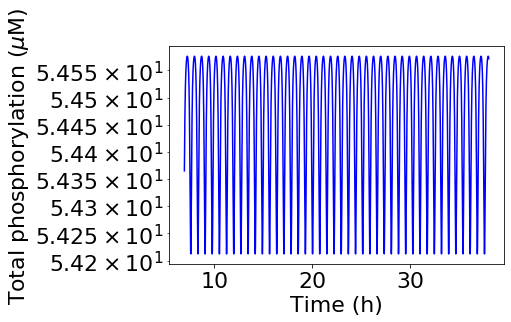

period = 2634.2382961195544
nIP = 104
$k_{d\kappa}$ $(\mu$M$)$ = 0.026826957952797246


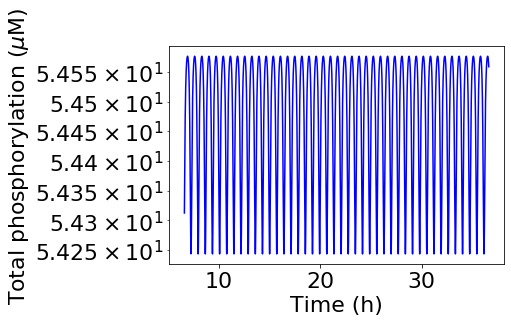

period = 2540.1526060585165
nIP = 104
$k_{d\kappa}$ $(\mu$M$)$ = 0.029470517025518096


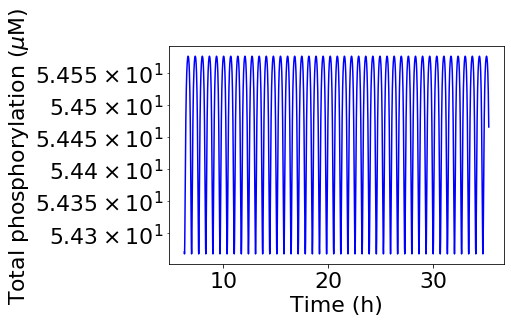

period = 2433.4660583629884
nIP = 104
$k_{d\kappa}$ $(\mu$M$)$ = 0.032374575428176434


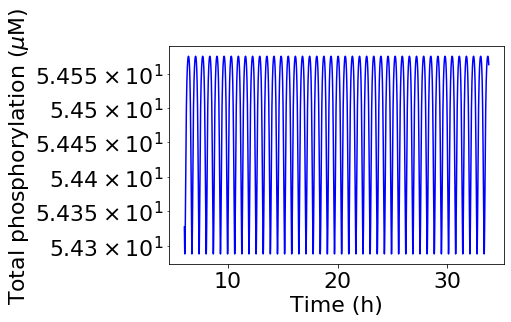

period = 2341.6954085999023
nIP = 104
$k_{d\kappa}$ $(\mu$M$)$ = 0.03556480306223129


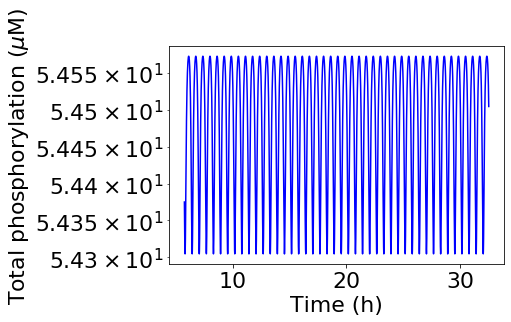

period = 2255.4856486806675
nIP = 104
$k_{d\kappa}$ $(\mu$M$)$ = 0.03906939937054615


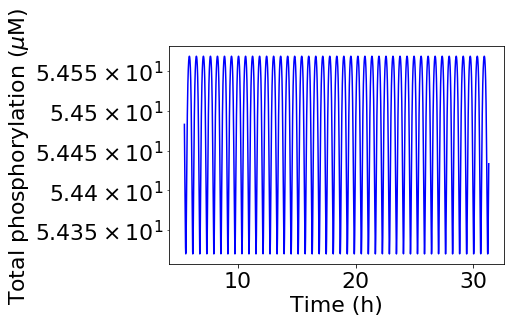

period = 2153.2289472459524
nIP = 105
$k_{d\kappa}$ $(\mu$M$)$ = 0.04291934260128776


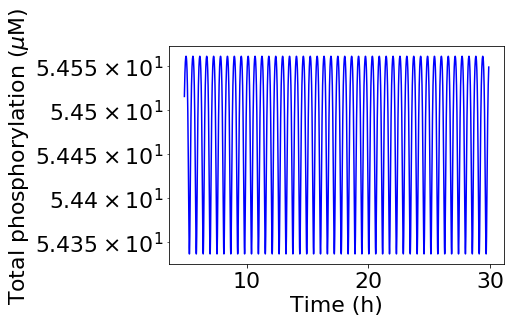

period = 2041.491791641878
nIP = 106
$k_{d\kappa}$ $(\mu$M$)$ = 0.04714866363457392


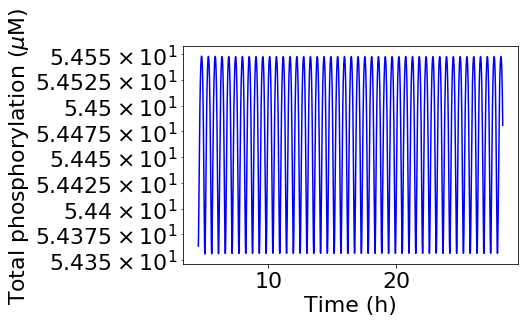

period = 1906.1814584252425
nIP = 106
$k_{d\kappa}$ $(\mu$M$)$ = 0.0517947467923121


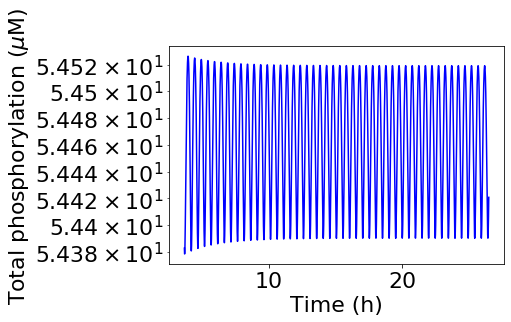

period = 1781.322566096802
nIP = 107
$k_{d\kappa}$ $(\mu$M$)$ = 0.05689866029018296


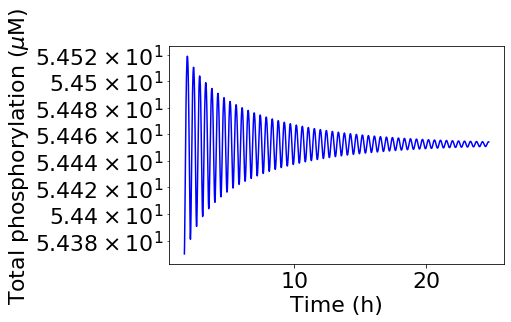

period = 0
nIP = 108
$k_{d\kappa}$ $(\mu$M$)$ = 0.0625055192527397


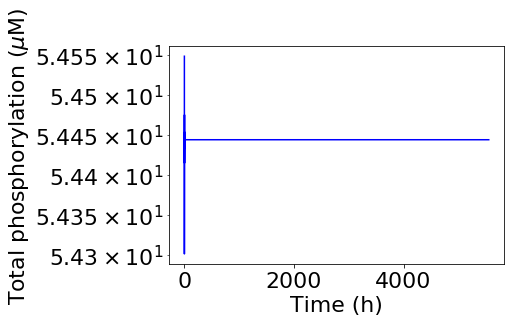

period = 0
nIP = 110
$k_{d\kappa}$ $(\mu$M$)$ = 0.06866488450042998


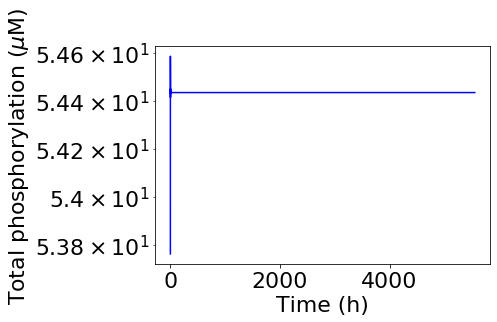

period = 0
nIP = 68
$k_{d\kappa}$ $(\mu$M$)$ = 0.07543120063354615


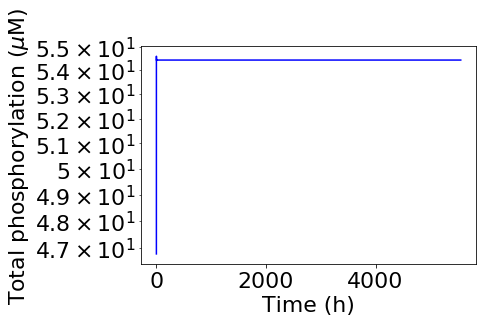

period = 0
nIP = 50
$k_{d\kappa}$ $(\mu$M$)$ = 0.08286427728546843


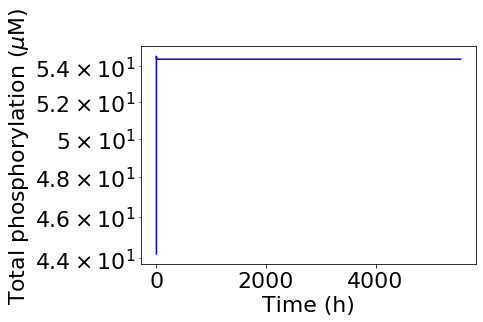

period = 0
nIP = 40
$k_{d\kappa}$ $(\mu$M$)$ = 0.09102981779915217


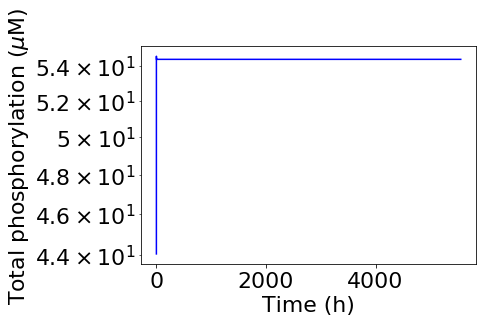

period = 0
nIP = 32
$k_{d\kappa}$ $(\mu$M$)$ = 0.1


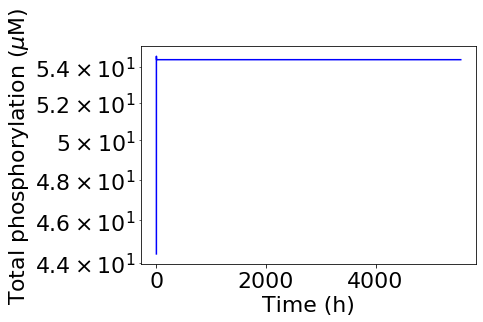

period = 0
nIP = 28


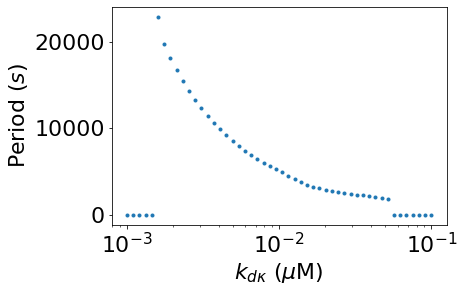

In [22]:
logscale = True
if logscale:
    kdks2 = np.logspace(-3, -1, num_points, base=10)
else:
    kdks2 = np.linspace(1e-4, 0.1, num_points)
period_fxn_kdk2 = robustness2(0, kdks2, logscale, initial_period=2e7)

$k_{d\rho}$ $(\mu$M$)$ = 0.002


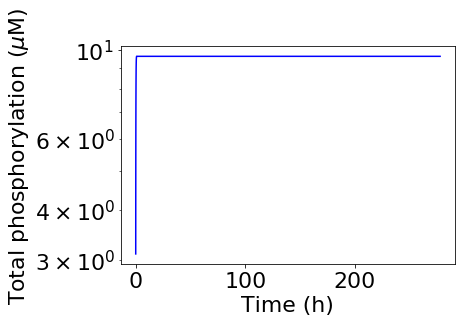

period = 0
nIP = 4
$k_{d\rho}$ $(\mu$M$)$ = 0.002163265306122449


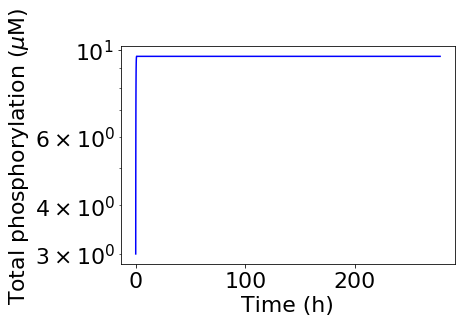

period = 0
nIP = 4
$k_{d\rho}$ $(\mu$M$)$ = 0.002326530612244898


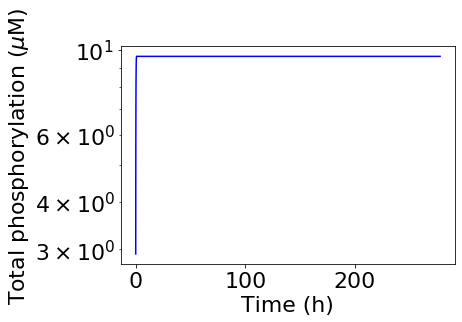

period = 0
nIP = 3
$k_{d\rho}$ $(\mu$M$)$ = 0.002489795918367347


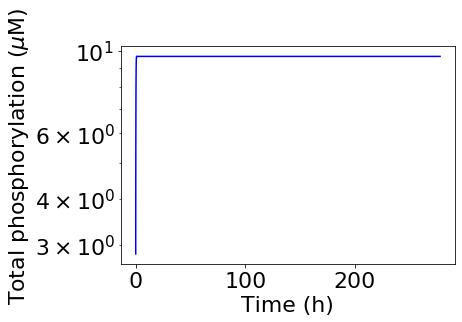

period = 0
nIP = 7
$k_{d\rho}$ $(\mu$M$)$ = 0.002653061224489796


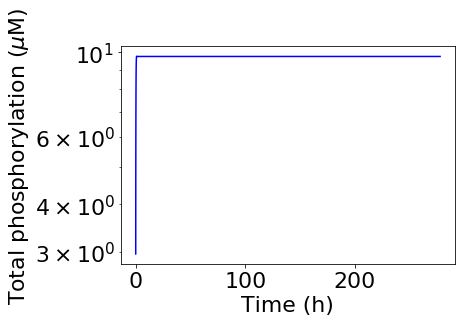

period = 0
nIP = 5
$k_{d\rho}$ $(\mu$M$)$ = 0.002816326530612245


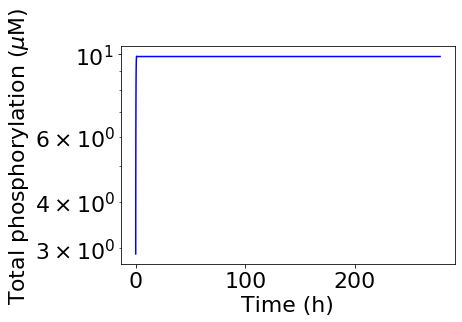

period = 0
nIP = 4
$k_{d\rho}$ $(\mu$M$)$ = 0.002979591836734694


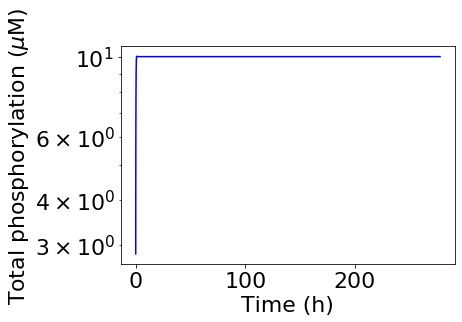

period = 0
nIP = 7
$k_{d\rho}$ $(\mu$M$)$ = 0.003142857142857143


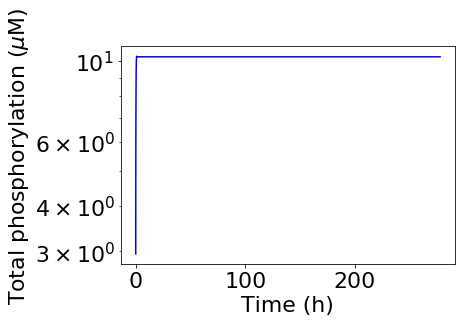

period = 0
nIP = 7
$k_{d\rho}$ $(\mu$M$)$ = 0.003306122448979592


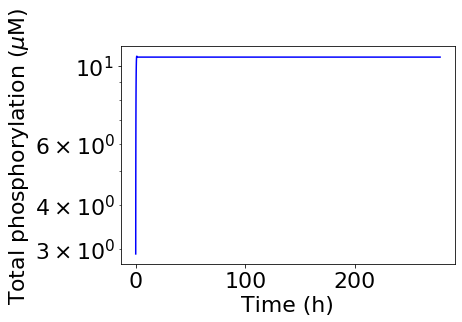

period = 0
nIP = 6
$k_{d\rho}$ $(\mu$M$)$ = 0.0034693877551020408


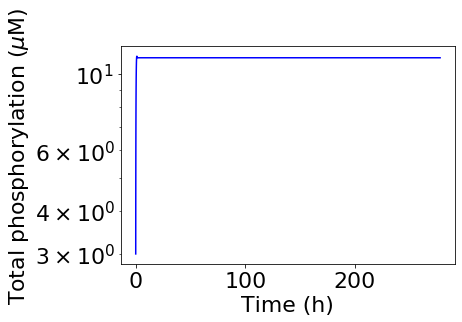

period = 0
nIP = 7
$k_{d\rho}$ $(\mu$M$)$ = 0.00363265306122449


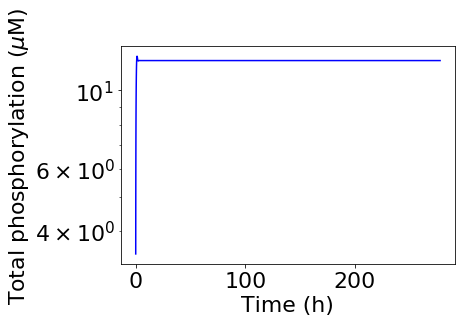

period = 0
nIP = 11
$k_{d\rho}$ $(\mu$M$)$ = 0.003795918367346939


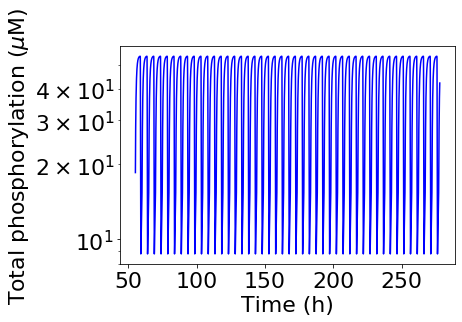

period = 17742.42715393263
nIP = 114
$k_{d\rho}$ $(\mu$M$)$ = 0.003959183673469388


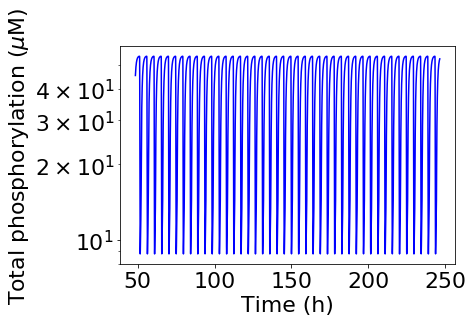

period = 16861.62756640732
nIP = 106
$k_{d\rho}$ $(\mu$M$)$ = 0.004122448979591837


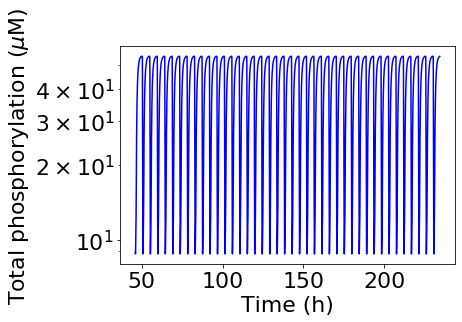

period = 16584.89764617174
nIP = 102
$k_{d\rho}$ $(\mu$M$)$ = 0.004285714285714286


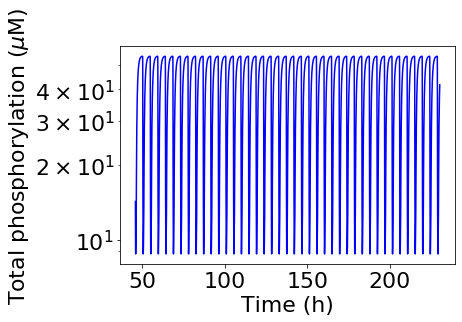

period = 16490.07798428624
nIP = 102
$k_{d\rho}$ $(\mu$M$)$ = 0.004448979591836735


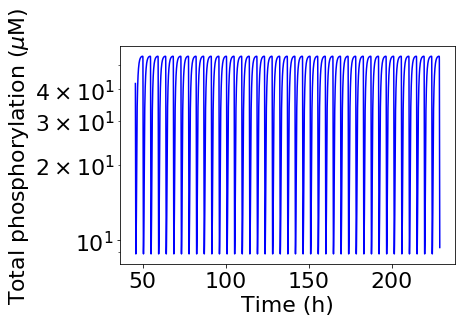

period = 16484.632174192346
nIP = 101
$k_{d\rho}$ $(\mu$M$)$ = 0.004612244897959184


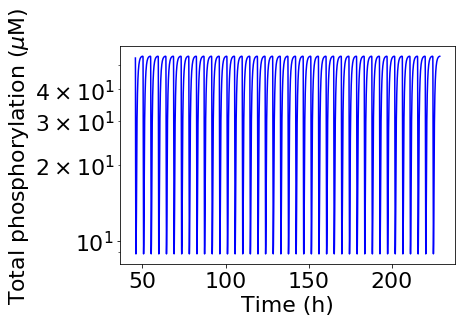

period = 16524.511471917504
nIP = 100
$k_{d\rho}$ $(\mu$M$)$ = 0.004775510204081633


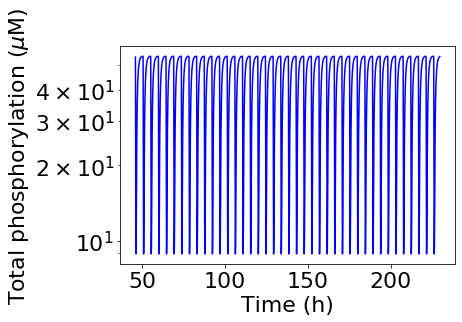

period = 16601.92990961473
nIP = 100
$k_{d\rho}$ $(\mu$M$)$ = 0.0049387755102040815


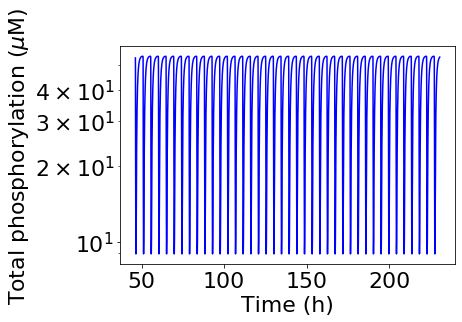

period = 16702.334538794705
nIP = 100
$k_{d\rho}$ $(\mu$M$)$ = 0.005102040816326531


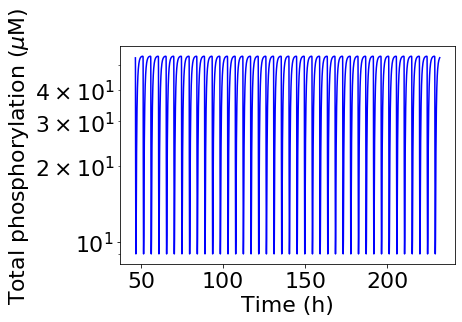

period = 16826.595652582473
nIP = 100
$k_{d\rho}$ $(\mu$M$)$ = 0.00526530612244898


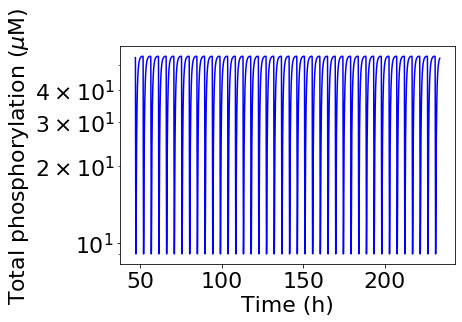

period = 16969.418161563575
nIP = 100
$k_{d\rho}$ $(\mu$M$)$ = 0.0054285714285714284


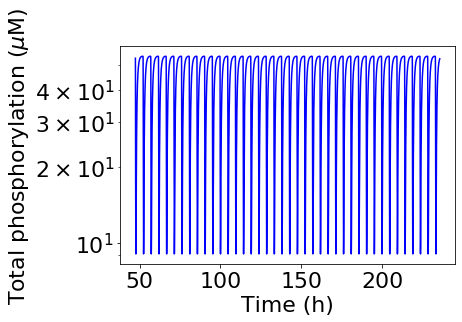

period = 17126.39518278232
nIP = 100
$k_{d\rho}$ $(\mu$M$)$ = 0.005591836734693878


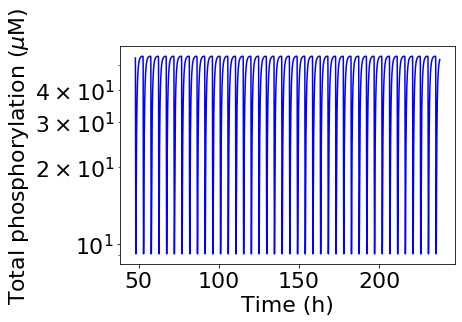

period = 17297.17485997884
nIP = 100
$k_{d\rho}$ $(\mu$M$)$ = 0.005755102040816327


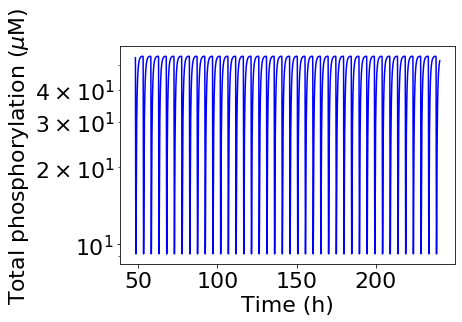

period = 17486.739293322316
nIP = 100
$k_{d\rho}$ $(\mu$M$)$ = 0.005918367346938775


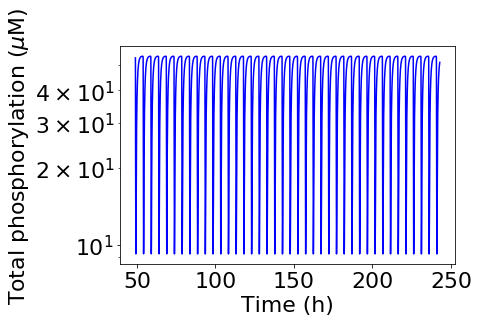

period = 17693.952272993745
nIP = 100
$k_{d\rho}$ $(\mu$M$)$ = 0.006081632653061225


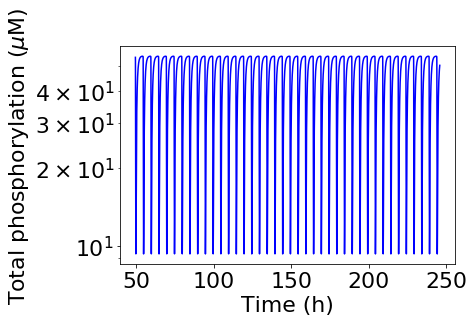

period = 17924.402689182898
nIP = 100
$k_{d\rho}$ $(\mu$M$)$ = 0.006244897959183674


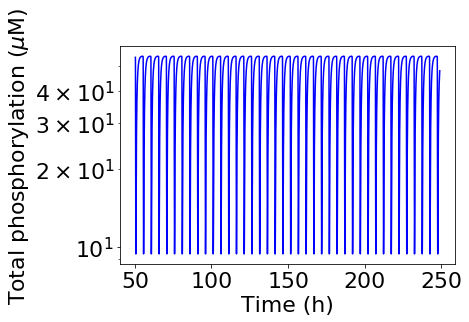

period = 18177.31687146169
nIP = 100
$k_{d\rho}$ $(\mu$M$)$ = 0.006408163265306122


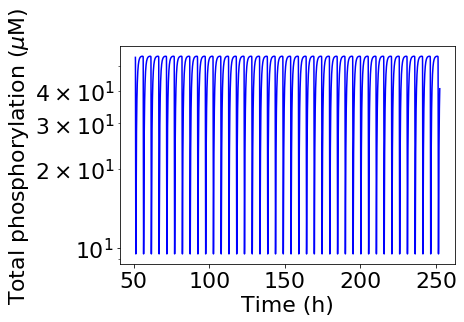

period = 18471.85054853931
nIP = 100
$k_{d\rho}$ $(\mu$M$)$ = 0.006571428571428572


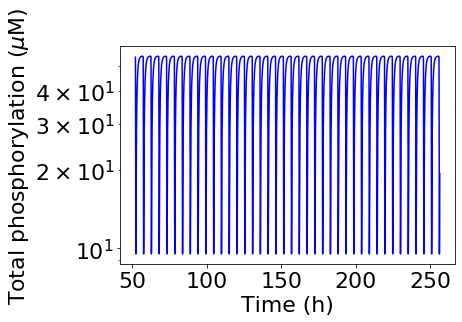

period = 18818.01599055773
nIP = 100
$k_{d\rho}$ $(\mu$M$)$ = 0.0067346938775510205


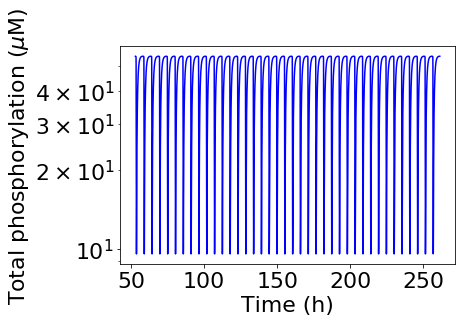

period = 19253.57800960052
nIP = 98
$k_{d\rho}$ $(\mu$M$)$ = 0.006897959183673469


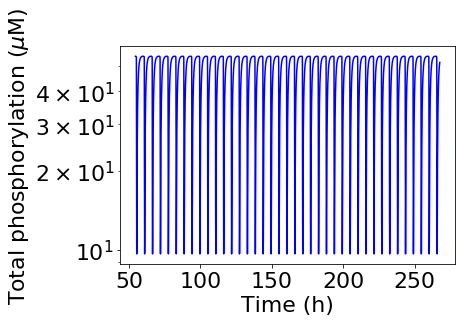

period = 19907.252491550753
nIP = 98
$k_{d\rho}$ $(\mu$M$)$ = 0.007061224489795919


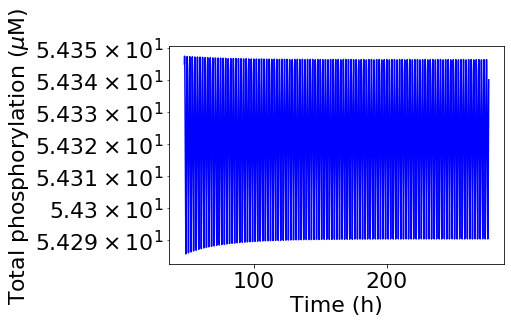

period = 6985.859597188653
nIP = 284
$k_{d\rho}$ $(\mu$M$)$ = 0.007224489795918367


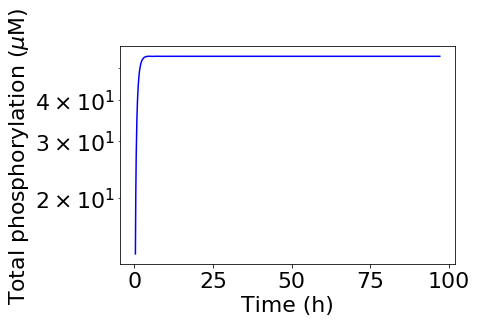

period = 0
nIP = 77
$k_{d\rho}$ $(\mu$M$)$ = 0.007387755102040816


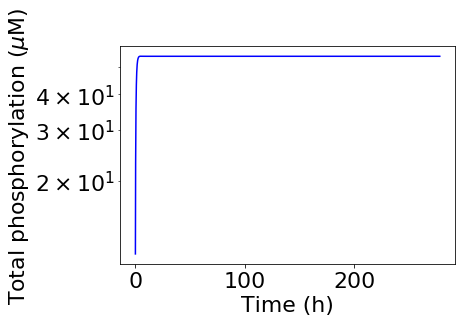

period = 0
nIP = 42
$k_{d\rho}$ $(\mu$M$)$ = 0.007551020408163266


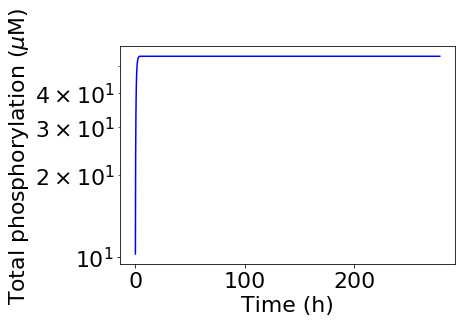

period = 0
nIP = 30
$k_{d\rho}$ $(\mu$M$)$ = 0.007714285714285714


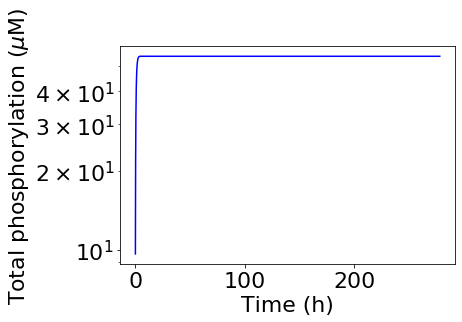

period = 0
nIP = 25
$k_{d\rho}$ $(\mu$M$)$ = 0.007877551020408163


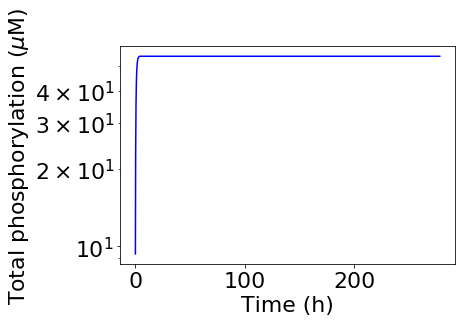

period = 0
nIP = 21
$k_{d\rho}$ $(\mu$M$)$ = 0.008040816326530613


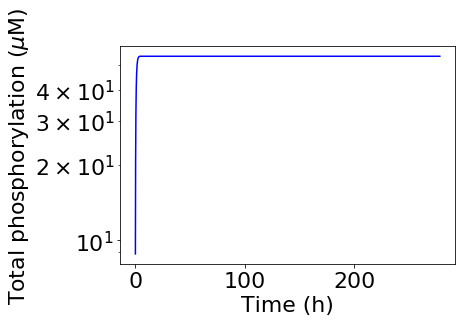

period = 0
nIP = 18
$k_{d\rho}$ $(\mu$M$)$ = 0.00820408163265306


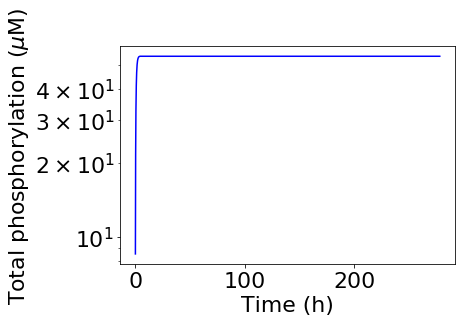

period = 0
nIP = 18
$k_{d\rho}$ $(\mu$M$)$ = 0.00836734693877551


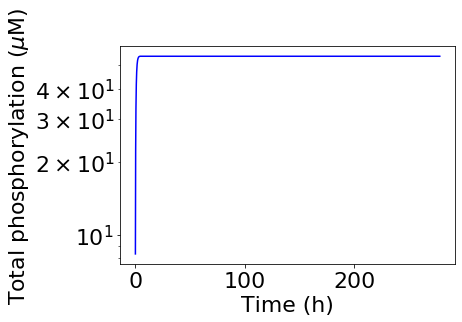

period = 0
nIP = 14
$k_{d\rho}$ $(\mu$M$)$ = 0.00853061224489796


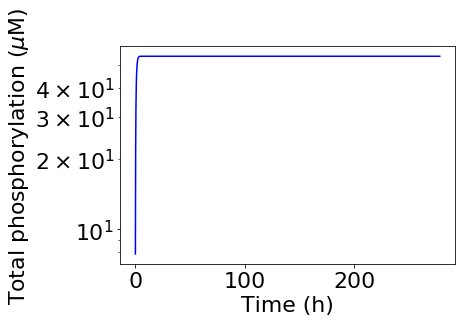

period = 0
nIP = 13
$k_{d\rho}$ $(\mu$M$)$ = 0.008693877551020409


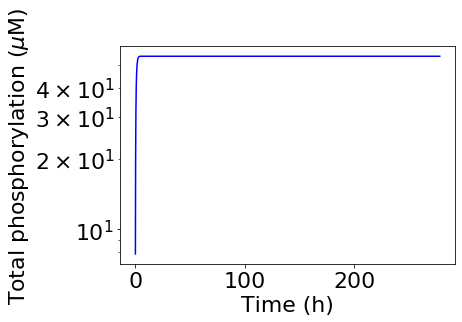

period = 0
nIP = 12
$k_{d\rho}$ $(\mu$M$)$ = 0.008857142857142857


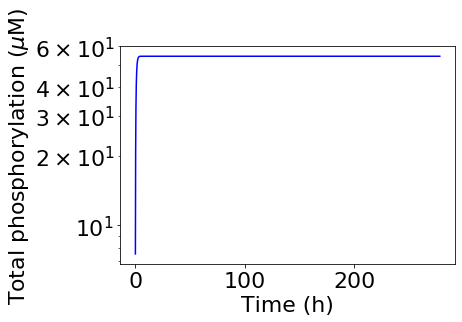

period = 0
nIP = 10
$k_{d\rho}$ $(\mu$M$)$ = 0.009020408163265306


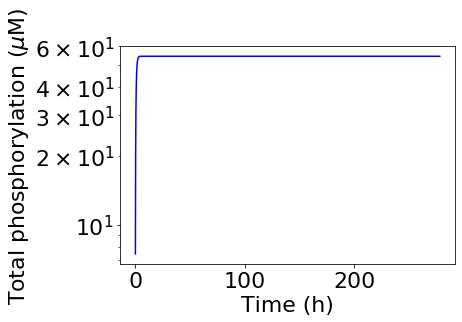

period = 0
nIP = 11
$k_{d\rho}$ $(\mu$M$)$ = 0.009183673469387754


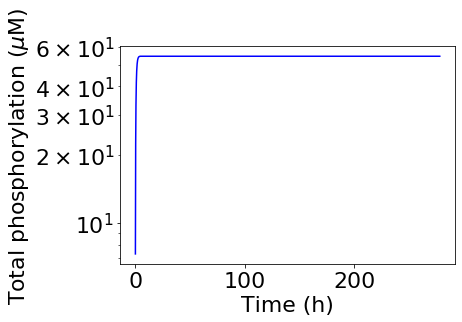

period = 0
nIP = 11
$k_{d\rho}$ $(\mu$M$)$ = 0.009346938775510204


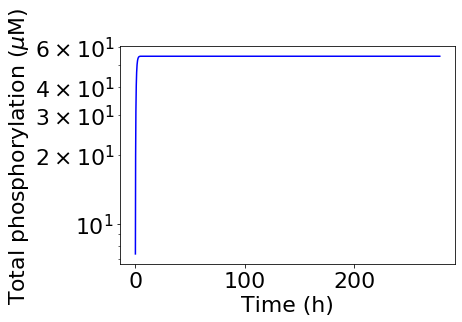

period = 0
nIP = 10
$k_{d\rho}$ $(\mu$M$)$ = 0.009510204081632653


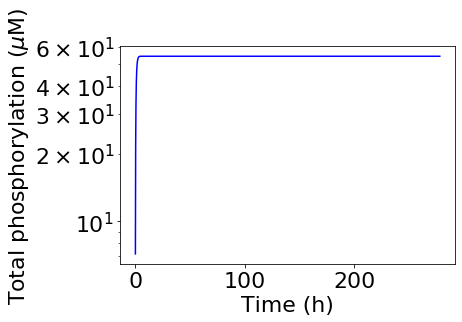

period = 0
nIP = 10
$k_{d\rho}$ $(\mu$M$)$ = 0.009673469387755103


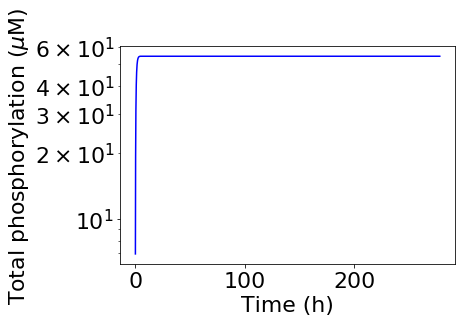

period = 0
nIP = 10
$k_{d\rho}$ $(\mu$M$)$ = 0.00983673469387755


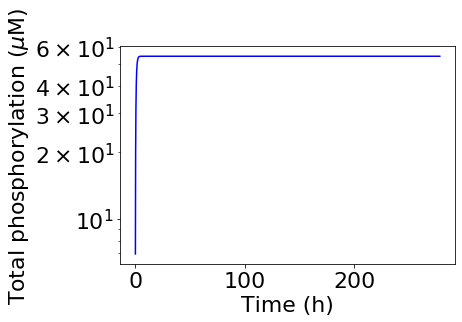

period = 0
nIP = 9
$k_{d\rho}$ $(\mu$M$)$ = 0.01


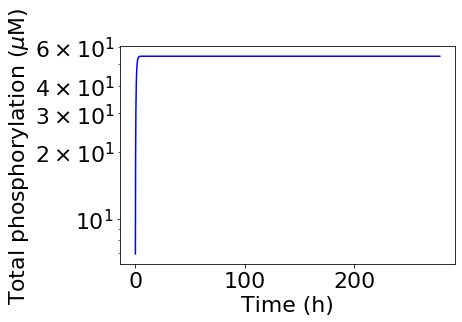

period = 0
nIP = 10


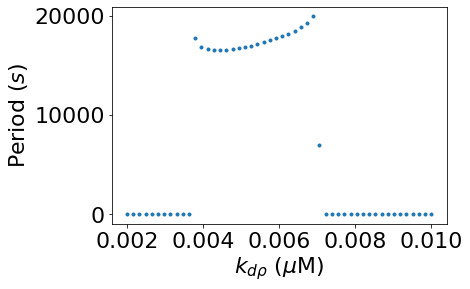

In [23]:
logscale = False
if logscale:
    kdps2 = np.logspace(-3, -2, num_points, base=10)
else:
    kdps2 = np.linspace(2e-3, 1e-2, num_points)
period_fxn_kdp2 = robustness2(1, kdps2, logscale)

$\kappa_{tot}$ $(\mu$M$)$ = 40.0


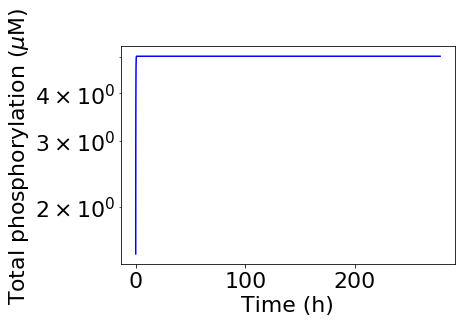

period = 0
nIP = 5
$\kappa_{tot}$ $(\mu$M$)$ = 40.816326530612244


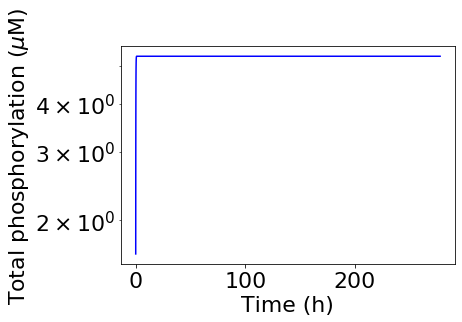

period = 0
nIP = 4
$\kappa_{tot}$ $(\mu$M$)$ = 41.63265306122449


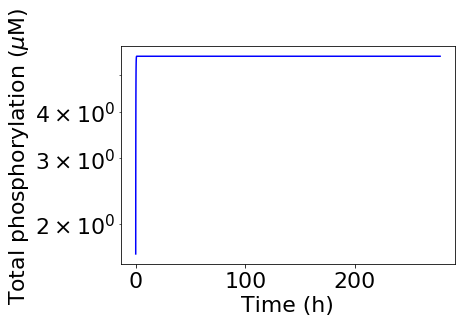

period = 0
nIP = 4
$\kappa_{tot}$ $(\mu$M$)$ = 42.44897959183673


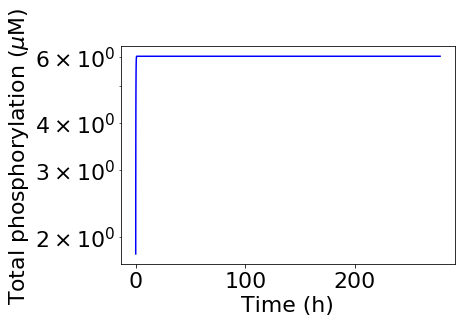

period = 0
nIP = 3
$\kappa_{tot}$ $(\mu$M$)$ = 43.265306122448976


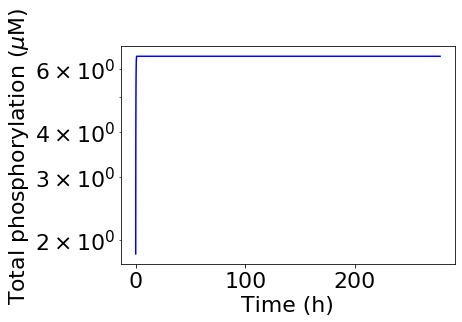

period = 0
nIP = 4
$\kappa_{tot}$ $(\mu$M$)$ = 44.08163265306123


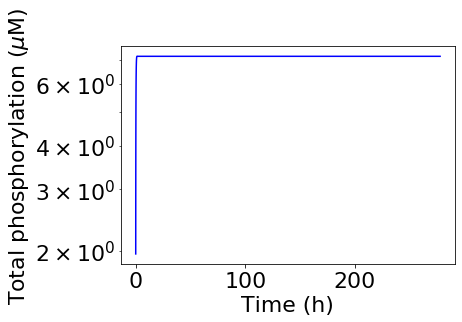

period = 0
nIP = 4
$\kappa_{tot}$ $(\mu$M$)$ = 44.89795918367347


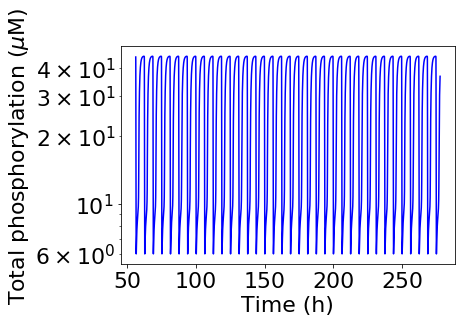

period = 22496.924851332675
nIP = 90
$\kappa_{tot}$ $(\mu$M$)$ = 45.714285714285715


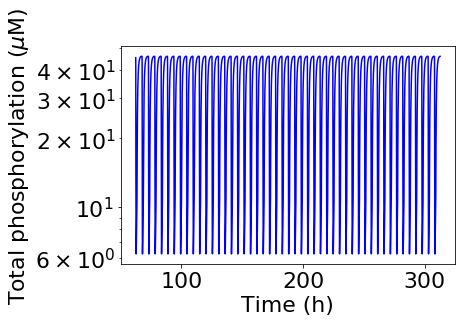

period = 18795.204334718874
nIP = 120
$\kappa_{tot}$ $(\mu$M$)$ = 46.53061224489796


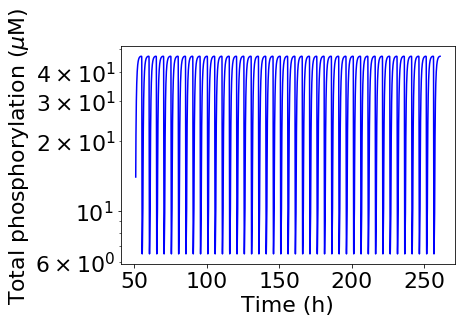

period = 18115.74649426504
nIP = 104
$\kappa_{tot}$ $(\mu$M$)$ = 47.3469387755102


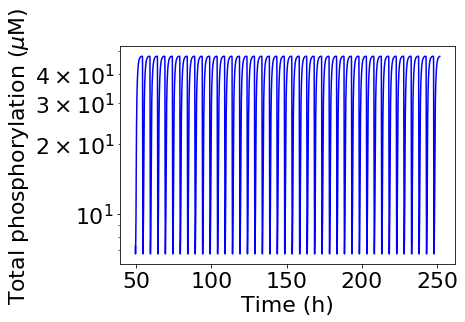

period = 17832.325496236095
nIP = 102
$\kappa_{tot}$ $(\mu$M$)$ = 48.16326530612245


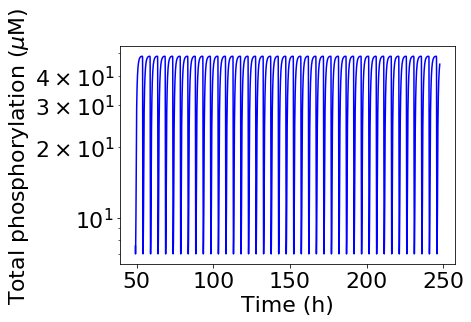

period = 17686.389068387216
nIP = 102
$\kappa_{tot}$ $(\mu$M$)$ = 48.9795918367347


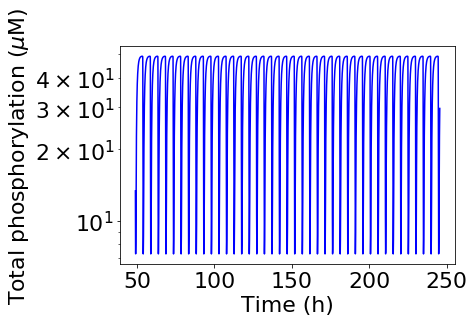

period = 17621.29268024699
nIP = 102
$\kappa_{tot}$ $(\mu$M$)$ = 49.79591836734694


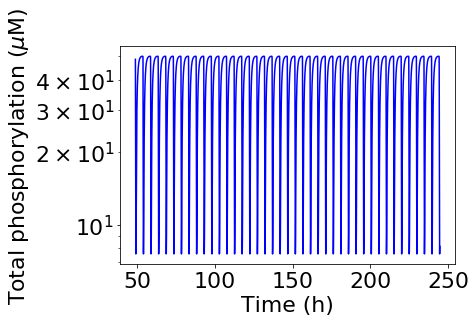

period = 17602.0959175271
nIP = 101
$\kappa_{tot}$ $(\mu$M$)$ = 50.61224489795919


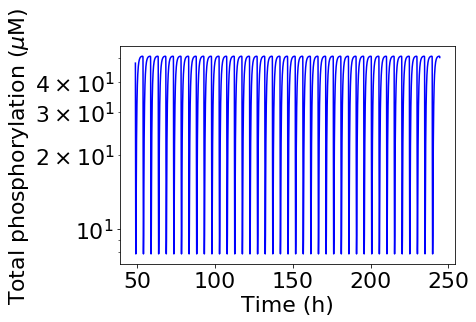

period = 17612.5159761369
nIP = 100
$\kappa_{tot}$ $(\mu$M$)$ = 51.42857142857143


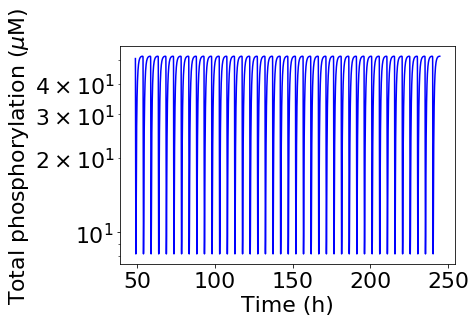

period = 17640.621388236876
nIP = 100
$\kappa_{tot}$ $(\mu$M$)$ = 52.244897959183675


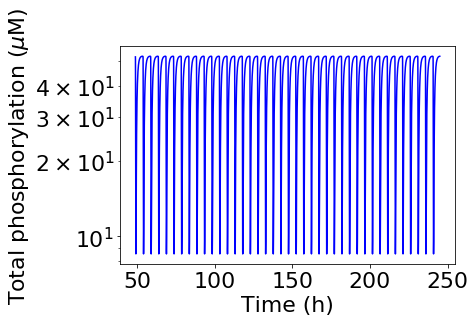

period = 17695.94056870183
nIP = 100
$\kappa_{tot}$ $(\mu$M$)$ = 53.06122448979592


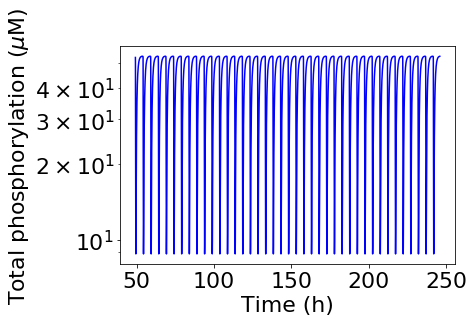

period = 17756.463719152613
nIP = 100
$\kappa_{tot}$ $(\mu$M$)$ = 53.87755102040816


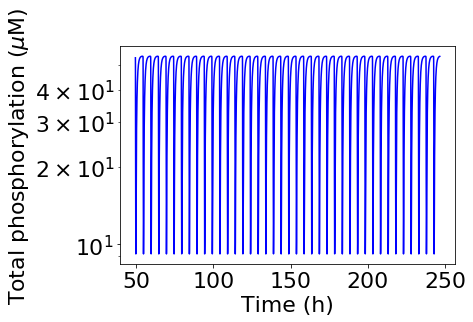

period = 17837.514044999727
nIP = 100
$\kappa_{tot}$ $(\mu$M$)$ = 54.69387755102041


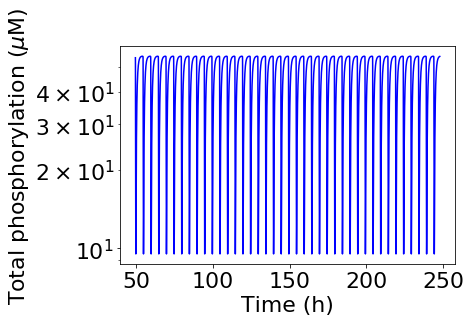

period = 17927.09592202748
nIP = 100
$\kappa_{tot}$ $(\mu$M$)$ = 55.51020408163265


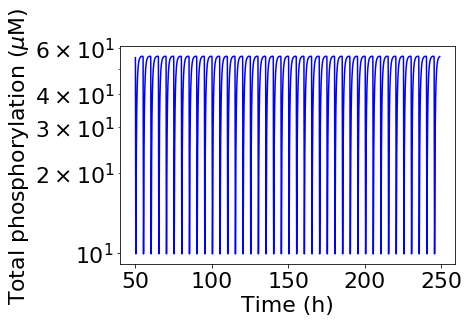

period = 18029.788685417967
nIP = 100
$\kappa_{tot}$ $(\mu$M$)$ = 56.326530612244895


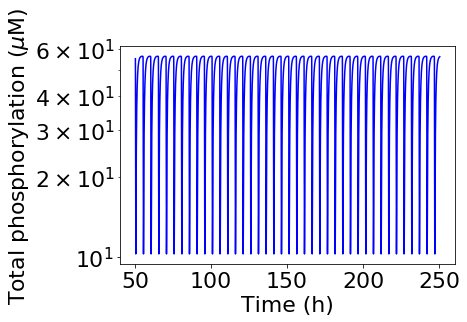

period = 18144.321751762298
nIP = 100
$\kappa_{tot}$ $(\mu$M$)$ = 57.14285714285714


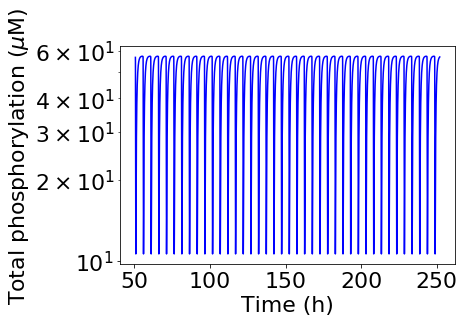

period = 18274.696694153477
nIP = 100
$\kappa_{tot}$ $(\mu$M$)$ = 57.95918367346939


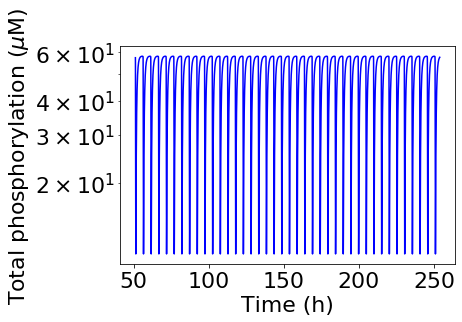

period = 18422.070495282533
nIP = 100
$\kappa_{tot}$ $(\mu$M$)$ = 58.775510204081634


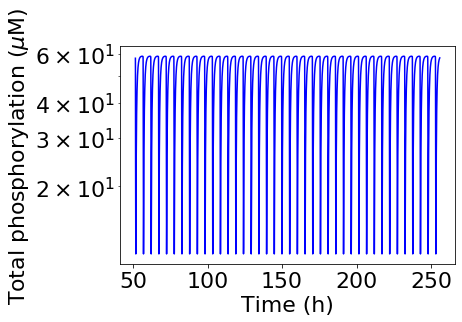

period = 18590.719590553083
nIP = 100
$\kappa_{tot}$ $(\mu$M$)$ = 59.59183673469388


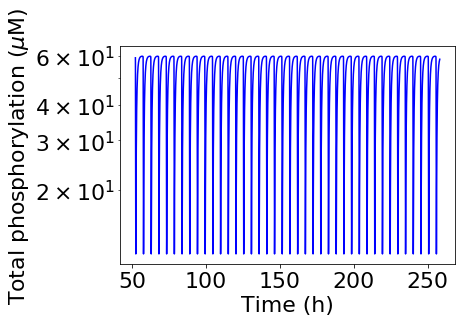

period = 18782.873934779782
nIP = 100
$\kappa_{tot}$ $(\mu$M$)$ = 60.40816326530612


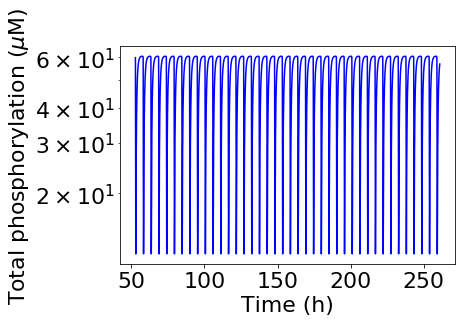

period = 19023.49424235965
nIP = 100
$\kappa_{tot}$ $(\mu$M$)$ = 61.224489795918366


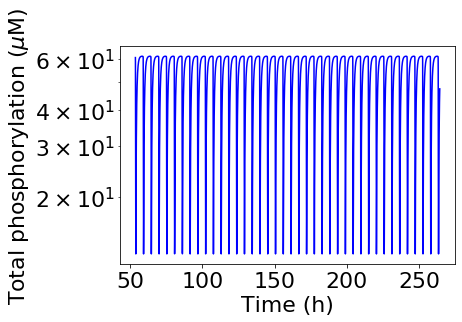

period = 19334.169182696845
nIP = 100
$\kappa_{tot}$ $(\mu$M$)$ = 62.04081632653062


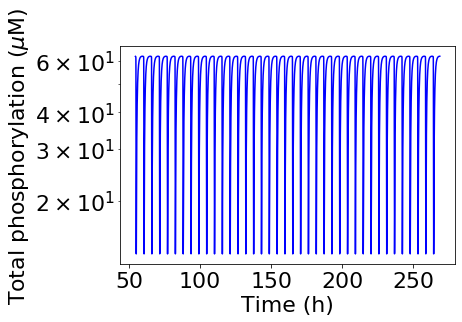

period = 19804.977321771206
nIP = 98
$\kappa_{tot}$ $(\mu$M$)$ = 62.85714285714286


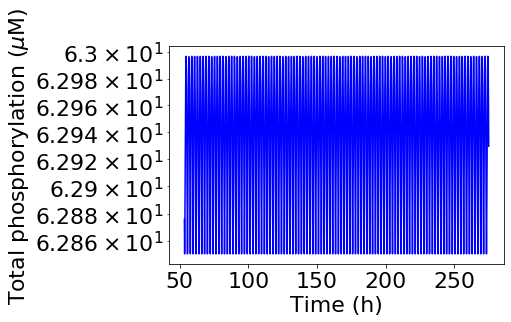

period = 7519.438010587008
nIP = 262
$\kappa_{tot}$ $(\mu$M$)$ = 63.673469387755105


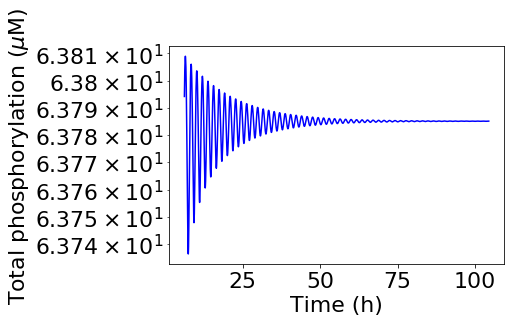

period = 0
nIP = 114
$\kappa_{tot}$ $(\mu$M$)$ = 64.48979591836735


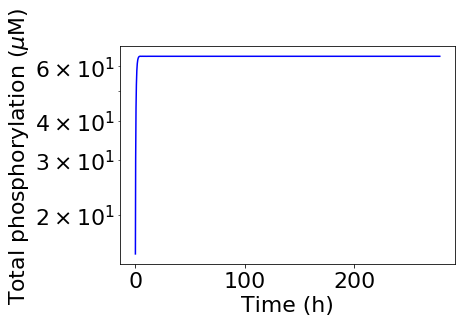

period = 0
nIP = 75
$\kappa_{tot}$ $(\mu$M$)$ = 65.3061224489796


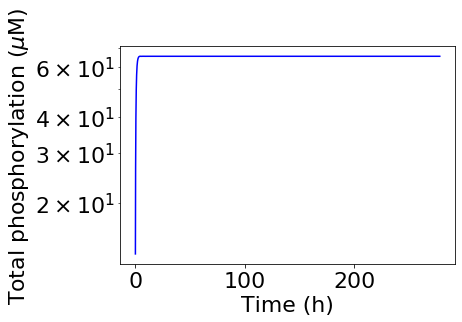

period = 0
nIP = 50
$\kappa_{tot}$ $(\mu$M$)$ = 66.12244897959184


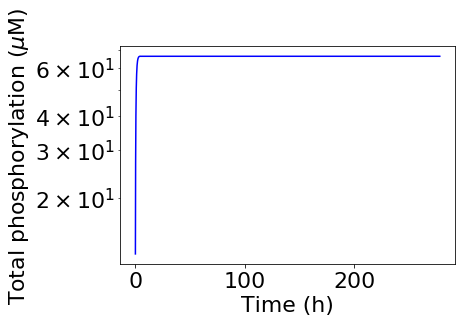

period = 0
nIP = 39
$\kappa_{tot}$ $(\mu$M$)$ = 66.93877551020408


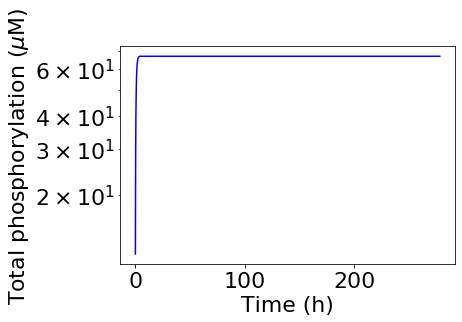

period = 0
nIP = 32
$\kappa_{tot}$ $(\mu$M$)$ = 67.75510204081633


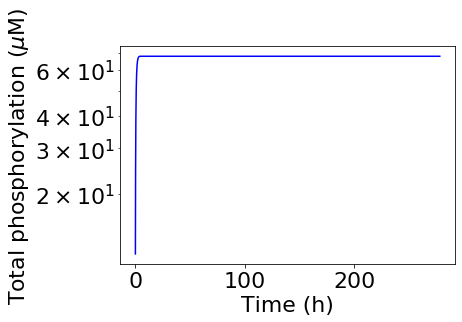

period = 0
nIP = 27
$\kappa_{tot}$ $(\mu$M$)$ = 68.57142857142857


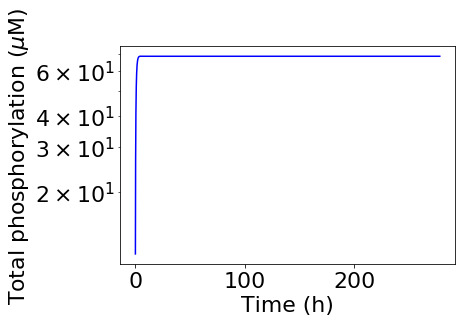

period = 0
nIP = 24
$\kappa_{tot}$ $(\mu$M$)$ = 69.38775510204081


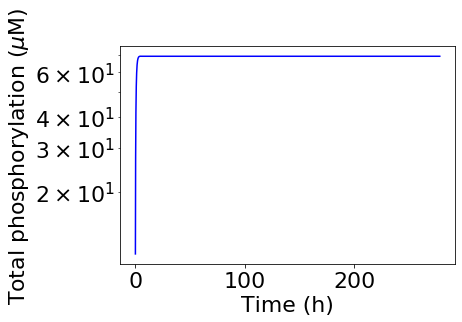

period = 0
nIP = 22
$\kappa_{tot}$ $(\mu$M$)$ = 70.20408163265306


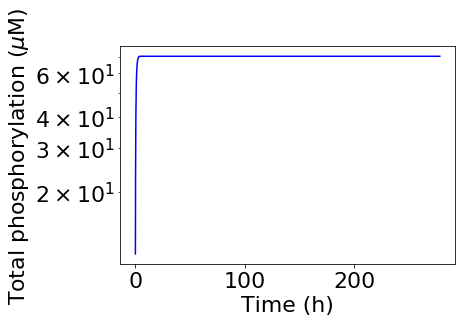

period = 0
nIP = 19
$\kappa_{tot}$ $(\mu$M$)$ = 71.0204081632653


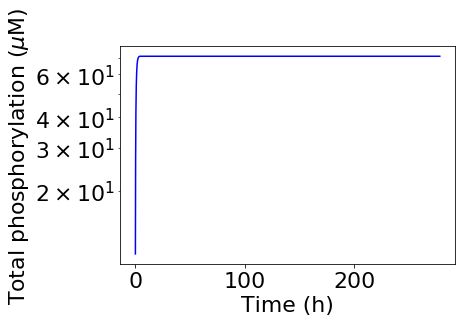

period = 0
nIP = 17
$\kappa_{tot}$ $(\mu$M$)$ = 71.83673469387756


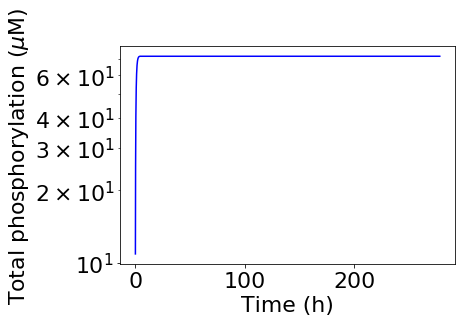

period = 0
nIP = 16
$\kappa_{tot}$ $(\mu$M$)$ = 72.65306122448979


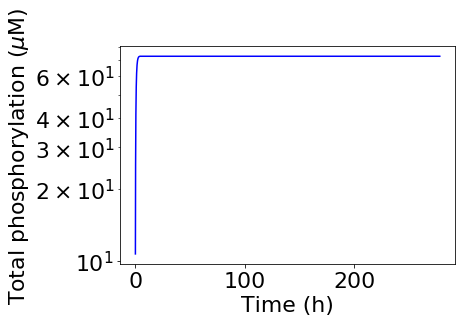

period = 0
nIP = 16
$\kappa_{tot}$ $(\mu$M$)$ = 73.46938775510205


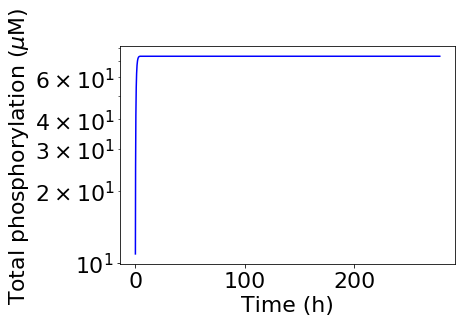

period = 0
nIP = 14
$\kappa_{tot}$ $(\mu$M$)$ = 74.28571428571428


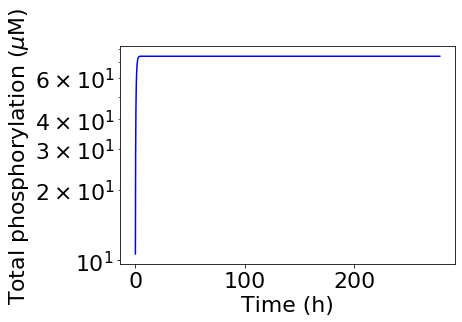

period = 0
nIP = 13
$\kappa_{tot}$ $(\mu$M$)$ = 75.10204081632654


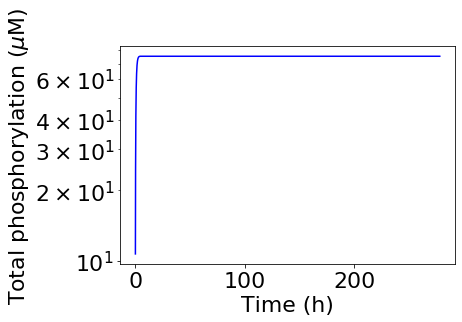

period = 0
nIP = 15
$\kappa_{tot}$ $(\mu$M$)$ = 75.91836734693878


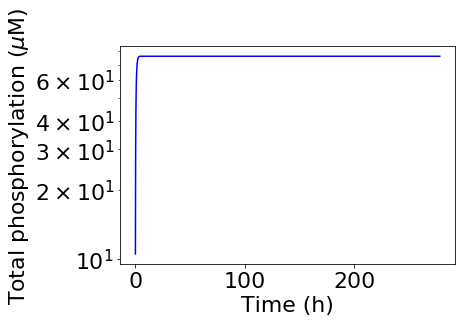

period = 0
nIP = 13
$\kappa_{tot}$ $(\mu$M$)$ = 76.73469387755102


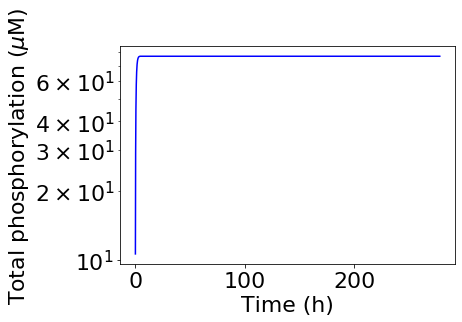

period = 0
nIP = 11
$\kappa_{tot}$ $(\mu$M$)$ = 77.55102040816327


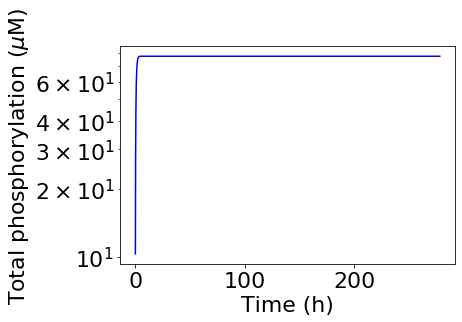

period = 0
nIP = 11
$\kappa_{tot}$ $(\mu$M$)$ = 78.36734693877551


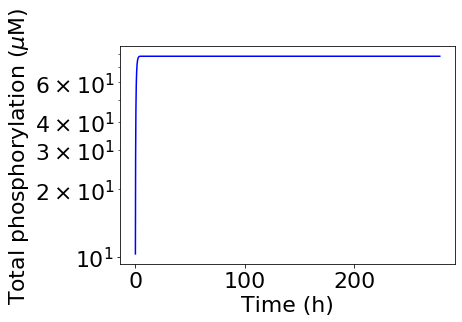

period = 0
nIP = 11
$\kappa_{tot}$ $(\mu$M$)$ = 79.18367346938776


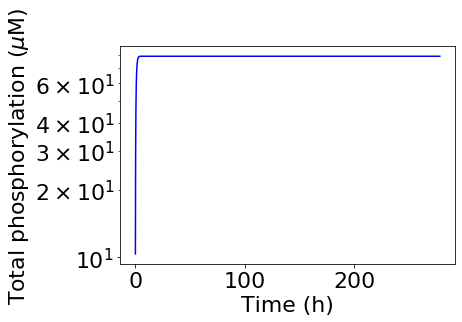

period = 0
nIP = 11
$\kappa_{tot}$ $(\mu$M$)$ = 80.0


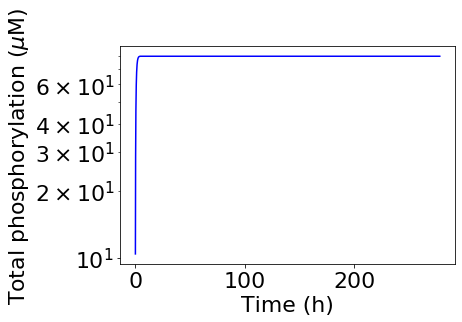

period = 0
nIP = 9


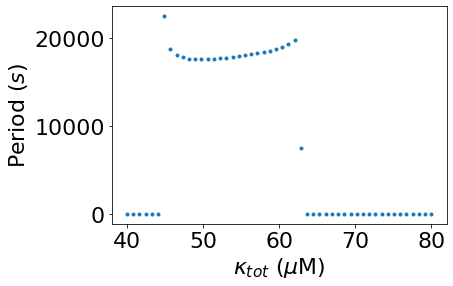

In [24]:
logscale = False
if logscale:
    ktots2 = np.logspace(1, 2, num_points, base=10)
else:
    ktots2 = np.linspace(40, 80, num_points)
period_fxn_ktot2 = robustness2(6, ktots2, logscale)

$\rho_{tot}$ $(\mu$M$)$ = 0.4


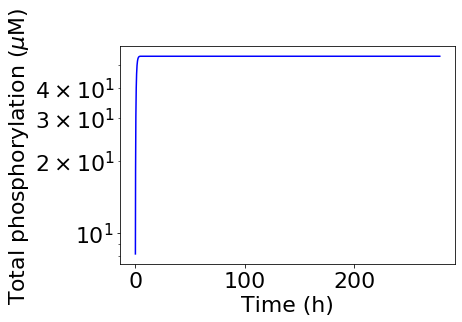

period = 0
nIP = 13
$\rho_{tot}$ $(\mu$M$)$ = 0.40408163265306124


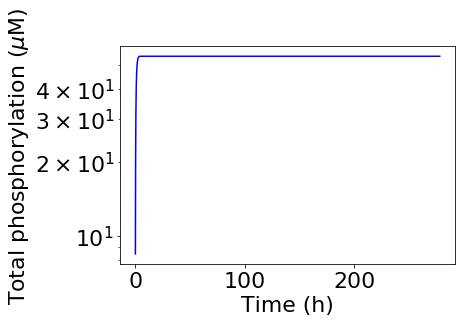

period = 0
nIP = 14
$\rho_{tot}$ $(\mu$M$)$ = 0.40816326530612246


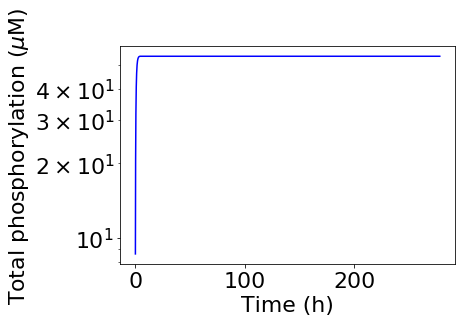

period = 0
nIP = 16
$\rho_{tot}$ $(\mu$M$)$ = 0.4122448979591837


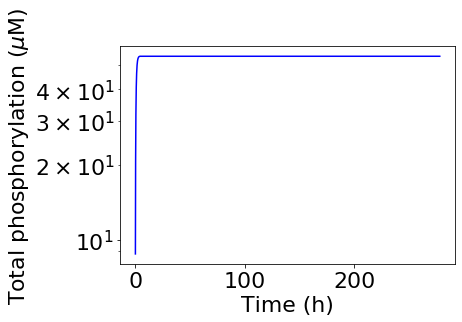

period = 0
nIP = 14
$\rho_{tot}$ $(\mu$M$)$ = 0.4163265306122449


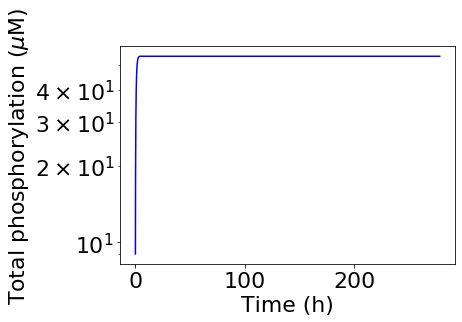

period = 0
nIP = 19
$\rho_{tot}$ $(\mu$M$)$ = 0.42040816326530617


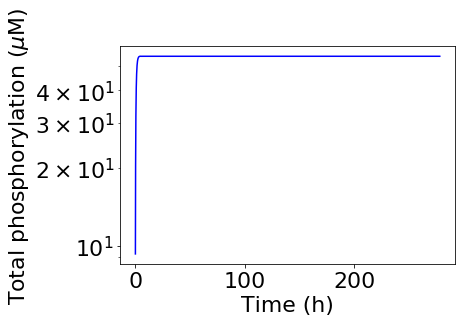

period = 0
nIP = 21
$\rho_{tot}$ $(\mu$M$)$ = 0.4244897959183674


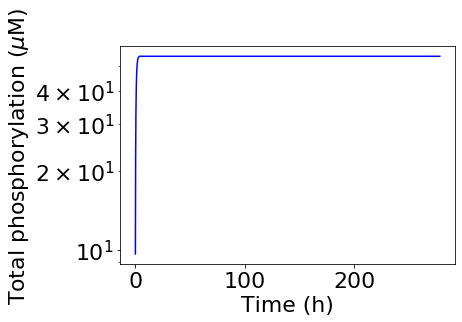

period = 0
nIP = 25
$\rho_{tot}$ $(\mu$M$)$ = 0.4285714285714286


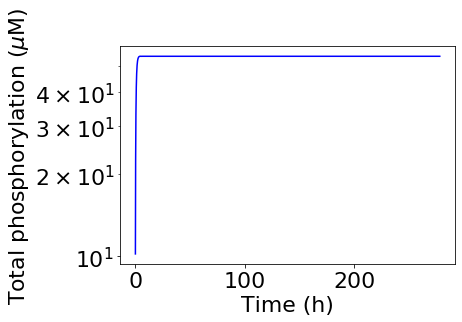

period = 0
nIP = 32
$\rho_{tot}$ $(\mu$M$)$ = 0.4326530612244898


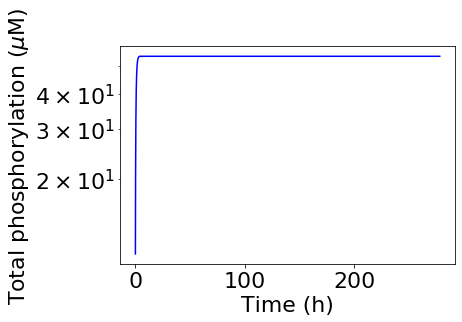

period = 0
nIP = 42
$\rho_{tot}$ $(\mu$M$)$ = 0.43673469387755104


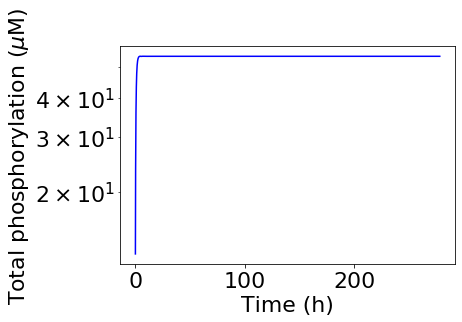

period = 0
nIP = 66
$\rho_{tot}$ $(\mu$M$)$ = 0.44081632653061226


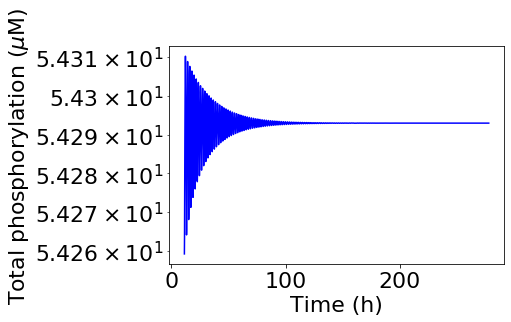

period = 0
nIP = 252
$\rho_{tot}$ $(\mu$M$)$ = 0.4448979591836735


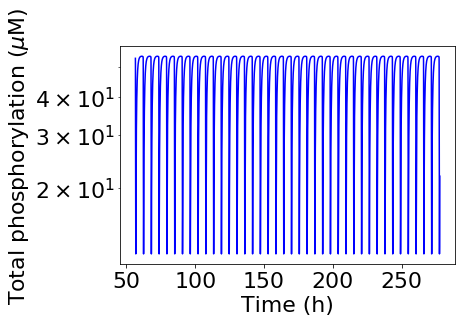

period = 20380.923459963873
nIP = 100
$\rho_{tot}$ $(\mu$M$)$ = 0.4489795918367347


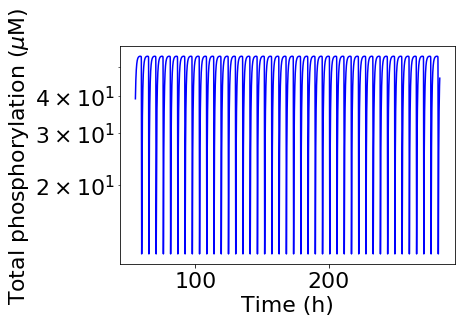

period = 19509.263807148905
nIP = 106
$\rho_{tot}$ $(\mu$M$)$ = 0.4530612244897959


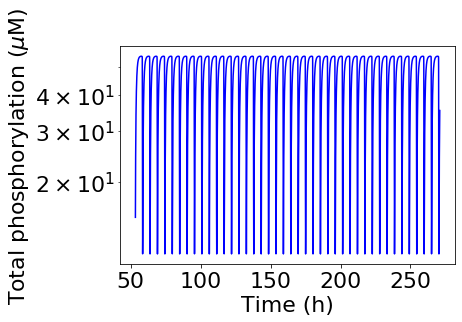

period = 19072.97530942806
nIP = 104
$\rho_{tot}$ $(\mu$M$)$ = 0.4571428571428572


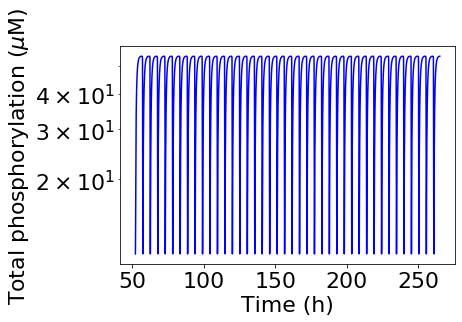

period = 18758.062156736618
nIP = 102
$\rho_{tot}$ $(\mu$M$)$ = 0.4612244897959184


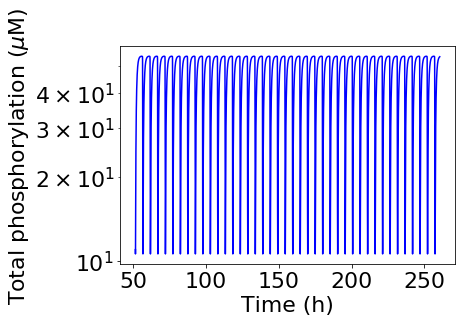

period = 18511.048502040678
nIP = 102
$\rho_{tot}$ $(\mu$M$)$ = 0.4653061224489796


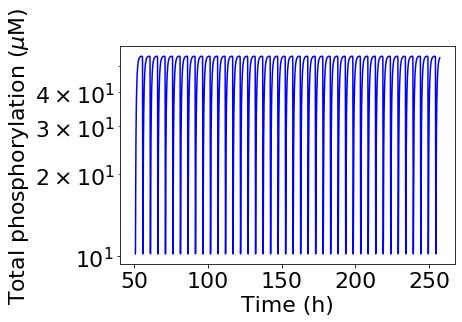

period = 18304.213857542258
nIP = 102
$\rho_{tot}$ $(\mu$M$)$ = 0.46938775510204084


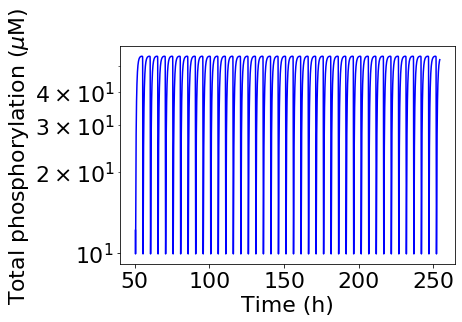

period = 18131.8722074501
nIP = 102
$\rho_{tot}$ $(\mu$M$)$ = 0.47346938775510206


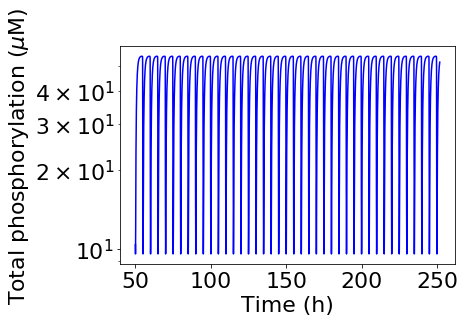

period = 17983.48456322914
nIP = 102
$\rho_{tot}$ $(\mu$M$)$ = 0.4775510204081633


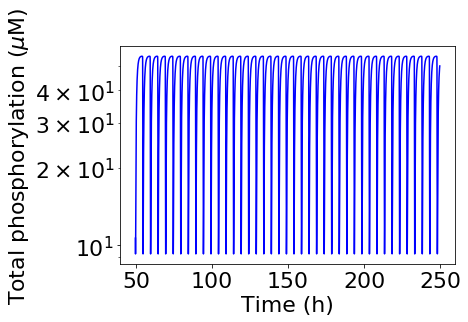

period = 17859.627328946488
nIP = 102
$\rho_{tot}$ $(\mu$M$)$ = 0.4816326530612245


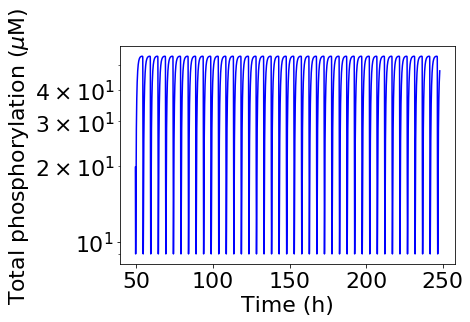

period = 17750.646417118027
nIP = 102
$\rho_{tot}$ $(\mu$M$)$ = 0.4857142857142857


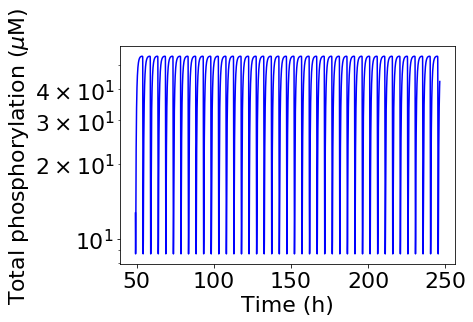

period = 17664.55679433723
nIP = 102
$\rho_{tot}$ $(\mu$M$)$ = 0.4897959183673469


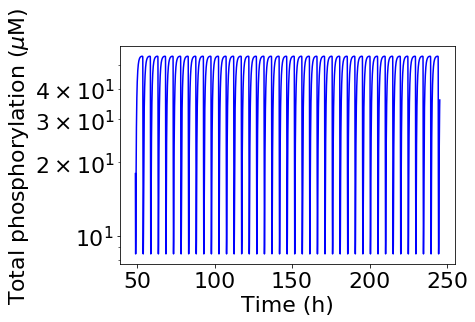

period = 17596.752269953024
nIP = 102
$\rho_{tot}$ $(\mu$M$)$ = 0.4938775510204082


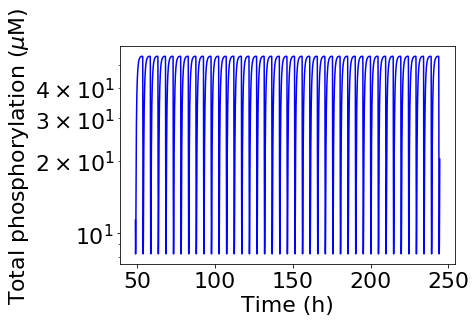

period = 17558.108080511447
nIP = 102
$\rho_{tot}$ $(\mu$M$)$ = 0.49795918367346936


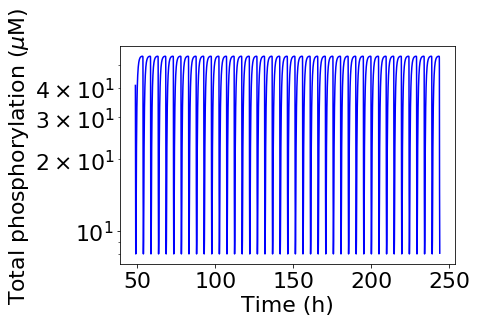

period = 17547.435779365827
nIP = 101
$\rho_{tot}$ $(\mu$M$)$ = 0.5020408163265306


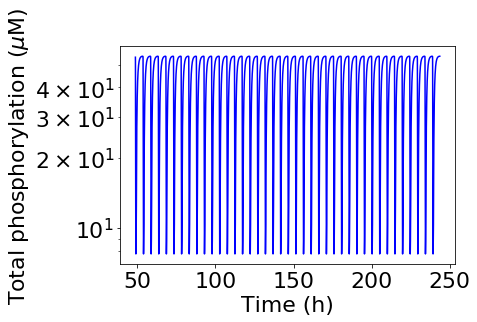

period = 17577.829810100025
nIP = 100
$\rho_{tot}$ $(\mu$M$)$ = 0.5061224489795918


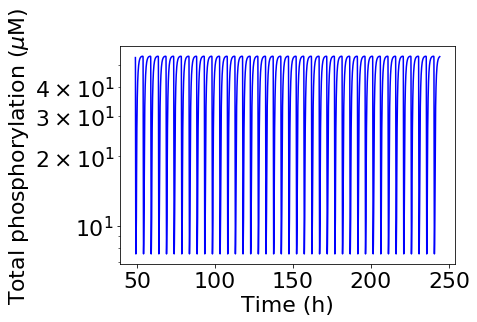

period = 17668.275768135325
nIP = 100
$\rho_{tot}$ $(\mu$M$)$ = 0.5102040816326531


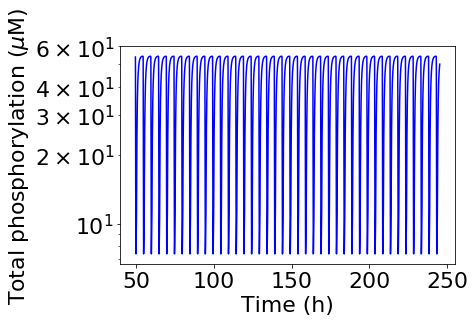

period = 17874.322809205973
nIP = 100
$\rho_{tot}$ $(\mu$M$)$ = 0.5142857142857142


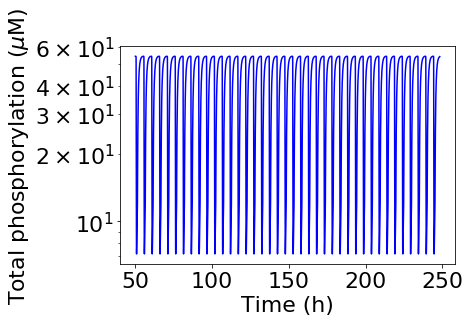

period = 18331.209365859628
nIP = 98
$\rho_{tot}$ $(\mu$M$)$ = 0.5183673469387755


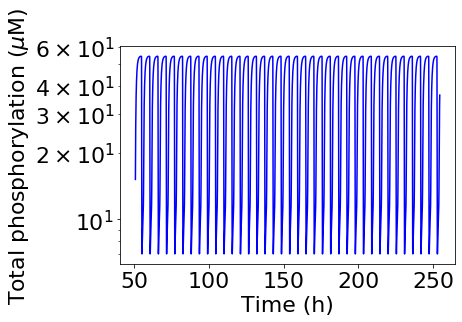

period = 19792.94912706304
nIP = 94
$\rho_{tot}$ $(\mu$M$)$ = 0.5224489795918368


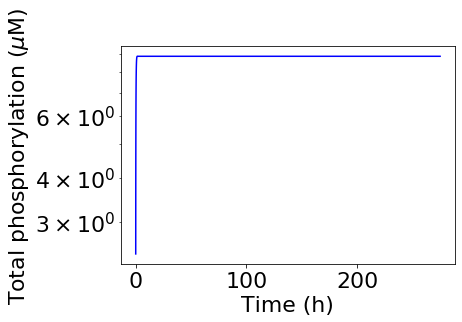

period = 0
nIP = 4
$\rho_{tot}$ $(\mu$M$)$ = 0.5265306122448979


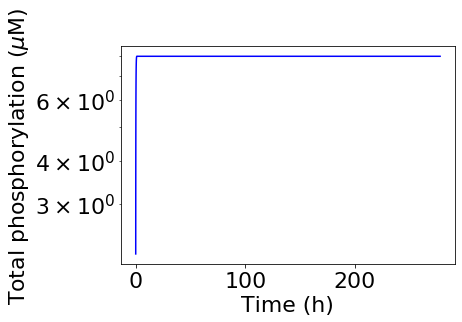

period = 0
nIP = 5
$\rho_{tot}$ $(\mu$M$)$ = 0.5306122448979592


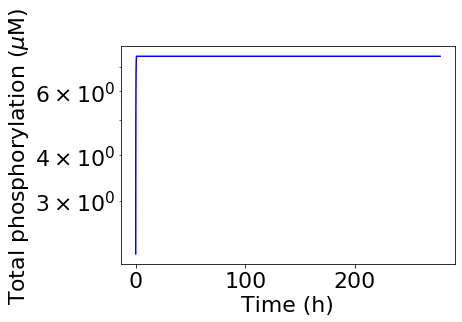

period = 0
nIP = 4
$\rho_{tot}$ $(\mu$M$)$ = 0.5346938775510204


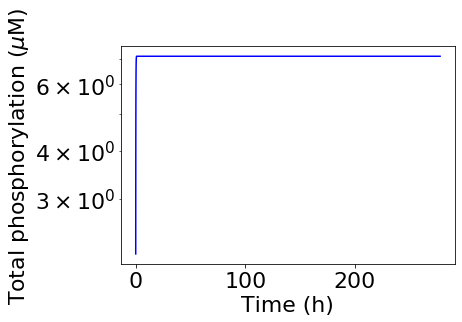

period = 0
nIP = 5
$\rho_{tot}$ $(\mu$M$)$ = 0.5387755102040817


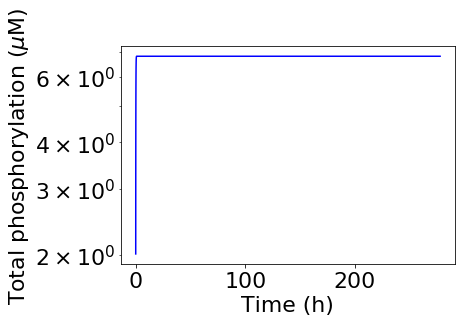

period = 0
nIP = 4
$\rho_{tot}$ $(\mu$M$)$ = 0.5428571428571429


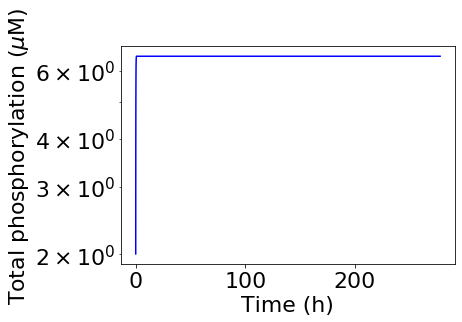

period = 0
nIP = 3
$\rho_{tot}$ $(\mu$M$)$ = 0.5469387755102041


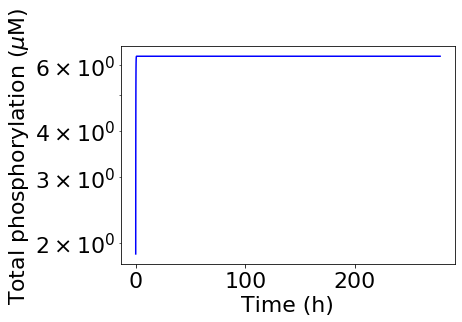

period = 0
nIP = 3
$\rho_{tot}$ $(\mu$M$)$ = 0.5510204081632653


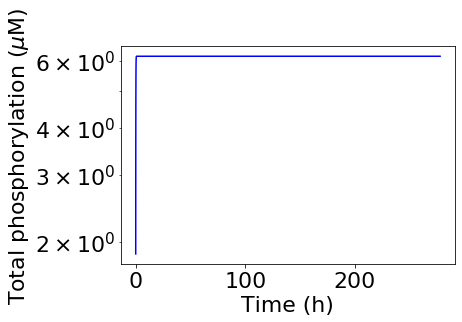

period = 0
nIP = 5
$\rho_{tot}$ $(\mu$M$)$ = 0.5551020408163265


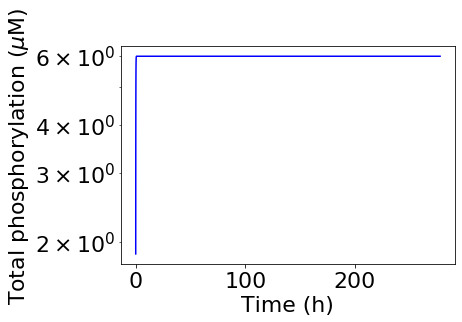

period = 0
nIP = 3
$\rho_{tot}$ $(\mu$M$)$ = 0.5591836734693878


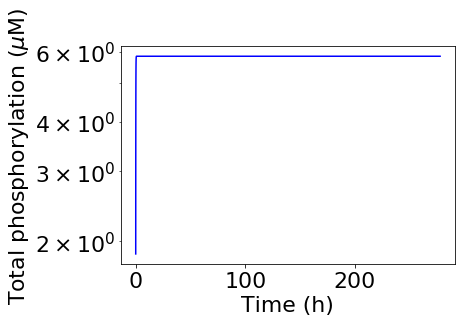

period = 0
nIP = 4
$\rho_{tot}$ $(\mu$M$)$ = 0.563265306122449


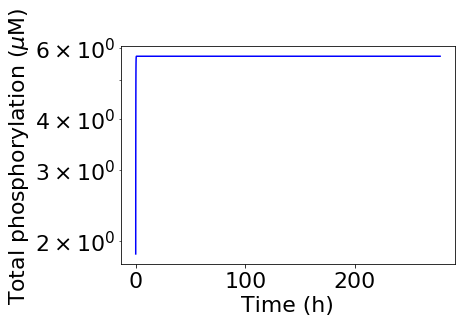

period = 0
nIP = 4
$\rho_{tot}$ $(\mu$M$)$ = 0.5673469387755102


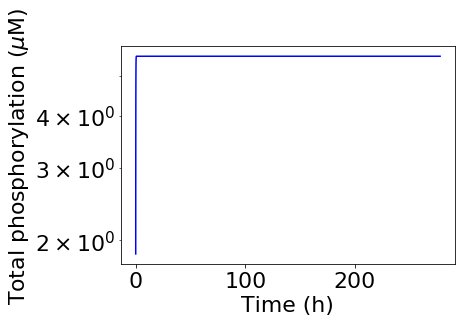

period = 0
nIP = 4
$\rho_{tot}$ $(\mu$M$)$ = 0.5714285714285714


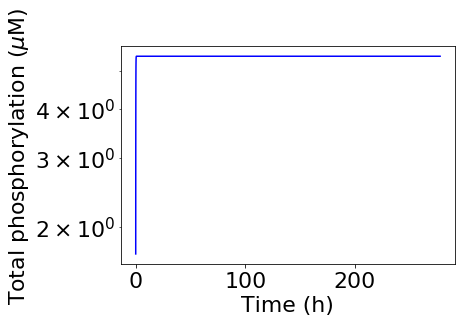

period = 0
nIP = 4
$\rho_{tot}$ $(\mu$M$)$ = 0.5755102040816327


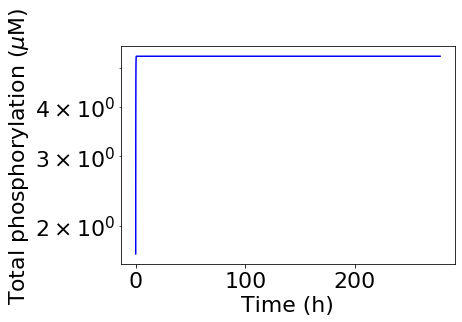

period = 0
nIP = 3
$\rho_{tot}$ $(\mu$M$)$ = 0.5795918367346939


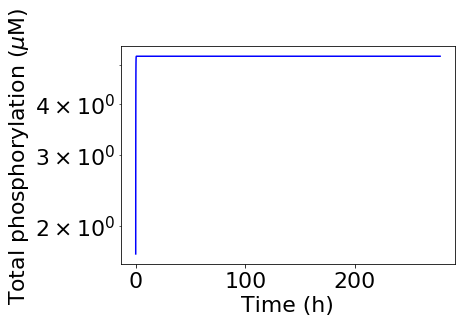

period = 0
nIP = 3
$\rho_{tot}$ $(\mu$M$)$ = 0.5836734693877551


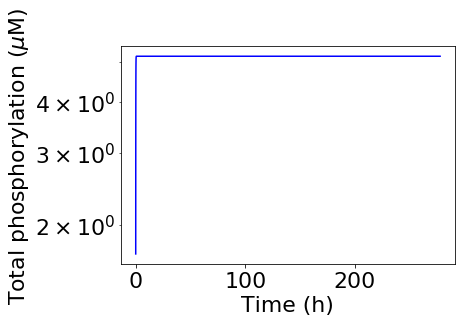

period = 0
nIP = 3
$\rho_{tot}$ $(\mu$M$)$ = 0.5877551020408163


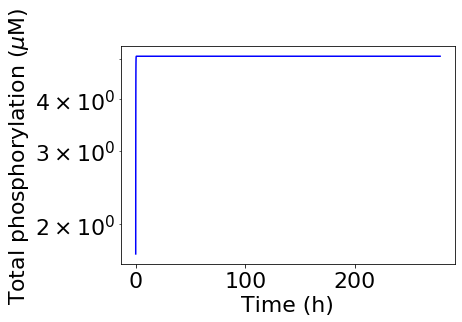

period = 0
nIP = 3
$\rho_{tot}$ $(\mu$M$)$ = 0.5918367346938775


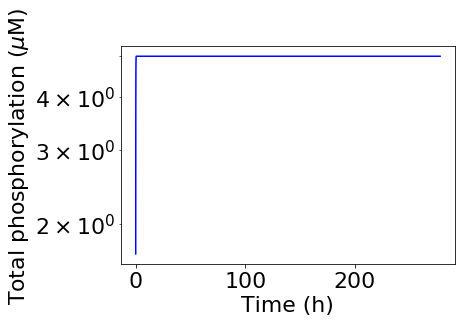

period = 0
nIP = 3
$\rho_{tot}$ $(\mu$M$)$ = 0.5959183673469388


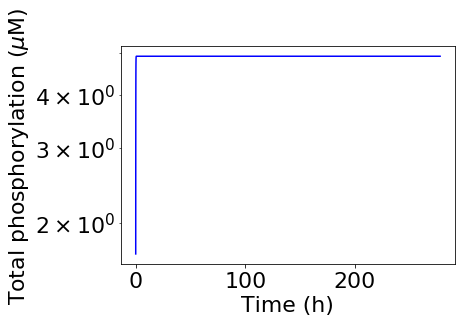

period = 0
nIP = 3
$\rho_{tot}$ $(\mu$M$)$ = 0.6


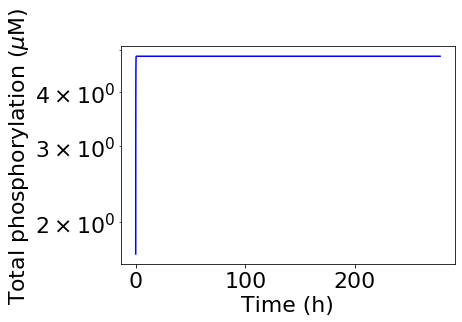

period = 0
nIP = 2


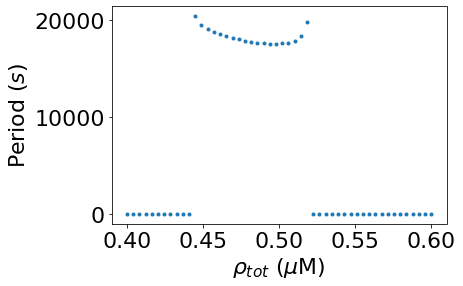

In [25]:
logscale = False
if logscale:
    ptots2 = np.logspace(-2, 0, num_points, base=10)
else:
    ptots2 = np.linspace(0.4, 0.6, num_points)
period_fxn_ptot2 = robustness2(7, ptots2, logscale)

$\tilde{P}$ $(\mu$M$)$ = 1e-12


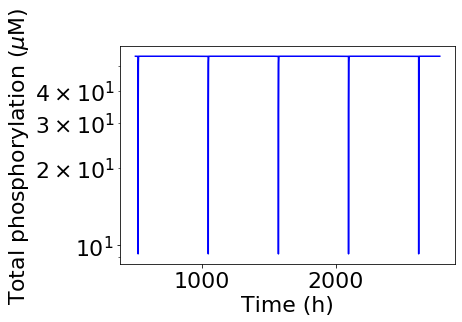

period = 0
nIP = 108
$\tilde{P}$ $(\mu$M$)$ = 1.5998587196060573e-12


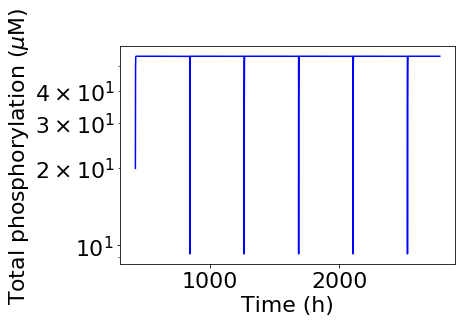

period = 0
nIP = 42
$\tilde{P}$ $(\mu$M$)$ = 2.559547922699533e-12


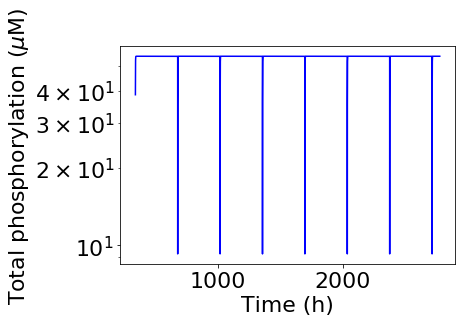

period = 0
nIP = 24
$\tilde{P}$ $(\mu$M$)$ = 4.094915062380419e-12


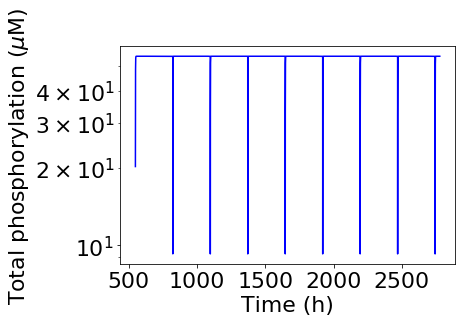

period = 987693.0286285421
nIP = 22
$\tilde{P}$ $(\mu$M$)$ = 6.551285568595496e-12


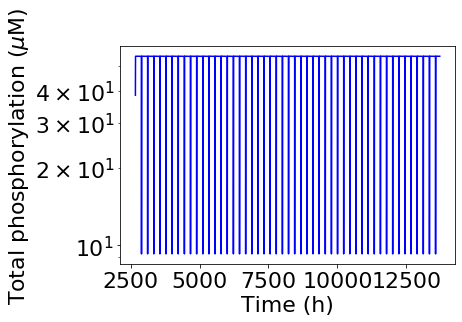

period = 800587.7840768769
nIP = 124
$\tilde{P}$ $(\mu$M$)$ = 1.0481131341546874e-11


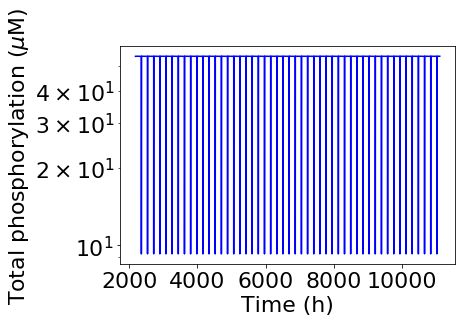

period = 651162.228814505
nIP = 124
$\tilde{P}$ $(\mu$M$)$ = 1.67683293681101e-11


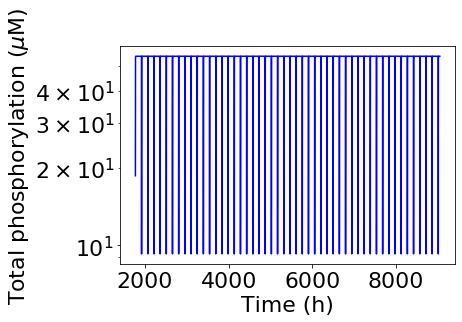

period = 531637.6068055592
nIP = 124
$\tilde{P}$ $(\mu$M$)$ = 2.6826957952797272e-11


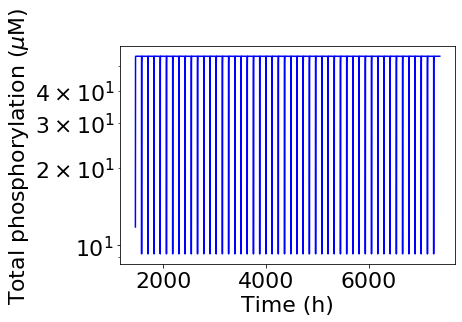

period = 435880.50417278707
nIP = 122
$\tilde{P}$ $(\mu$M$)$ = 4.2919342601287785e-11


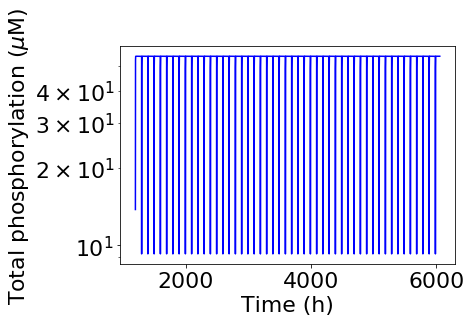

period = 359053.91025257856
nIP = 122
$\tilde{P}$ $(\mu$M$)$ = 6.866488450042999e-11


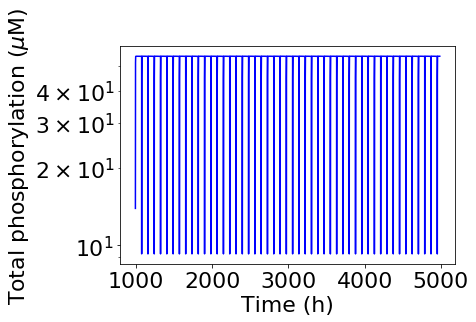

period = 297247.92109945044
nIP = 122
$\tilde{P}$ $(\mu$M$)$ = 1.0985411419875573e-10


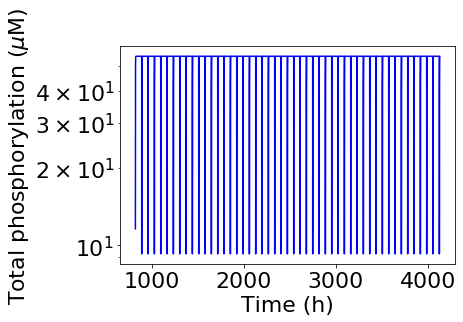

period = 247436.26568187587
nIP = 122
$\tilde{P}$ $(\mu$M$)$ = 1.7575106248547966e-10


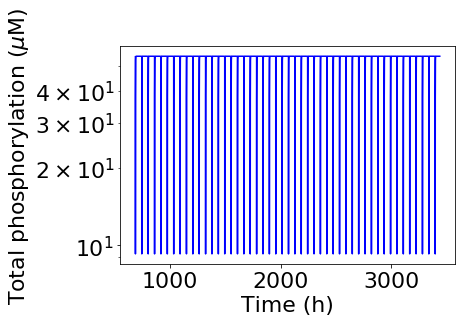

period = 207182.44464387186
nIP = 120
$\tilde{P}$ $(\mu$M$)$ = 2.8117686979742364e-10


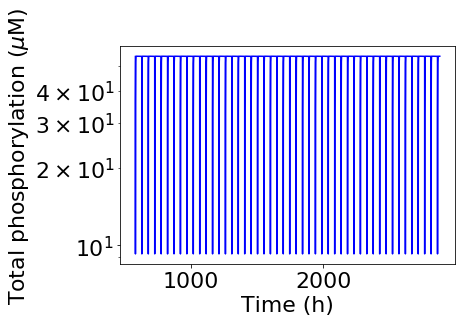

period = 174536.2692045141
nIP = 120
$\tilde{P}$ $(\mu$M$)$ = 4.498432668969453e-10


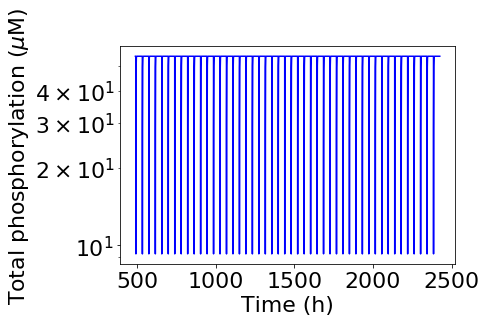

period = 147996.33693378326
nIP = 118
$\tilde{P}$ $(\mu$M$)$ = 7.196856730011529e-10


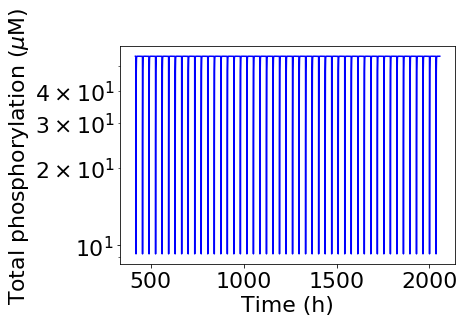

period = 126325.89779254235
nIP = 118
$\tilde{P}$ $(\mu$M$)$ = 1.151395399326448e-09


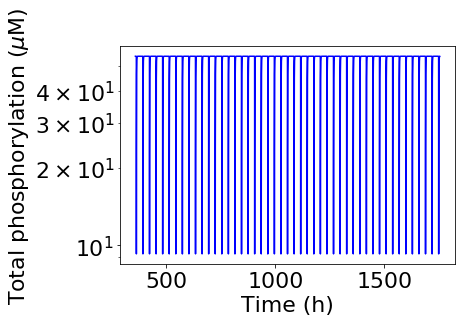

period = 108586.14177506324
nIP = 118
$\tilde{P}$ $(\mu$M$)$ = 1.8420699693267164e-09


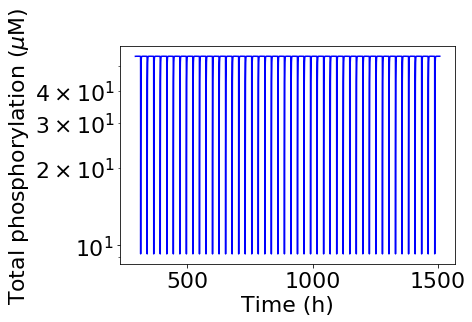

period = 93971.8455902068
nIP = 116
$\tilde{P}$ $(\mu$M$)$ = 2.94705170255181e-09


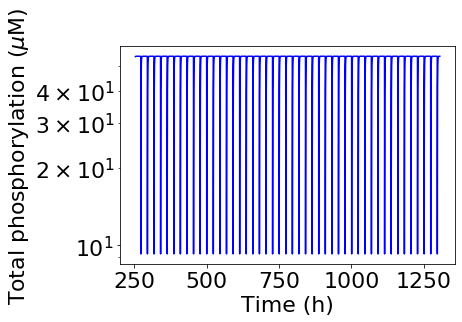

period = 81883.59893801436
nIP = 116
$\tilde{P}$ $(\mu$M$)$ = 4.71486636345739e-09


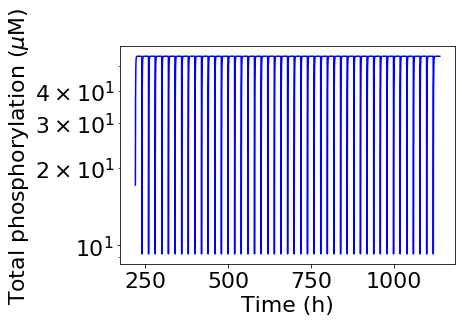

period = 71843.06538681453
nIP = 114
$\tilde{P}$ $(\mu$M$)$ = 7.543120063354607e-09


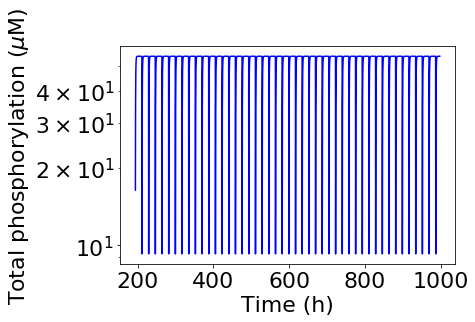

period = 63449.837252847385
nIP = 114
$\tilde{P}$ $(\mu$M$)$ = 1.206792640639329e-08


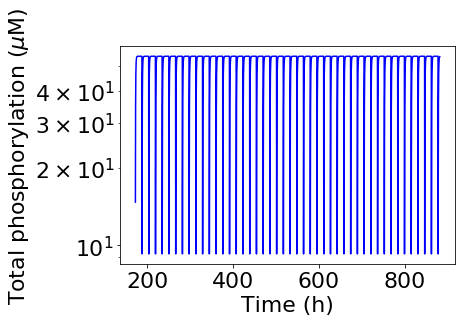

period = 56399.00984312873
nIP = 114
$\tilde{P}$ $(\mu$M$)$ = 1.9306977288832496e-08


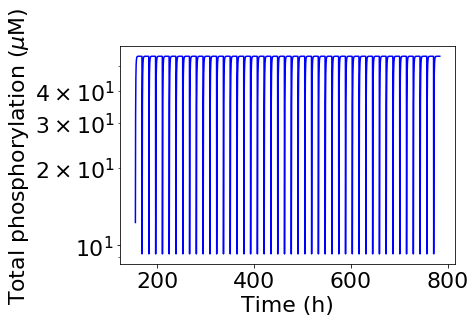

period = 50439.83172476292
nIP = 112
$\tilde{P}$ $(\mu$M$)$ = 3.088843596477485e-08


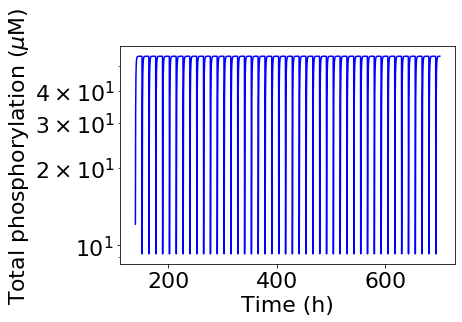

period = 45364.827446214855
nIP = 112
$\tilde{P}$ $(\mu$M$)$ = 4.9417133613238385e-08


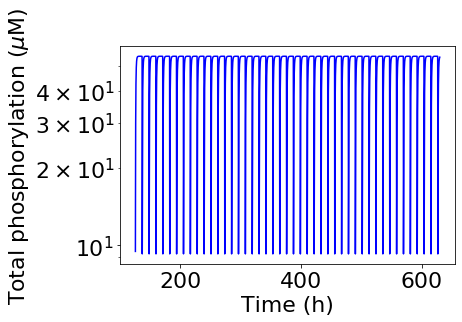

period = 41020.745131690055
nIP = 112
$\tilde{P}$ $(\mu$M$)$ = 7.906043210907701e-08


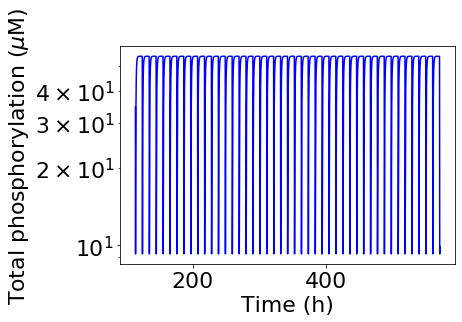

period = 37266.30947701167
nIP = 111
$\tilde{P}$ $(\mu$M$)$ = 1.2648552168552957e-07


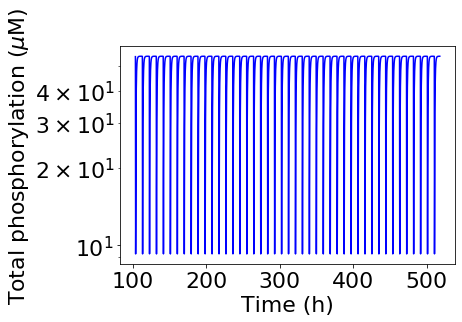

period = 34020.32422423852
nIP = 110
$\tilde{P}$ $(\mu$M$)$ = 2.0235896477251556e-07


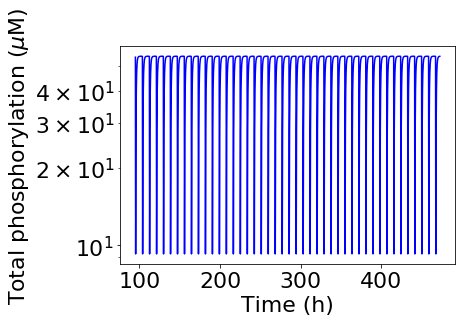

period = 31160.35278272815
nIP = 110
$\tilde{P}$ $(\mu$M$)$ = 3.2374575428176464e-07


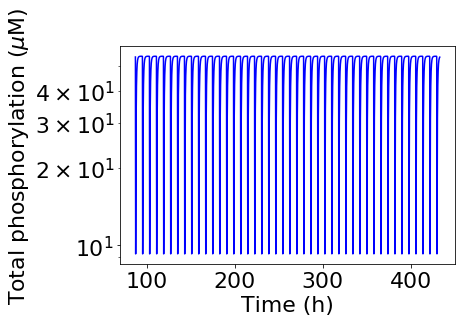

period = 28628.276144881966
nIP = 110
$\tilde{P}$ $(\mu$M$)$ = 5.179474679231213e-07


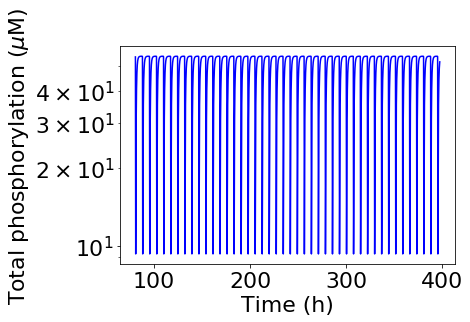

period = 26365.704891010653
nIP = 110
$\tilde{P}$ $(\mu$M$)$ = 8.286427728546842e-07


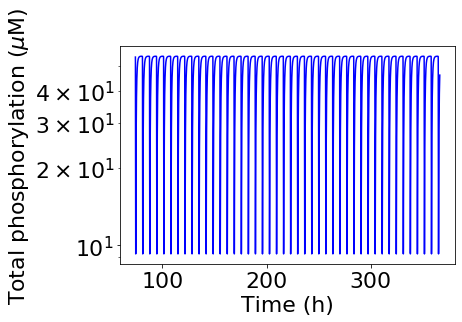

period = 24321.661609089235
nIP = 110
$\tilde{P}$ $(\mu$M$)$ = 1.3257113655901108e-06


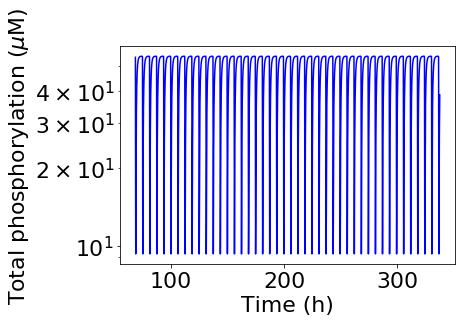

period = 22458.51881268155
nIP = 110
$\tilde{P}$ $(\mu$M$)$ = 2.1209508879201924e-06


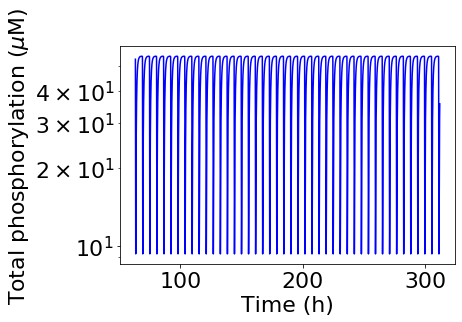

period = 20738.741763097
nIP = 110
$\tilde{P}$ $(\mu$M$)$ = 3.3932217718953298e-06


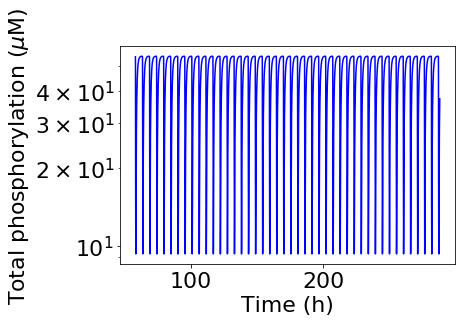

period = 19142.275790098356
nIP = 110
$\tilde{P}$ $(\mu$M$)$ = 5.428675439323859e-06


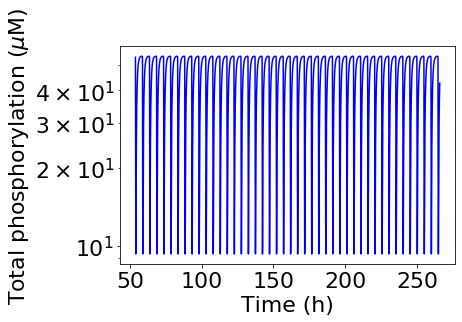

period = 17647.5748217277
nIP = 110
$\tilde{P}$ $(\mu$M$)$ = 8.68511373751352e-06


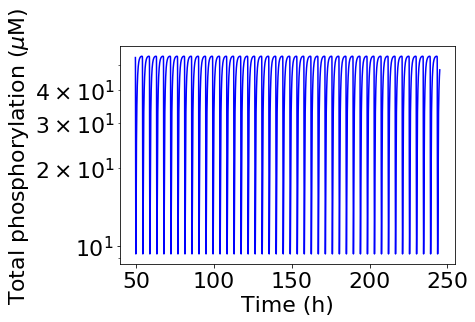

period = 16237.561582444934
nIP = 110
$\tilde{P}$ $(\mu$M$)$ = 1.3894954943731388e-05


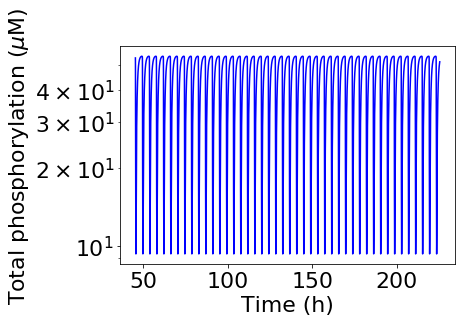

period = 14895.637039120891
nIP = 110
$\tilde{P}$ $(\mu$M$)$ = 2.2229964825261955e-05


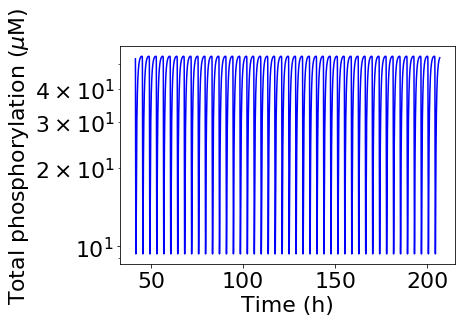

period = 13621.793791639502
nIP = 110
$\tilde{P}$ $(\mu$M$)$ = 3.5564803062231284e-05


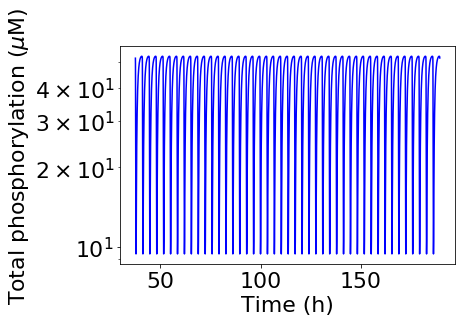

period = 12391.73408244201
nIP = 110
$\tilde{P}$ $(\mu$M$)$ = 5.689866029018305e-05


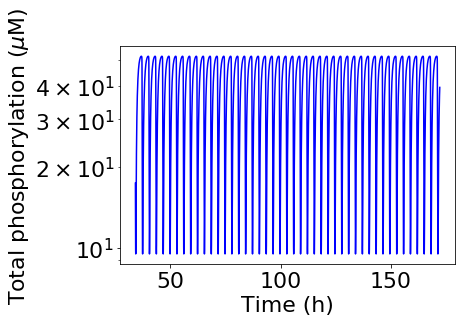

period = 11200.963829728542
nIP = 112
$\tilde{P}$ $(\mu$M$)$ = 9.102981779915228e-05


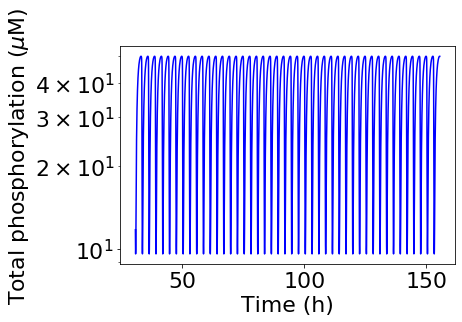

period = 10020.582717594923
nIP = 112
$\tilde{P}$ $(\mu$M$)$ = 0.00014563484775012445


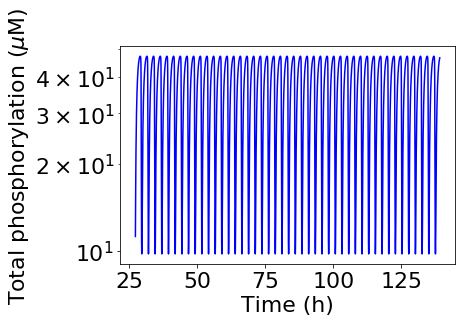

period = 8831.72235909343
nIP = 114
$\tilde{P}$ $(\mu$M$)$ = 0.00023299518105153718


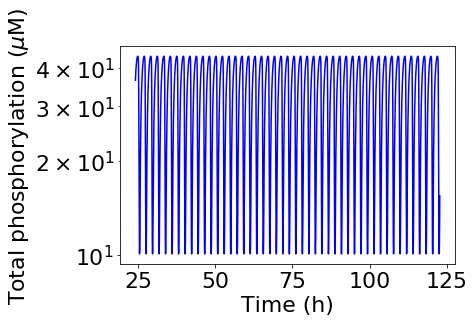

period = 7579.75323573238
nIP = 117
$\tilde{P}$ $(\mu$M$)$ = 0.0003727593720314938


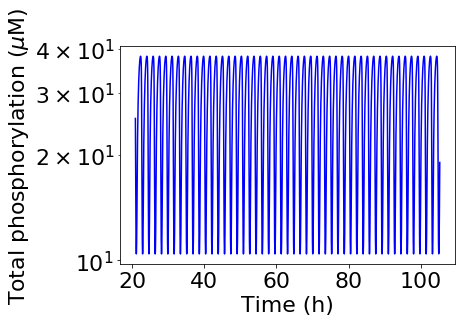

period = 6284.070954024501
nIP = 122
$\tilde{P}$ $(\mu$M$)$ = 0.0005963623316594637


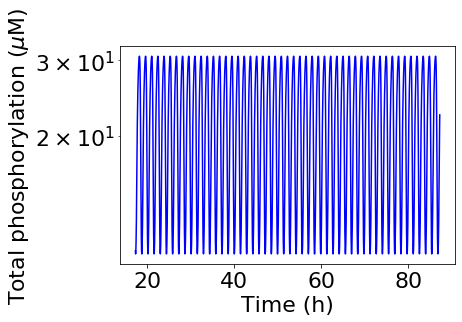

period = 5106.467212149
nIP = 124
$\tilde{P}$ $(\mu$M$)$ = 0.0009540954763499963


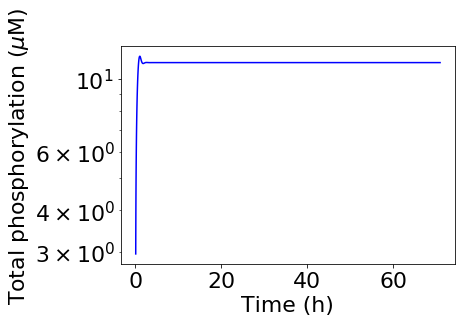

period = 0
nIP = 10
$\tilde{P}$ $(\mu$M$)$ = 0.0015264179671752366


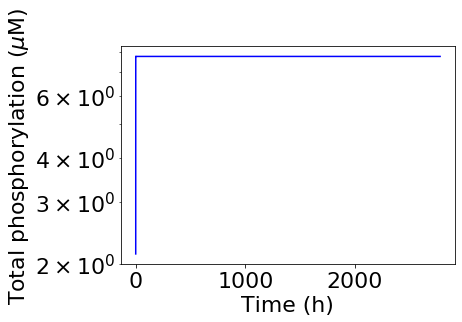

period = 0
nIP = 6
$\tilde{P}$ $(\mu$M$)$ = 0.002442053094548655


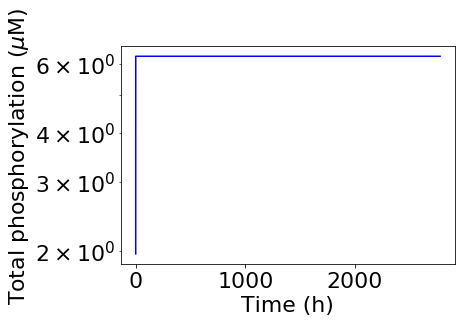

period = 0
nIP = 4
$\tilde{P}$ $(\mu$M$)$ = 0.003906939937054621


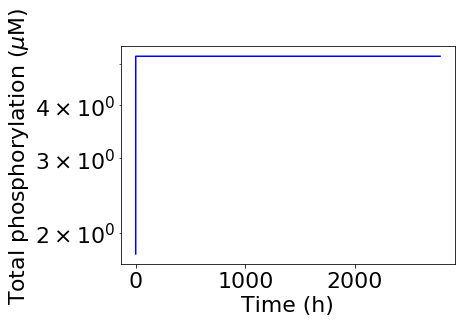

period = 0
nIP = 5
$\tilde{P}$ $(\mu$M$)$ = 0.006250551925273976


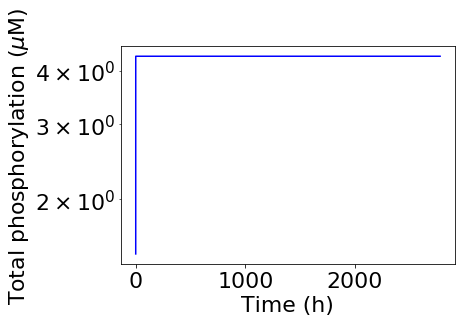

period = 0
nIP = 3
$\tilde{P}$ $(\mu$M$)$ = 0.01


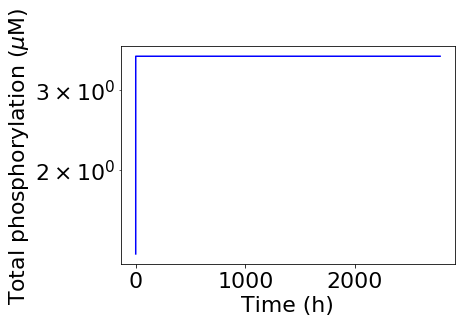

period = 0
nIP = 4


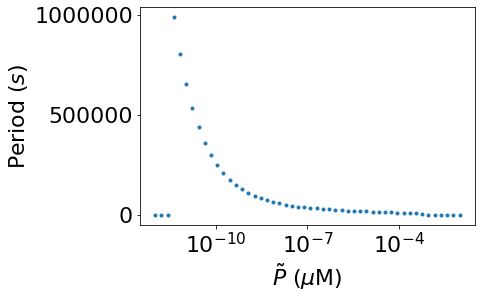

In [26]:
logscale = True
if logscale:
    ptildes2 = np.logspace(-12, -2, num_points, base=10)
else:
    ptildes2 = np.linspace(1e-8, 1e-6, num_points)
period_fxn_ptilde2 = robustness2(8, ptildes2, logscale, initial_period=1e7)

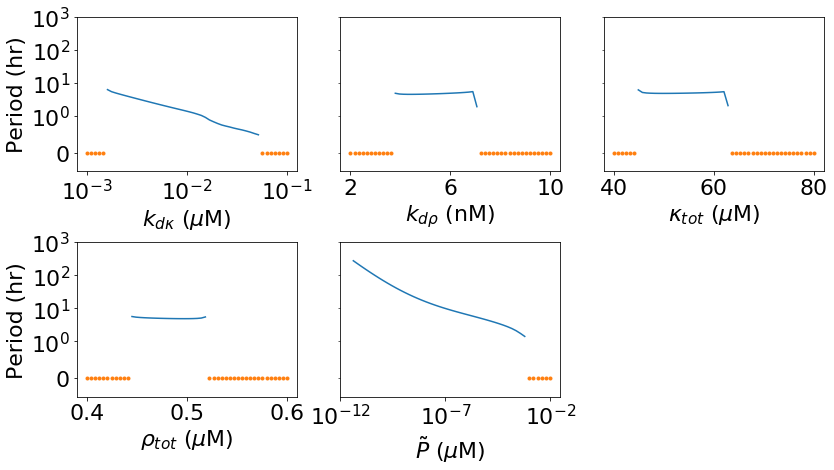

In [27]:
fig, axs = plt.subplots(2,3, figsize=(12,7))

axs[0, 0].plot(kdks2[period_fxn_kdk2 > 0], period_fxn_kdk2[period_fxn_kdk2>0])
axs[0, 0].plot(kdks2[period_fxn_kdk2 == 0], period_fxn_kdk2[period_fxn_kdk2 == 0], '.')
axs[0, 0].set_xlabel(var_list[0])
axs[0, 0].set_xscale('log')
axs[0, 0].set_xticks([1e-3, 1e-2, 1e-1])
# axs[0, 0].xaxis.grid(True, which='minor')
# axs[0, 0].tick_params(axis='x', which='minor')
# axs[0, 0].get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
axs[0, 0].set_ylabel('Period (hr)')
axs[0, 0].set_ylim([-.5, 1e3])
axs[0, 0].set_yscale('symlog', linthreshy=1e0)

kdps2_plot = kdps2 * 1e3
axs[0, 1].plot(kdps2_plot[period_fxn_kdp2 > 0], period_fxn_kdp2[period_fxn_kdp2 > 0])
axs[0, 1].plot(kdps2_plot[period_fxn_kdp2 == 0], period_fxn_kdp2[period_fxn_kdp2 == 0], '.')
axs[0, 1].set_xlabel(r'$k_{d\rho}$ $($nM$)$')
# axs[0, 1].set_xscale ('log')
axs[0, 1].set_xticks([2, 6, 10])
axs[0, 1].set_ylim([-.5, 1e3])
axs[0, 1].set_yscale('symlog', linthreshy=1e0)
axs[0, 1].set_yticks([])

axs[0, 2].plot(ktots2[period_fxn_ktot2>0], period_fxn_ktot2[period_fxn_ktot2>0])
axs[0, 2].plot(ktots2[period_fxn_ktot2==0], period_fxn_ktot2[period_fxn_ktot2==0], '.')
axs[0, 2].set_xlabel(var_list[6])
# axs[0, 2].set_xticks([0, 0.001, 0.002])
# axs[0, 2].set_xticklabels(['0', '1', '2'])
# plt.ticklabel_format(style='sci', axis='x', scilimits=(-5,-5))
axs[0, 2].set_ylim([-.5, 1e3])
axs[0, 2].set_yscale('symlog', linthreshy=1e0)
axs[0, 2].set_yticks([])

axs[1, 0].plot(ptots2[period_fxn_ptot2>0], period_fxn_ptot2[period_fxn_ptot2>0])
axs[1, 0].plot(ptots2[period_fxn_ptot2==0], period_fxn_ptot2[period_fxn_ptot2==0], '.')
axs[1, 0].set_xlabel(var_list[7])
# axs[1, 0].set_xticks([0, 5e-3, 1e-2, 1.5e-2])
# axs[1, 0].set_xticklabels(['0', '5', '10', '15'])
axs[1, 0].set_ylim([-.5, 1e3])
axs[1, 0].set_yscale('symlog', linthreshy=1e0)
axs[1, 0].set_ylabel('Period (hr)')


axs[1, 1].plot(ptildes2[3:][period_fxn_ptilde2[3:]>0], period_fxn_ptilde2[3:][period_fxn_ptilde2[3:]>0])
axs[1, 1].plot(ptildes2[3:][period_fxn_ptilde2[3:]==0], period_fxn_ptilde2[3:][period_fxn_ptilde2[3:]==0], '.')
axs[1, 1].set_xlabel(var_list[8])
axs[1, 1].set_xscale('log')
axs[1, 1].set_xticks([1e-12, 1e-7, 1e-2])
axs[1, 1].set_ylim([-.5, 1e3])
axs[1, 1].set_yscale('symlog', linthreshy=1e0)
axs[1, 1].set_yticks([])

axs[1, 2].set_visible(False)

plt.tight_layout(h_pad=0, w_pad=0.2)
# plt.savefig('robustness_unbounded_2.png', 
#             dpi=800, bbox_inches='tight')
# plt.savefig('robustness_unbounded_2_small.png', 
#             bbox_inches='tight')
plt.show()